![image.png](./figures/nuclei_figure.png)
# Code companion to:
## High resolution mapping of the breast cancer tumor microenvironment using integrated single cell, spatial and in situ analysis of FFPE tissue
Amanda Janesick, Robert Shelansky, Andrew Gottscho, Florian Wagner, Morgane Rouault, Ghezal Beliakoff, Michelli Faria de Oliveira, Andrew Kohlway, Jawad Abousoud, Carolyn Morrison, Tingsheng Yu Drennon, Syrus Mohabbat, Stephen Williams, 10x Development Teams, Sarah Taylor

October 20, 2023

Link to the paper: https://www.biorxiv.org/content/10.1101/2022.10.06.510405v1

Link to the data: https://www.10xgenomics.com/products/xenium-in-situ/preview-dataset-human-breast

Available for download from GitHub: https://github.com/10XGenomics/janesick_nature_comms_2023_companion
![image.png](./figures/F1.large.jpg)



In [ ]:
## 2025.06.23 copy form 
##            cp -r /mnt/lingyu/nfs_share2/Python/Xenium/janesick_nature_comms_2023_companion-main/companion_notebook_compare_ROI.ipynb FineST/FineST_demo/tutorial/
##

## Synopsis
This notebook demonstrates the registration of Xenium and Visium data from two serial formalin-fixed, paraffin-embedded (FFPE) human breast cancer sections. It first generates a number of explanatory figures showcasing the Xenium and Visium coordinate systems. It then visualizes how those coordinate systems relate to one another using a keypoint registration between the Xenium nuclear morphology image and the Visium H&E image generated using Xenium Explorer. The notebook then continues on using that registration to produce many of the analysis and panel figures from this publication including overlaying Xenium segmentation and cell typing data, spot interpolation of Xenium data into the Visium spot grid, transcript correlation analysis between Xenium and Visium data, and MLE celltype inference of Visium spots from Xenium data.    

## Quick start guide
#### Install conda and setup the conda environment
Conda installation instructions may be found [here](https://conda.io/projects/conda/en/latest/user-guide/install/index.html). If you choose to install miniconda, you will also need to install [jupyter](https://jupyter.org/) and its dependencies. 

The conda environment file, ```environment.yaml```, may be found in the [10xGenomics github repository](https://github.com/10XGenomics/janesick_nature_comms_2023_companion). To create the publication environment, run the following commands in the terminal. After creating the environment from within the open notebook, select the environment, ```xenium-publication-env```, from the ```kernels``` dropdown menu. A resource for managing conda environments may be found [here](https://conda.io/projects/conda/en/latest/user-guide/tasks/manage-environments.html). 

### Publication data paths
Data used in this document can be downloaded at https://www.10xgenomics.com/products/xenium-in-situ/preview-dataset-human-breast.  For this analysis we will use data from ```In Situ Sample 1, Replicate 1``` and ```Visium Spatial```. In addition, you will also need to download the  ```Cell_Barcode_Type_Matrices.xlsx``` found in ```In Situ Sample 1, Replicate 1``` under the heading ```Cell Type Annotations```. Data for the publication can also be obtained from [GEO:GSE243275](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE243275).

#### Saving the cell_groups.csv file
The ```Cell_Barcode_Type_Matrices.xlsx``` contains all the annotation for the paper. For this analysis we will only make use of the supervised labeling from Xenium Sample 1, Replicate 1. Use ```SaveAs``` to save the ```Xenium R1 Fig1-5 (supervised)``` tab as a CSV file. We will refer to it in the code as the ```cell_groups.csv```. Move the ```cell_groups.csv``` into the ```xenium-publication``` directory we just created. 

In [1]:
# ## 2024.01.09 LLY add
# cd /mnt/lingyu/nfs_share2/Python/
# cp -r iSTAR/GSE243280/GSM7780153_Xenium_R1_Fig1-5_supervised.csv.gz Xenium/xenium-publication/GSM7780153_Xenium_R1_Fig1-5_supervised.csv.gz
# cd Xenium/xenium-publication/
# gunzip GSM7780153_Xenium_R1_Fig1-5_supervised.csv.gz
# cp -r GSM7780153_Xenium_R1_Fig1-5_supervised.csv cell_groups.csv

#### Define data paths
The following file paths assume that the xenium-publication was created as described above in the user's $HOME directory. If not, please be sure to change the paths accordingly.

## Begin

In [2]:
## 2024.01.09 Try to run this demo and gen the expression of one gene using Xunimum data
## using the Python 3(ipykernel) 在安装过程中默认的
## 2024.07.31 Update the ROI, using Polygon
## 2024.08.02 Xenium ground truth, using the sing cell data, not binned_spot 
## 2024.08.06 Xenium ground truth, using the sing cell data and binned_spot as ground truth
## 2024.08.07 add the TransImp results, using pseudo-visium

In [1]:
import os
# path = '/Users/lilingyu/E/PhD/Python/'
# path = '/storage3/yhhuang/users/lingyu/'
# path = '/data/users/lingyu/'
# path = '/home/lly/Python/'
path = '/mnt/lingyu/nfs_share2/Python/'

In [2]:
from pathlib import Path
path_to_visium_bundle = Path(str(path)+"Xenium/xenium-publication/visium/").expanduser()
path_to_xenium_bundle = Path(str(path)+"Xenium/xenium-publication/xenium/outs").expanduser()
path_to_xenium_celltype_labels = Path(str(path)+"Xenium/xenium-publication/cell_groups.csv").expanduser()

### Module Imports

In [3]:
import json
from collections import namedtuple, Counter

import numpy as np
import scanpy as sc
import pandas as pd

## Image manipulation and geometry
from tifffile import imread
from skimage.io import imread as skimread

## Plotting imports
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize, to_hex, Colormap
from matplotlib.cm import ScalarMappable

### Functions for registration of Xenium to Visium data and associated analyis and visualization
## Visualization functions
os.chdir(f'{path}Xenium/janesick_nature_comms_2023_companion-main')
from companion_functions import (
    hexlist_to_cmap,
    polygons_coords_to_patch_collection,
    plot_polygons,
    hex_corner_offset,
    polygon_corners,
    celltypes,
    celltypes,
    hex_codes,
    ctype_to_code_map,
    ctype_hex_map,
    ctype_cmap,
)

## Analysis functions
from companion_functions import (
    unique_encode,
    get_xenium_to_morphology_transform_from_xenium_morphology_image,
    get_xenium_capture_polygon_um,
    transform_coordinates,
    get_median_spot_to_spot_distance_from_centroids,
    generate_space_filling_visium_polygons,
    get_visium_capture_polygon,
    __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__,
    bin_xenium_data_to_visium_spots,
    generate_anndata_matrix_from_transcript_assignments,
)

#### Outputs for Visium data
For an overview of Visium output files, see [this page](https://www.10xgenomics.com/support/software/space-ranger/analysis/outputs/output-overview).


In [4]:
## Load Visium spot X gene matrix
visium_adata = sc.read_10x_h5(path_to_visium_bundle / "CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5")

## Load Visium spot position information
visium_tissue_positions = (
    pd.read_csv(path_to_visium_bundle / "spatial" / "tissue_positions.csv")
    .set_index("barcode")
    .reindex(visium_adata.obs.index)
)

## Load Visium scale metadata
## Contains scalefactors to transform between Visium full resolution and the high resolution images.
with open(path_to_visium_bundle / "spatial" / "scalefactors_json.json") as file:
    visium_scale_factors = json.load(file)

## Load the Visium high resolution H&E for plotting
visium_high_res_image = skimread(
    path_to_visium_bundle / "spatial" / "tissue_hires_image.png"
)

/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1900: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1900: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


#### IO for Xenium data
Information about the Xenium output bundle may be found [here](https://www.10xgenomics.com/support/in-situ-gene-expression/documentation/steps/onboard-analysis/understanding-xenium-outputs).


In [5]:
## Read in Xenium transcript data and decode the bytes column to string
xenium_transcripts = pd.read_parquet(path_to_xenium_bundle / "transcripts.parquet")
print("xenium_transcripts_shape:\n", xenium_transcripts.shape)
xenium_transcripts.feature_name = xenium_transcripts.feature_name.str.decode("utf-8")

## Read in the Xenium cell positions and cell metadata.
xenium_cell_info = pd.read_csv(path_to_xenium_bundle / "cells.csv.gz").set_index(
    "cell_id"
)

## Read in the Xenium morphology (DAPI) MIP image. Note: We are reading the image at the resolution of
## the third pyramid level: full_resolution / 2 ** 3. We are using this image for plotting.
## The Xenium imaging area is large, and the full resolution image is large enough to be slow to plot.
## Working with a lower resolution image when possible is a convenience.
pyramid_level = 3
xenium_morphology_mip_at_pyramid_level = imread(
    path_to_xenium_bundle / "morphology_mip.ome.tif", series=0, level=pyramid_level
)

## Read in the nucleus boundary polygon information. Xenium polygons are a plotting convenience and should not
## be used for analysis. A nucleus mask is provided for analysis of Xenium segmentation.
xenium_nucleous_boundaries_df = pd.read_parquet(
    path_to_xenium_bundle / "nucleus_boundaries.parquet"
)

## Transformation matrix to transform from the Xenium coordinate system to the morphology image coordinate system
## at pyramid level. Determined using the pixel size of the morphology image. 
xenium_to_morphology_at_pyramid_transformation = (
    get_xenium_to_morphology_transform_from_xenium_morphology_image(
        path_to_xenium_bundle / "morphology_mip.ome.tif", pyramid_level
    )
)

## Cell type assignments as determined by label transfer from a matched FLEX dataset.
## This is a supplemental file provided within the publication.
## barcode X celltype
xenium_celltype_df = pd.read_csv(path_to_xenium_celltype_labels).set_index("Barcode")

xenium_transcripts_shape:
 (42638083, 8)


### The transformation matrix as determined by registration using Xenium Explorer
The following registration matrix was generated using the Xenium Explorer registration tool.
The full resolution Visium H&E image was loaded into Xenium Explorer's H&E registration workflow, then the transformation matrix was exported using the transformation export feature. It was directly copied into the cell below for convenience. Some further addendums to the transformation matrix are required to map Xenium coordinates into Visium coordinates. They are described inline. 

registration matrix 是使用 Xenium Explorer registration tool生成的。 
将full resolution Visium H&E image 加载到 Xenium Explorer 的 H&E registration workflow中，然后使用transformation export feature导出transformation matrix 。 为了方便，直接复制到下面的单元格中。 需要对transformation matrix进行一些补充才能将  Xenium coordinates 映射到 Visium coordinates。 它们是内联描述的。

For information about the Xenium Explorer H&E registration workflow, see the [Xenium Explorer image alignment tutorial](
https://www.10xgenomics.com/support/software/xenium-explorer/tutorials/xe-image-alignment).

In [6]:
## Transformation matrix exported from Xenium Explorer
xenium_morphology_to_visium_full_res_transformation = np.array(
    [
        [1.87594468e-02, -4.07641677e-01, 1.63476055e04],
        [3.91300071e-01, 1.26819551e-02, 4.12499099e03],
        [-8.39854141e-08, -9.91112632e-07, 1.03706895e00],
    ]
)

## Transformation matrix between Xenium full resolution (DAPI) morphology image and the Xenium coordinate system.
xenium_to_morphology_transformation = (
    get_xenium_to_morphology_transform_from_xenium_morphology_image(
        path_to_xenium_bundle / "morphology_mip.ome.tif", 0
    )
)

## Xenium coordinates must be transformed into image coordinates before being transformed into Visium image coordinates.
## The following describes that combined transformation (a matrix multiplication of the two transformation matrices).
xenium_to_visium_full_res_transformation = (
    xenium_morphology_to_visium_full_res_transformation
    @ xenium_to_morphology_transformation
)
print("xenium_to_visium_full_res_transformation: ", xenium_to_visium_full_res_transformation.shape)

xenium_to_visium_full_res_transformation:  (3, 3)


#### Figure demonstrating the Xenium/Visium registration

The Visium H&E high resolution image is displayed with Xenium cell coordinates transformed and overlaid in gold. For demonstration, the Xenium morphology image bounding polygon is displayed in blue.

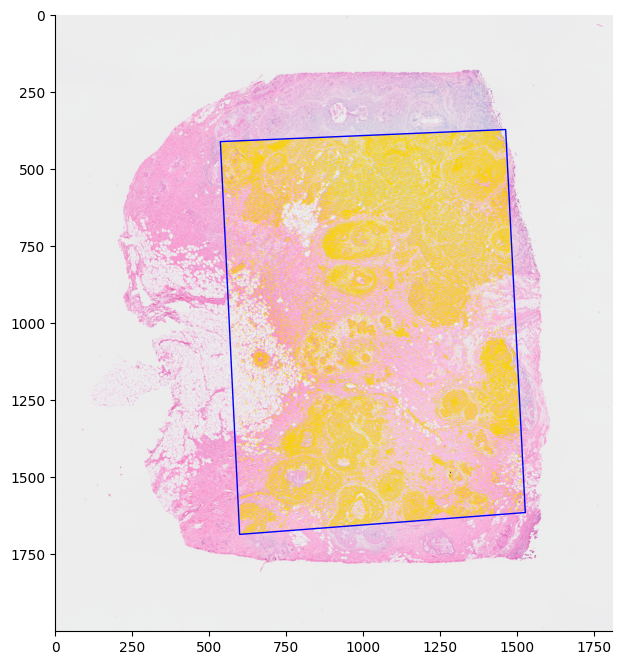

In [7]:
## data setup
## Xenium cell coordinates are transformed first into Visium full resolution image coordinates,
## and then scaled to high resolution image coordinates.
xenium_cell_centroids_visium_high_res = (
    transform_coordinates(
        xenium_cell_info[["x_centroid", "y_centroid"]].values,
        xenium_to_visium_full_res_transformation,
    )
    * visium_scale_factors["tissue_hires_scalef"]
)

## The Xenium capture polygon is obtained and similarly transformed.
xenium_capture_polygon_um = get_xenium_capture_polygon_um(path_to_xenium_bundle)
xenium_capture_polygon_visium_high_res = (
    transform_coordinates(
        xenium_capture_polygon_um, xenium_to_visium_full_res_transformation
    )
    * visium_scale_factors["tissue_hires_scalef"]
)

## plot style setup
fig = plt.figure(figsize=(8, 8))
ax = plt.gca()

## plotting code
ax.imshow(visium_high_res_image)
ax.scatter(
    *xenium_cell_centroids_visium_high_res.T,
    s=0.1,
    linewidth=0,
    edgecolor=None,
    marker="o",
    color="gold"
)
plot_polygons(
    [xenium_capture_polygon_visium_high_res],
    ax=ax,
    facecolor=(0, 0, 0, 0),
    edgecolor="blue",
    linewidth=1,
)

## plot style adjustments
ax.spines.right.set_visible(False)
ax.spines.top.set_visible(False)
ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
ax.set_aspect("equal", adjustable="box")

In [8]:
xenium_cell_centroids_visium_high_res.shape

(167780, 2)

## Xenium to pseudo visium adata

### 使用到 visium 坐标系的变换将 xenium 坐标分配给 visium 点。 坐标由最近邻居分配。 
例如 每个 transcript/cell etc 在转化后都会分配给 closest Visium barcode。 还过滤位于估计捕获区域之外的坐标。

In [9]:
## 下面第一个 function: 生成代表 visium capture area 的多边形。
## 它计算所有 Visium spots 的凸包(convex hull), 然后将凸厅(convex hall)填充一点的直径。 这用于过滤捕获区域之外的数据以及可视化。

from shapely.geometry import LinearRing
def get_visium_capture_polygon(
    spot_centroids: np.ndarray[np.float32, (None, 2)], spot_diameter: float
) -> np.ndarray[np.float32, (None, 2)]:
    """
    Generates a polygon representing the visium capture area; It calculates the convex hull of all Visium spots
    then pads the convex hall by the diameter of one spot. This is used for filtering data outside the capture area
    as well as visualization.

    https://en.wikipedia.org/wiki/Convex_hull
    """
    convex_hull = ConvexHull(spot_centroids)
    convex_poly = convex_hull.points[convex_hull.vertices]

    padded_convex_polly = np.array(
        LinearRing(convex_poly).buffer(spot_diameter).exterior.coords.xy
    ).T
    return padded_convex_polly


from cv2 import perspectiveTransform
def transform_coordinates(
    coords: np.ndarray[np.float32, (None, 2)], transform_matrix: np.ndarray[np.float32]
) -> np.ndarray[np.float32, (None, 2)]:
    """Transforms coordinates using transform.
    https://en.wikipedia.org/wiki/Homography_(computer_vision)
    """
    return perspectiveTransform(
        coords.reshape(-1, 1, 2).astype(np.float32), transform_matrix
    )[:, 0, :]

from skimage.measure import points_in_poly
from scipy.spatial import KDTree, ConvexHull
def bin_xenium_data_to_visium_spots(
    visium_spot_centroids: np.ndarray[np.float32, (None, 2)],
    visium_spot_diameter: float,
    visium_barcodes: np.ndarray[str, (None, 2)],
    xenium_coords: np.ndarray[np.float32, (None, 2)],
    xenium_to_visium_transform: np.ndarray[np.float32],
) -> np.ndarray[str]:
    """
    Assigns xenium coordinates to visium spots using a transform into the visium coordinate system.
    Coordinates are assigned by nearest neighbor.
    e.g. each Xenium transcript/cell etc is assigned to the closest Visium barcode after transformation.
    Also filters coordinates that lie outside an estimated capture area.
    """
    xenium_coords_in_visium = transform_coordinates(    ## perspectiveTransform function
        xenium_coords, xenium_to_visium_transform
    )
    #####################################################################################
    # ## the above equals to the next line:
    # perspectiveTransform(
    #     coords.reshape(-1, 1, 2).astype(np.float32), transform_matrix
    # )[:, 0, :]
    #####################################################################################
    
    kdtree = KDTree(visium_spot_centroids)
    _, neighbors = kdtree.query(xenium_coords_in_visium, k=1)
    barcode_assignments = visium_barcodes[neighbors]

    visium_capture_polygon_full_res = get_visium_capture_polygon(
        spot_centroids=visium_spot_centroids, spot_diameter=visium_spot_diameter
    )
    barcode_assignments[
        ~points_in_poly(xenium_coords_in_visium, visium_capture_polygon_full_res)
    ] = __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
    return barcode_assignments

In [10]:
## Filter Xenium transcripts for only *high* quality transcripts. The Xenium cell-feature matrix is generated only
## from high quality transcripts. However, the Xenium output bundle includes low quality transcripts. The following
## interpolation is to be accomplished using the same transcripts found in the cell-feature matrix.
## For more information see:
## https://www.10xgenomics.com/resources/analysis-guides/continuing-your-journey-after-xenium-analyzer

xenium_transcript_selection = xenium_transcripts.qv >= 20
print("xenium_transcript_selection_shape:\n", xenium_transcript_selection.shape)

## Transcript to spot interpolation
xenium_spotbinned_transcript_barcodes = bin_xenium_data_to_visium_spots(
    visium_spot_centroids=visium_tissue_positions[
        ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    ].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    xenium_coords=xenium_transcripts[xenium_transcript_selection][
        ["x_location", "y_location"]
    ].values,
    xenium_to_visium_transform=xenium_to_visium_full_res_transformation,
)
print("xenium_spotbinned_transcript_barcodes_shape:\n", xenium_spotbinned_transcript_barcodes.shape)

## The Xenium capture area does not perfectly overlap the Visium capture area. We want to
## ignore Xenium transcripts which fall outside of the overlap.
## Xenium 捕获区域与 Visium 捕获区域不完全重叠。 我们想要忽略重叠之外的 Xenium 转录本。
unassigned_transcript_mask = (
    xenium_spotbinned_transcript_barcodes != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generating a cell-feature matrix from the interpolation
xenium_spotbinned_transcript_adata = (
    generate_anndata_matrix_from_transcript_assignments(
        barcodes=xenium_spotbinned_transcript_barcodes[unassigned_transcript_mask],
        feature_names=xenium_transcripts[xenium_transcript_selection][
            unassigned_transcript_mask
        ]["feature_name"].values,
    )
)

feature_barcode_df = xenium_spotbinned_transcript_adata.to_df()
print("xenium_spotbinned_transcript_adata_shape:\n", xenium_spotbinned_transcript_adata.shape)

xenium_transcript_selection_shape:
 (42638083,)
xenium_spotbinned_transcript_barcodes_shape:
 (34493510,)
xenium_spotbinned_transcript_adata_shape:
 (3996, 541)


In [11]:
## pseudo-spot_gene
print(xenium_spotbinned_transcript_adata)
print(xenium_spotbinned_transcript_adata.obs_names)
print(xenium_spotbinned_transcript_adata.var_names)

AnnData object with n_obs × n_vars = 3996 × 541
Index(['ACTATTAGACAGGCTG-1', 'ATAATCGTAGTTATTC-1', 'GTTGAATGTCCTTCTG-1',
       'GATTCCTGTTCGCACC-1', 'GTGCCACCTAGCAGCC-1', 'GCTCGGACCTTCAAGT-1',
       'ATAATTCTCCGGTCGG-1', 'ATTGTTATACTTCACG-1', 'TGCTTAGTTGACTTAC-1',
       'GGATAATTCAATGCTG-1',
       ...
       'GGCGCCGTGGTTACAT-1', 'AGGTGAAGTGACGACT-1', 'GATTGTCGCAACGAGG-1',
       'GATAGTGACACTCCAA-1', 'CTCCAGAATATTACAT-1', 'CCGGAGAAGCTAACCA-1',
       'CGCCTTATCTTGGCGA-1', 'CTTAGTAAGCGTGGCA-1', 'TGTATCGGCGGTCGCA-1',
       'GCAATTCCTATCATAC-1'],
      dtype='object', length=3996)
Index(['NegControlCodeword_0514', 'PRF1', 'CD274', 'BLANK_0481', 'VOPP1',
       'APOBEC3A', 'BLANK_0472', 'POLR2J3', 'NegControlCodeword_0507',
       'BLANK_0437',
       ...
       'CCPG1', 'IGSF6', 'LILRA4', 'S100A4', 'C15orf48', 'SELL', 'PDGFRB',
       'THAP2', 'PCOLCE', 'DSC2'],
      dtype='object', length=541)


### Visium spot interpolation of Xenium cell data using Xenium/Visium registration

-Figure demonstrating cell and cell type  interpolation of Visium data from Xenium data

-Similar to transcript counts, the Xenium cells themselves may be binned to Visium spots. 

-The figure below overlays Xenium cells and their cell types on top of Visium space-filling polygons.

-The following dataset is composed of exactly this binning. 

In [12]:
## Filter Xenium transcripts for only *high* quality transcripts. The Xenium cell-feature matrix is generated only
## from high quality transcripts. However, the Xenium output bundle includes low quality transcripts. The following
## interpolation is to be accomplished using the same transcripts found in the cell-feature matrix.
## For more information see:
## https://www.10xgenomics.com/resources/analysis-guides/continuing-your-journey-after-xenium-analyzer

xenium_transcript_selection = xenium_transcripts.qv >= 20
print("xenium_transcript_selection_shape:\n", xenium_transcript_selection.shape)


####################
# Important
####################
## Transcript to spot interpolation
xenium_spotbinned_transcript_barcodes = bin_xenium_data_to_visium_spots(
    visium_spot_centroids=visium_tissue_positions[
        ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    ].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    xenium_coords=xenium_transcripts[xenium_transcript_selection][
        ["x_location", "y_location"]
    ].values,
    xenium_to_visium_transform=xenium_to_visium_full_res_transformation,
)
print("xenium_spotbinned_transcript_barcodes_shape:\n", xenium_spotbinned_transcript_barcodes.shape)

## The Xenium capture area does not perfectly overlap the Visium capture area. We want to
## ignore Xenium transcripts which fall outside of the overlap.
## Xenium 捕获区域与 Visium 捕获区域不完全重叠。 我们想要忽略重叠之外的 Xenium 转录本。
unassigned_transcript_mask = (
    xenium_spotbinned_transcript_barcodes != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generating a cell-feature matrix from the interpolation：adata
xenium_spotbinned_transcript_adata = (
    generate_anndata_matrix_from_transcript_assignments(
        barcodes=xenium_spotbinned_transcript_barcodes[unassigned_transcript_mask],
        feature_names=xenium_transcripts[xenium_transcript_selection][
            unassigned_transcript_mask
        ]["feature_name"].values,
    )
)
print("xenium_spotbinned_transcript_adata_shape:\n", xenium_spotbinned_transcript_adata.shape)

xenium_transcript_selection_shape:
 (42638083,)
xenium_spotbinned_transcript_barcodes_shape:
 (34493510,)
xenium_spotbinned_transcript_adata_shape:
 (3996, 541)


In [13]:
## Get cell -> Visium barcode assignments.
xenium_spotbinned_cell_barcodes = bin_xenium_data_to_visium_spots(
    visium_spot_centroids=visium_tissue_positions[
        ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    ].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    xenium_coords=xenium_cell_info[["x_centroid", "y_centroid"]].values,
    xenium_to_visium_transform=xenium_to_visium_full_res_transformation,
)

## Filter cells outside of Visium capture area.
unassigned_cell_mask = (
    xenium_spotbinned_cell_barcodes != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generate a spot X cell type dataframe.
xenium_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=xenium_spotbinned_cell_barcodes[unassigned_cell_mask],
    feature_names=xenium_celltype_df[unassigned_cell_mask]["Cluster"].values,
)
xenium_spotbinned_celltypes_df = xenium_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
xenium_spotbinned_celltypes_normed_df = xenium_spotbinned_celltypes_df.div(
    xenium_spotbinned_celltypes_df.sum(1), axis=0
)

In [14]:
print(xenium_spotbinned_cell_adata)
xenium_spotbinned_celltypes_normed_df.columns = xenium_spotbinned_celltypes_normed_df.columns.str.replace('_', ' ')
xenium_spotbinned_celltypes_normed_df

AnnData object with n_obs × n_vars = 3958 × 20


,Stromal & T Cell Hybrid,Macrophages 1,Mast Cells,Myoepi ACTA2+,Perivascular-Like,LAMP3+ DCs,IRF7+ DCs,DCIS 2,Stromal,Myoepi KRT15+,DCIS 1,CD8+ T Cells,T Cell & Tumor Hybrid,B Cells,Prolif Invasive Tumor,Invasive Tumor,CD4+ T Cells,Macrophages 2,Endothelial,Unlabeled
ACTATTAGACAGGCTG-1,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.833333,0.000000,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ATAATCGTAGTTATTC-1,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.016949,0.000000,0.000000,0.000000,0.000000,0.000000,0.033898,0.949153,0.000000,0.000000,0.000000,0.000000
GTTGAATGTCCTTCTG-1,0.000000,0.171429,0.0,0.371429,0.0,0.000000,0.000000,0.142857,0.200000,0.028571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.085714,0.000000
GATTCCTGTTCGCACC-1,0.050000,0.100000,0.0,0.083333,0.0,0.000000,0.000000,0.000000,0.350000,0.000000,0.066667,0.066667,0.000000,0.033333,0.000000,0.000000,0.083333,0.016667,0.083333,0.066667
GTGCCACCTAGCAGCC-1,0.014706,0.142157,0.0,0.000000,0.0,0.014706,0.009804,0.000000,0.049020,0.000000,0.000000,0.205882,0.000000,0.088235,0.000000,0.000000,0.431373,0.000000,0.009804,0.034314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCGGAGAAGCTAACCA-1,0.000000,0.113636,0.0,0.113636,0.0,0.000000,0.000000,0.159091,0.295455,0.136364,0.000000,0.000000,0.000000,0.022727,0.000000,0.000000,0.000000,0.000000,0.159091,0.000000
CGCCTTATCTTGGCGA-1,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.111111,0.000000,0.888889,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CTTAGTAAGCGTGGCA-1,0.000000,0.020408,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.040816,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.714286,0.000000,0.000000,0.061224,0.020408
CCTCACAATACAACTG-1,0.000000,0.034483,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.034483,0.000000,0.000000,0.017241,0.068966,0.000000,0.086207,0.741379,0.000000,0.000000,0.017241,0.000000


In [15]:
print(xenium_spotbinned_transcript_adata)
feature_barcode_df

AnnData object with n_obs × n_vars = 3996 × 541


,NegControlCodeword_0514,PRF1,CD274,BLANK_0481,VOPP1,APOBEC3A,BLANK_0472,POLR2J3,NegControlCodeword_0507,BLANK_0437,...,CCPG1,IGSF6,LILRA4,S100A4,C15orf48,SELL,PDGFRB,THAP2,PCOLCE,DSC2
ACTATTAGACAGGCTG-1,0.0,0.0,0.0,0.0,11.0,0.0,0.0,31.0,0.0,0.0,...,7.0,5.0,0.0,19.0,2.0,3.0,27.0,4.0,2.0,7.0
ATAATCGTAGTTATTC-1,0.0,1.0,0.0,0.0,94.0,0.0,0.0,300.0,0.0,0.0,...,32.0,0.0,0.0,6.0,0.0,0.0,4.0,12.0,3.0,29.0
GTTGAATGTCCTTCTG-1,0.0,0.0,3.0,0.0,49.0,0.0,0.0,103.0,0.0,0.0,...,36.0,11.0,0.0,14.0,4.0,4.0,77.0,9.0,4.0,59.0
GATTCCTGTTCGCACC-1,0.0,4.0,7.0,0.0,64.0,0.0,0.0,163.0,0.0,0.0,...,48.0,34.0,0.0,84.0,13.0,16.0,67.0,7.0,6.0,16.0
GTGCCACCTAGCAGCC-1,0.0,21.0,17.0,0.0,135.0,0.0,0.0,436.0,0.0,0.0,...,90.0,76.0,21.0,216.0,8.0,139.0,38.0,13.0,3.0,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCGGAGAAGCTAACCA-1,0.0,1.0,5.0,0.0,50.0,0.0,0.0,134.0,0.0,0.0,...,51.0,39.0,6.0,18.0,13.0,9.0,107.0,7.0,3.0,83.0
CGCCTTATCTTGGCGA-1,0.0,0.0,0.0,0.0,8.0,0.0,0.0,37.0,0.0,0.0,...,8.0,6.0,14.0,9.0,1.0,5.0,22.0,1.0,2.0,5.0
CTTAGTAAGCGTGGCA-1,0.0,0.0,0.0,0.0,80.0,0.0,0.0,253.0,0.0,0.0,...,29.0,8.0,1.0,7.0,0.0,0.0,22.0,6.0,2.0,24.0
TGTATCGGCGGTCGCA-1,0.0,0.0,0.0,0.0,59.0,1.0,0.0,231.0,0.0,0.0,...,31.0,20.0,0.0,1.0,2.0,3.0,25.0,4.0,2.0,22.0


In [16]:
## inter 'xenium_spotbinned_cell_adata' and 'xenium_spotbinned_transcript_adata' to 'xenium_spotbinned_adata'
xenium_spotbinned_adata = xenium_spotbinned_transcript_adata[xenium_spotbinned_cell_adata.obs_names]
xenium_spotbinned_adata

View of AnnData object with n_obs × n_vars = 3958 × 541

In [17]:
visium_tissue_positions

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
AACACCTACTATCGAA-1,1,0,122,4636,4131
AACACGTGCATCGCAC-1,1,76,22,16640,13355
AACACTTGGCAAGGAA-1,1,47,71,12067,8845
AACAGGAAGAGCATAG-1,1,69,7,15518,14716
AACAGGATTCATAGTT-1,1,49,43,12365,11404
...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,1,28,72,9049,8731
TGTTGGAAGCTCGGTA-1,1,1,95,4776,6598
TGTTGGATGGACTTCT-1,1,13,53,6653,10447
TGTTGGCCAGACCTAC-1,1,49,47,12368,11039


In [18]:
## find the 'spatial' obsm for xenium_spotbinned_cell_adata 'visium_tissue_positions'
visium_tissue_positions_xeniumbin = visium_tissue_positions.loc[xenium_spotbinned_cell_adata.obs_names]
print(visium_tissue_positions_xeniumbin.shape)

(3958, 5)


In [19]:
xenium_spotbinned_adata.obsm['spatial'] = visium_tissue_positions_xeniumbin[ ["pxl_col_in_fullres", "pxl_row_in_fullres"] ].values   
xenium_spotbinned_adata.obsm['cell_type_gt'] = xenium_spotbinned_celltypes_normed_df
xenium_spotbinned_adata.obs = visium_tissue_positions_xeniumbin
print(xenium_spotbinned_adata)

AnnData object with n_obs × n_vars = 3958 × 541
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres'
    obsm: 'spatial', 'cell_type_gt'


/tmp/ipykernel_2743596/4091034356.py:1: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  xenium_spotbinned_adata.obsm['spatial'] = visium_tissue_positions_xeniumbin[ ["pxl_col_in_fullres", "pxl_row_in_fullres"] ].values


In [20]:
## save adata
# xenium_spotbinned_adata.write(str(path)+'Xenium/xenium-publication/xenium_spotbinned_adata.h5ad')

## Xenium adata: cell_feature_matrix
See: Xenium Cell feature matrix

https://localhost:8888/notebooks/SpatialScope/Nuclei_Segmentation_ROIcompare.ipynb

In [21]:
xenium_mat = sc.read_h5ad(str(path)+'Xenium/xenium-publication/xenium_cell_feature_matrix.h5ad')
print(xenium_mat)

print(xenium_mat.obsm["spatial"].shape)
xenium_mat.obsm["spatial"]

xenium_mat.obsm["spatial"]= (
    transform_coordinates(
        pd.DataFrame(xenium_mat.obsm["spatial"]).values,
        xenium_to_visium_full_res_transformation,
    )
    * visium_scale_factors["tissue_hires_scalef"]
)

AnnData object with n_obs × n_vars = 167780 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'
(167780, 2)


In [22]:
ctype_hex_map_xenium = {'B Cells': '#565DFD',
 'CD4+ T Cells': '#4fa9ff',
 'CD8+ T Cells': '#1068be',
 # 'DCIS 1': '#fb34cd',
 # 'DCIS 2': '#FE664D',
 'DCIS 2': '#fb34cd',
 'DCIS 1': '#FE664D',
 'Endothelial': '#01257b',
 'IRF7+ DCs': '#9f50f9',
 'Invasive Tumor': '#ff002a',
 'LAMP3+ DCs': '#AB76AE',
 'Macrophages 1': '#10686f',
 'Macrophages 2': '#3694a8',
 'Mast Cells': '#999999',
 'Myoepi ACTA2+': '#009203',
 'Myoepi KRT15+': '#66c102',
 'Perivascular-Like': '#515151',
 'Prolif Invasive Tumor': '#8e0119',
 'Stromal': '#e5e022',
 'Stromal & T Cell Hybrid': '#C1A029',
 'T Cell & Tumor Hybrid': '#CB6035',
 'Unlabeled': '#ffa5aa'}

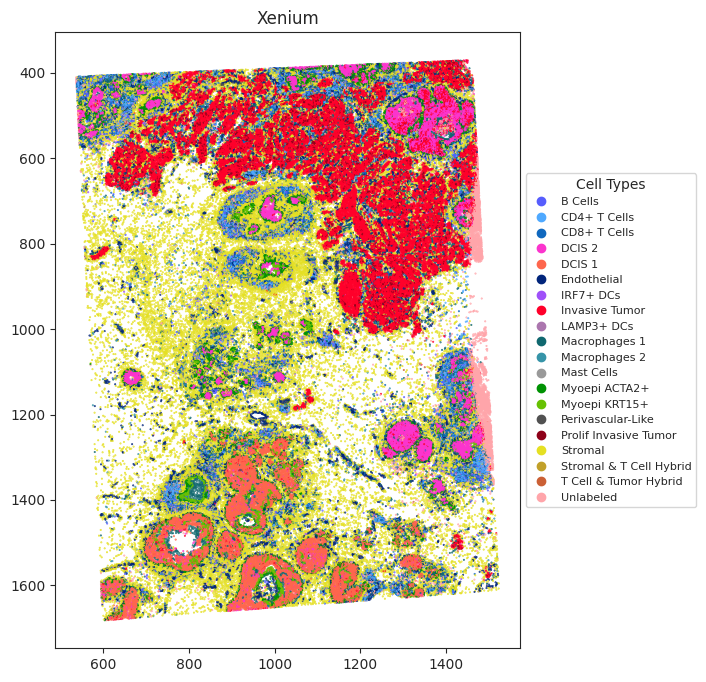

In [23]:
colors = xenium_mat.obs['cell_type'].map(ctype_hex_map_xenium)

import seaborn as sns
sns.set_style("ticks")
fig, ax = plt.subplots(1, 1, figsize=(6,8), dpi=100)
plt.scatter(xenium_mat.obsm['spatial'][:, 0], xenium_mat.obsm['spatial'][:, 1], s=0.2, c=colors)
legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=color, label=cell_type, markersize=6) 
                   for cell_type, color in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_anno.pdf', format='pdf')

## Xenium DCSI 1

resultsROIs/spot_celltype_xenium_ROIs1_4.csv

https://localhost:8888/notebooks/Xenium/janesick_nature_comms_2023_companion-main/companion_notebook_compare.ipynb

[[ 7153.79880575 14977.52671532]
 [11291.78089075 14659.22040109]
 [11444.56792158 16887.3646007 ]
 [ 7293.85358402 16938.29361098]]
(211, 398, 4)


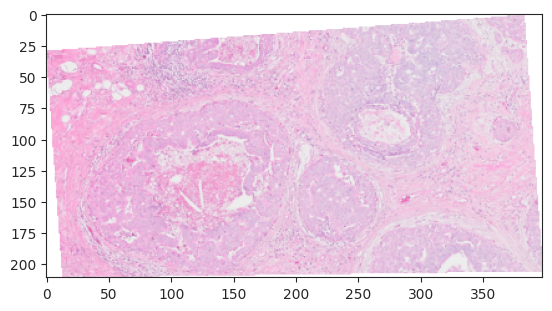

In [24]:
# shape1 = np.array([[7014.901122959969, 7174.112188842245, 11175.97215864968, 11020.869475180687, 11015.124931348502], 
#                   [15107.824609826745, 17217.371232766895, 17227.64011685478, 14872.377145658964, 14872.377145658964]])
shape1 = np.array([[7153.7988057548255, 11291.780890749125, 11444.567921579684, 7293.853584016171], 
                  [14977.526715321099, 14659.22040109077, 16887.364600703084, 16938.293610979938]])

polygon_points = shape1.T
print(polygon_points)

from matplotlib.path import Path
from PIL import Image, ImageDraw

# 计算多边形的边界框（bounding box）
min_x, min_y = np.min(polygon_points* visium_scale_factors["tissue_hires_scalef"], axis=0)
max_x, max_y = np.max(polygon_points* visium_scale_factors["tissue_hires_scalef"], axis=0)

min_x, min_y, max_x, max_y = map(int, [min_x, min_y, max_x, max_y])
cropped_image = visium_high_res_image[min_y:max_y, min_x:max_x].copy()
cropped_image_pil = Image.fromarray(cropped_image)

# 创建一个mask，大小和裁剪后的图像相同
mask = Image.new('L', cropped_image_pil.size, 0)
polygon_points_flat = [(x - min_x, y - min_y) for x, y in polygon_points* visium_scale_factors["tissue_hires_scalef"]]
ImageDraw.Draw(mask).polygon(polygon_points_flat, outline=1, fill=1)

# 使用mask将边界框之外的部分设置为透明
mask = mask.point(lambda p: p * 255)
cropped_image_pil.putalpha(mask)
cropped_image = np.array(cropped_image_pil)
print(cropped_image.shape)

plt.imshow(cropped_image)
plt.show()

In [25]:
polygon_points

array([[ 7153.79880575, 14977.52671532],
       [11291.78089075, 14659.22040109],
       [11444.56792158, 16887.3646007 ],
       [ 7293.85358402, 16938.29361098]])

(14146, 2)


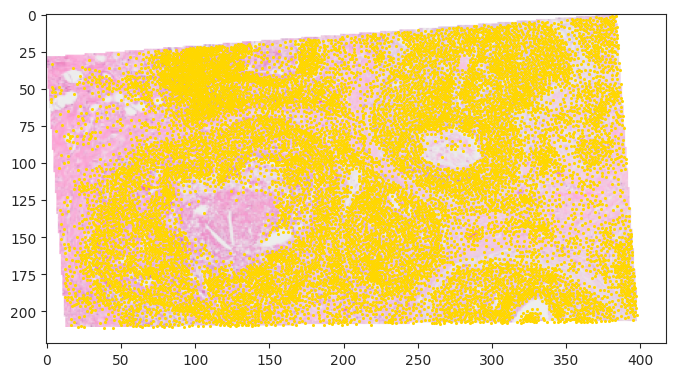

In [26]:
## plot style setup
fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=100)
ax = plt.gca()

ax.imshow(cropped_image)

from matplotlib.path import Path
polygon = Path(polygon_points* visium_scale_factors["tissue_hires_scalef"])
points_within_range_cropped = xenium_cell_centroids_visium_high_res[polygon.contains_points(xenium_cell_centroids_visium_high_res), :] - np.array([min_x, min_y])
print(points_within_range_cropped.shape)

ax.scatter(
    *points_within_range_cropped.T,
    s=5.0,
    linewidth=0,
    edgecolor=None,
    marker="o",
    color="gold"
)

In [27]:
print(points_within_range_cropped.shape)
points_within_range_cropped

(14146, 2)


array([[282.67388916,  61.52319336],
       [282.68383789,  63.24255371],
       [284.04425049,  63.26855469],
       ...,
       [141.0211792 , 183.73352051],
       [132.17492676, 184.53918457],
       [129.02172852, 184.62646484]])

In [28]:
import squidpy as sq
import matplotlib.pyplot as plt
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

image = plt.imread(str(path)+'iSTAR/GSE243280/GSM7782699_tissue_image.tif')
img = sq.im.ImageContainer(image)

In [29]:
visium_spot_centroids=visium_tissue_positions[
        ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    ].values
print(visium_spot_centroids[:,0].max(), visium_spot_centroids[:,1].max())
visium_spot_centroids

15364 16873


array([[ 4131,  4636],
       [13355, 16640],
       [ 8845, 12067],
       ...,
       [10447,  6653],
       [11039, 12368],
       [ 3720, 10518]])

In [30]:
## 计算多边形的边界框（bounding box）
min_x0, min_y0 = np.min(polygon_points, axis=0)
max_x0, max_y0 = np.max(polygon_points, axis=0)
min_x0, min_y0, max_x0, max_y0 = map(int, [min_x0, min_y0, max_x0, max_y0])

## Create a mask array
mask = (
    (visium_spot_centroids[:, 0] > min_x0) & 
    (visium_spot_centroids[:, 1] > min_y0) & 
    (visium_spot_centroids[:, 0] < max_x0) & 
    (visium_spot_centroids[:, 1] < max_y0)
)

## Select the points within the desired range
visium_spot_centroids_range = visium_spot_centroids[mask]
print(visium_spot_centroids_range.shape)
# print(visium_spot_centroids_range)

(329, 2)


In [31]:
## Get cell -> Visium barcode assignments.
xenium_spotbinned_cell_barcodes0 = bin_xenium_data_to_visium_spots(
    visium_spot_centroids=visium_spot_centroids_range,
    # visium_spot_centroids=visium_tissue_positions[
    #     ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    # ].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    xenium_coords=xenium_cell_info[["x_centroid", "y_centroid"]].values,
    xenium_to_visium_transform=xenium_to_visium_full_res_transformation,
)

## Filter cells outside of Visium capture area.
unassigned_cell_mask0 = (
    xenium_spotbinned_cell_barcodes0 != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generate a spot X cell type dataframe.
xenium_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=xenium_spotbinned_cell_barcodes0[unassigned_cell_mask0],
    feature_names=xenium_celltype_df[unassigned_cell_mask0]["Cluster"].values,
)
xenium_spotbinned_celltypes_df = xenium_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
xenium_spotbinned_celltypes_normed_df_DCSI1 = xenium_spotbinned_celltypes_df.div(
    xenium_spotbinned_celltypes_df.sum(1), axis=0
)

In [32]:
xenium_spotbinned_celltypes_normed_df_DCSI1

,Stromal_&_T_Cell_Hybrid,Macrophages_1,Mast_Cells,Myoepi_ACTA2+,Perivascular-Like,LAMP3+_DCs,IRF7+_DCs,DCIS_2,Stromal,Myoepi_KRT15+,DCIS_1,CD8+_T_Cells,T_Cell_&_Tumor_Hybrid,B_Cells,Prolif_Invasive_Tumor,Invasive_Tumor,CD4+_T_Cells,Macrophages_2,Endothelial,Unlabeled
AAGCCATTATCTGCCA-1,0.000000,0.027778,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.527778,0.000000,0.000000,0.027778,0.0,0.166667,0.0,0.0,0.055556,0.027778,0.111111,0.055556
AAGGCCAATTCAATAA-1,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.833333,0.000000,0.000000,0.000000,0.0,0.125000,0.0,0.0,0.000000,0.000000,0.041667,0.000000
ACAATATCATCCGGTA-1,0.000000,0.059701,0.0,0.059701,0.000000,0.0,0.000000,0.014925,0.134328,0.000000,0.686567,0.014925,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.014925,0.014925
AACCAATCTGGTTGGC-1,0.029412,0.029412,0.0,0.000000,0.029412,0.0,0.000000,0.000000,0.500000,0.000000,0.000000,0.029412,0.0,0.088235,0.0,0.0,0.029412,0.058824,0.205882,0.000000
AAGATTAGGCTGTCTA-1,0.000000,0.047619,0.0,0.015873,0.000000,0.0,0.000000,0.031746,0.000000,0.761905,0.142857,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AACGAGCTAATAACTA-1,0.000000,0.000000,0.0,0.000000,0.034483,0.0,0.000000,0.000000,0.862069,0.000000,0.000000,0.034483,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.068966,0.000000
AACGGCACAGAATATT-1,0.000000,0.025641,0.0,0.000000,0.000000,0.0,0.025641,0.000000,0.410256,0.000000,0.000000,0.025641,0.0,0.051282,0.0,0.0,0.000000,0.051282,0.358974,0.051282
AACTGCCGGAGTAACA-1,0.000000,0.060000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.600000,0.000000,0.000000,0.040000,0.0,0.100000,0.0,0.0,0.000000,0.120000,0.080000,0.000000
AACTGCGATGAATAGG-1,0.000000,0.105263,0.0,0.065789,0.000000,0.0,0.000000,0.013158,0.013158,0.092105,0.460526,0.171053,0.0,0.000000,0.0,0.0,0.026316,0.000000,0.013158,0.039474


In [33]:
clust_labels = ['Invasive_Tumor', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Endothelial']

In [34]:
xenium_spotbinned_celltypes_normed_df_DCSI1[clust_labels]

,Invasive_Tumor,Myoepi_ACTA2+,Myoepi_KRT15+,Endothelial
AAGCCATTATCTGCCA-1,0.0,0.000000,0.000000,0.111111
AAGGCCAATTCAATAA-1,0.0,0.000000,0.000000,0.041667
ACAATATCATCCGGTA-1,0.0,0.059701,0.000000,0.014925
AACCAATCTGGTTGGC-1,0.0,0.000000,0.000000,0.205882
AAGATTAGGCTGTCTA-1,0.0,0.015873,0.761905,0.000000
...,...,...,...,...
AACGAGCTAATAACTA-1,0.0,0.000000,0.000000,0.068966
AACGGCACAGAATATT-1,0.0,0.000000,0.000000,0.358974
AACTGCCGGAGTAACA-1,0.0,0.000000,0.000000,0.080000
AACTGCGATGAATAGG-1,0.0,0.065789,0.092105,0.013158


In [35]:
# xenium_spotbinned_celltypes_normed_df_DCSI1.idxmax(axis=1).value_counts()
xenium_spotbinned_celltypes_normed_df_DCSI1[clust_labels].idxmax(axis=1).value_counts()

Endothelial       108
Myoepi_ACTA2+      78
Myoepi_KRT15+      78
Invasive_Tumor     62
Name: count, dtype: int64

In [36]:
ss_DCSI1 = pd.DataFrame(xenium_spotbinned_celltypes_normed_df_DCSI1[clust_labels].idxmax(axis=1).value_counts()/xenium_spotbinned_celltypes_normed_df_DCSI1[clust_labels].idxmax(axis=1).value_counts().sum())
ss_DCSI1.columns = ['Xenuim_spot']

df_res_DCSI1 = ss_DCSI1.T
df_res_DCSI1

,Endothelial,Myoepi_ACTA2+,Myoepi_KRT15+,Invasive_Tumor
Xenuim_spot,0.331288,0.239264,0.239264,0.190184


In [37]:
!pwd
## save Xenium results
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# df_res_DCSI1.to_csv('spot_celltype_xenium_ROIs1.csv')

/mnt/lingyu/nfs_share2/Python/Xenium/janesick_nature_comms_2023_companion-main


In [38]:
import seaborn as sns
import numpy as np
def plot_stackedbar_p(df, labels, colors, title, subtitle, output_file=None):
    fields = labels
    
    sns.set_context('paper',font_scale=1.8) 
    fig, ax = plt.subplots(1, figsize=(18, 4), dpi=100)

    left = len(df) * [0]
    for idx, name in enumerate(fields):
        plt.barh(df.index, df[name], left=left, color=colors[idx])
        left = left + df[name]

    plt.legend(labels, bbox_to_anchor=([.95, -0.14, 0, 0]), ncol=5, frameon=False)

    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    xticks = np.arange(0, 1.1, 0.1)
    xlabels = ['{}%'.format(i) for i in np.arange(0, 101, 10)]
    plt.xticks(xticks, xlabels)

    plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
    ax.xaxis.grid(color='gray', linestyle='dashed')
    
    if output_file is not None:
        plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)  

    plt.show()

In [39]:
# variables
color_dict = ctype_hex_map
plot_columns = np.array(df_res_DCSI1.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns
colors = plot_colors

labels = plot_columns 
colors = plot_colors#['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

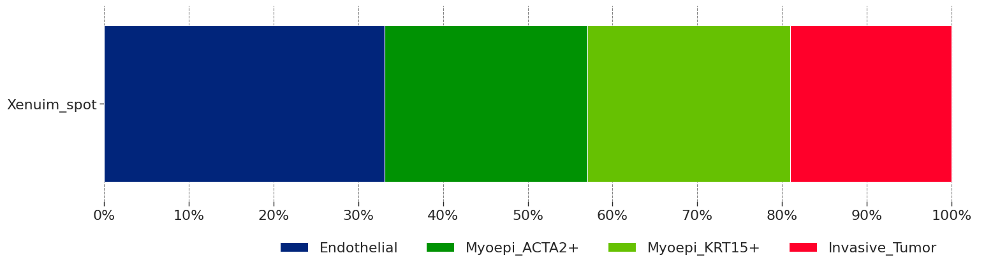

In [40]:
plot_stackedbar_p(df_res_DCSI1, labels, colors, title, subtitle)

In [41]:
xenium_mat_ROI1 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
print(xenium_mat_ROI1)
colors = xenium_mat_ROI1.obs['cell_type'].map(ctype_hex_map_xenium)

## colnum
# fig, ax = plt.subplots(1, 1, figsize=(6, 8), dpi=100)
# plt.scatter(xenium_mat_ROI1.obsm['spatial'][:, 1], -xenium_mat_ROI1.obsm['spatial'][:, 0], s=0.2, c=colors)
# plt.title('Xenium')
# plt.show()

View of AnnData object with n_obs × n_vars = 14146 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


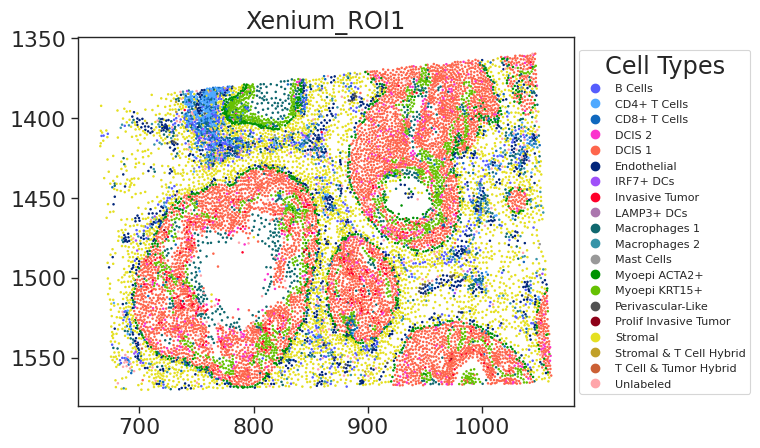

In [42]:
## row
fig, ax = plt.subplots(1, 1, dpi=100)
plt.scatter(xenium_mat_ROI1.obsm['spatial'][:, 0], xenium_mat_ROI1.obsm['spatial'][:, 1], s=1.0, c=colors)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=color, label=cell_type, markersize=6) 
                   for cell_type, color in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium_ROI1')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI1.pdf', format='pdf')

View of AnnData object with n_obs × n_vars = 2828 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


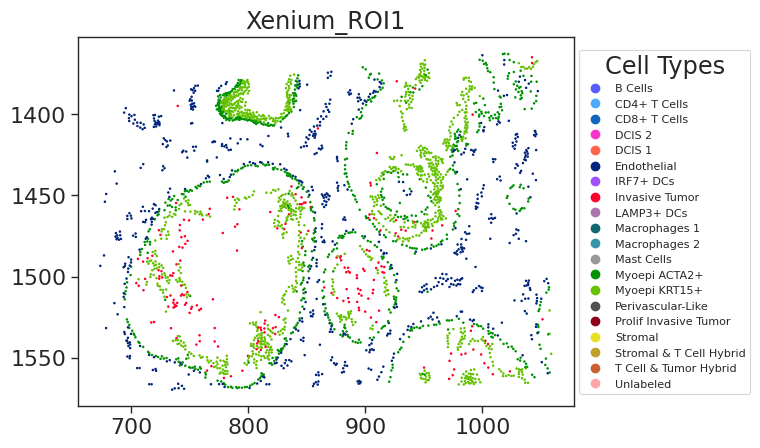

In [43]:
clust_labels = ['#ff002a', '#009203', '#66c102', '#01257b']
# 从colors中选择包含clust_labels的所有行
selected_rows = colors.isin(clust_labels)
# 从xenium_mat_ROI1中选择相应的样本
xenium_mat_ROI1_sele = xenium_mat_ROI1[selected_rows.values, :]
colors_sele = xenium_mat_ROI1_sele.obs['cell_type'].map(ctype_hex_map_xenium)
print(xenium_mat_ROI1_sele)

## row
fig, ax = plt.subplots(1, 1, dpi=100)
plt.scatter(xenium_mat_ROI1_sele.obsm['spatial'][:, 0], xenium_mat_ROI1_sele.obsm['spatial'][:, 1], s=1.0, c=colors_sele)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=colors_sele, label=cell_type, markersize=6) 
                   for cell_type, colors_sele in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium_ROI1')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI1_sele.pdf', format='pdf')

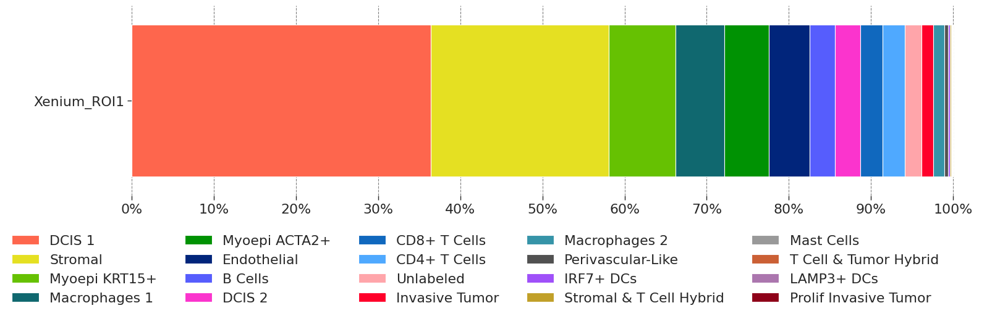

In [44]:
cell_DCSI1 = pd.DataFrame(xenium_mat_ROI1.obs['cell_type'].value_counts()/xenium_mat_ROI1.obs['cell_type'].value_counts().sum())
cell_DCSI1.columns = ['Xenium_ROI1']

df_res_DCSI1 = cell_DCSI1.T
# print(df_res_DCSI1)

# variables
color_dict = ctype_hex_map_xenium
plot_columns = np.array(df_res_DCSI1.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns
colors = plot_colors

title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

plot_stackedbar_p(df_res_DCSI1, labels, colors, title, subtitle)

In [45]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# plot_stackedbar_p(df_res_DCSI1, labels, colors, title, subtitle, 'Xenium_ROI1_prop.pdf')

In [46]:
df_res_DCSI1
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# df_res_DCSI1.to_csv('celltype_xeniumgt_ROI1.csv')

cell_type,DCIS 1,Stromal,Myoepi KRT15+,Macrophages 1,Myoepi ACTA2+,Endothelial,B Cells,DCIS 2,CD8+ T Cells,CD4+ T Cells,Unlabeled,Invasive Tumor,Macrophages 2,Perivascular-Like,IRF7+ DCs,Stromal & T Cell Hybrid,Mast Cells,T Cell & Tumor Hybrid,LAMP3+ DCs,Prolif Invasive Tumor
Xenium_ROI1,0.363919,0.216669,0.081719,0.059381,0.054291,0.049696,0.030892,0.030256,0.027216,0.026863,0.020571,0.014209,0.013714,0.004383,0.002474,0.001272,0.000919,0.000778,0.000566,0.000212


## Xenium DCSI 2

resultsROIs/spot_celltype_xenium_ROIs2_4.csv

In [47]:
shape2 = np.array([[13107.567467473213, 15334.344811164356, 15356.446819538462, 13201.40836466815, 13205.890527448819], 
                  [4527.231645961396, 4565.910160616081, 6654.549951969062, 6730.587870812411, 6735.07003359308]])

polygon2 = shape2.T
print(polygon2)

# 计算多边形的边界框（bounding box）
min_x, min_y = np.min(polygon2* visium_scale_factors["tissue_hires_scalef"], axis=0)
max_x, max_y = np.max(polygon2* visium_scale_factors["tissue_hires_scalef"], axis=0)

min_x, min_y, max_x, max_y = map(int, [min_x, min_y, max_x, max_y])
cropped_image = visium_high_res_image[min_y:max_y, min_x:max_x].copy()

# Create a mask array
mask = (
    (xenium_cell_centroids_visium_high_res[:, 0] > min_x) & 
    (xenium_cell_centroids_visium_high_res[:, 1] > min_y) & 
    (xenium_cell_centroids_visium_high_res[:, 0] < max_x) & 
    (xenium_cell_centroids_visium_high_res[:, 1] < max_y)
)
print(mask)

[[13107.56746747  4527.23164596]
 [15334.34481116  4565.91016062]
 [15356.44681954  6654.54995197]
 [13201.40836467  6730.58787081]
 [13205.89052745  6735.07003359]]
[ True  True  True ... False False False]


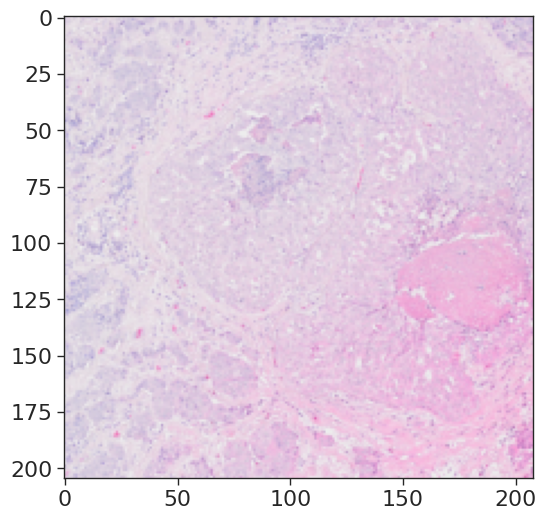

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=100)
ax = plt.gca()
ax.imshow(cropped_image)

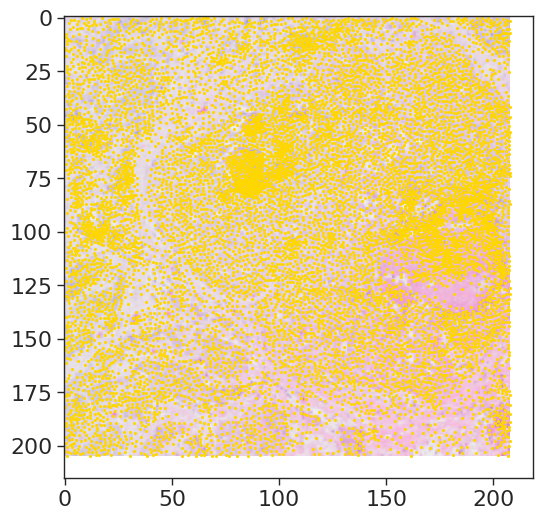

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=100)
ax = plt.gca()

ax.imshow(cropped_image)
points_within_range = xenium_cell_centroids_visium_high_res[mask]
points_within_range_cropped = points_within_range - np.array([min_x, min_y])

ax.scatter(
    *points_within_range_cropped.T,
    s=5.0,
    linewidth=0,
    edgecolor=None,
    marker="o",
    color="gold"
)

In [50]:
## 计算多边形的边界框（bounding box）
min_x0, min_y0 = np.min(polygon2, axis=0)
max_x0, max_y0 = np.max(polygon2, axis=0)
min_x0, min_y0, max_x0, max_y0 = map(int, [min_x0, min_y0, max_x0, max_y0])

## Create a mask array
mask = (
    (visium_spot_centroids[:, 0] > min_x0) & 
    (visium_spot_centroids[:, 1] > min_y0) & 
    (visium_spot_centroids[:, 0] < max_x0) & 
    (visium_spot_centroids[:, 1] < max_y0)
)

## Select the points within the desired range
visium_spot_centroids_range = visium_spot_centroids[mask]
print(visium_spot_centroids_range.shape)
# print(visium_spot_centroids_range)

(168, 2)


In [51]:
## Get cell -> Visium barcode assignments.
xenium_spotbinned_cell_barcodes0 = bin_xenium_data_to_visium_spots(
    visium_spot_centroids=visium_spot_centroids_range,
    # visium_spot_centroids=visium_tissue_positions[
    #     ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    # ].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    xenium_coords=xenium_cell_info[["x_centroid", "y_centroid"]].values,
    xenium_to_visium_transform=xenium_to_visium_full_res_transformation,
)

## Filter cells outside of Visium capture area.
unassigned_cell_mask0 = (
    xenium_spotbinned_cell_barcodes0 != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generate a spot X cell type dataframe.
xenium_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=xenium_spotbinned_cell_barcodes0[unassigned_cell_mask0],
    feature_names=xenium_celltype_df[unassigned_cell_mask0]["Cluster"].values,
)
xenium_spotbinned_celltypes_df = xenium_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
xenium_spotbinned_celltypes_normed_df_DCSI2 = xenium_spotbinned_celltypes_df.div(
    xenium_spotbinned_celltypes_df.sum(1), axis=0
)

In [52]:
xenium_spotbinned_celltypes_normed_df_DCSI2

,Stromal_&_T_Cell_Hybrid,Macrophages_1,Mast_Cells,Myoepi_ACTA2+,Perivascular-Like,LAMP3+_DCs,IRF7+_DCs,DCIS_2,Stromal,Myoepi_KRT15+,DCIS_1,CD8+_T_Cells,T_Cell_&_Tumor_Hybrid,B_Cells,Prolif_Invasive_Tumor,Invasive_Tumor,CD4+_T_Cells,Macrophages_2,Endothelial,Unlabeled
AAGGCGCCGACAATCT-1,0.000000,0.060000,0.00000,0.000000,0.020000,0.0,0.0,0.000000,0.340000,0.000000,0.000000,0.000000,0.000000,0.020000,0.040000,0.380000,0.040000,0.020000,0.060000,0.020000
AAGGCCGATTCTGAGC-1,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.804124,0.000000,0.010309,0.010309,0.000000,0.000000,0.000000,0.010309,0.144330,0.000000,0.000000,0.000000,0.020619
AAGCCATTATCTGCCA-1,0.000000,0.000000,0.00000,0.105263,0.000000,0.0,0.0,0.342105,0.039474,0.000000,0.000000,0.000000,0.000000,0.000000,0.026316,0.473684,0.000000,0.000000,0.000000,0.013158
AAGGCCAATTCAATAA-1,0.021739,0.097826,0.01087,0.000000,0.000000,0.0,0.0,0.000000,0.108696,0.000000,0.000000,0.065217,0.032609,0.097826,0.000000,0.141304,0.206522,0.043478,0.130435,0.043478
AACTAGCATCACGTAC-1,0.000000,0.000000,0.00000,0.115942,0.000000,0.0,0.0,0.550725,0.101449,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.231884,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AACTGCGATCGACTAA-1,0.020202,0.070707,0.00000,0.121212,0.010101,0.0,0.0,0.131313,0.151515,0.000000,0.000000,0.131313,0.000000,0.050505,0.010101,0.040404,0.101010,0.000000,0.111111,0.050505
AAGATAGGCTTGCTTA-1,0.000000,0.227273,0.00000,0.000000,0.000000,0.0,0.0,0.500000,0.000000,0.022727,0.022727,0.000000,0.000000,0.000000,0.000000,0.181818,0.000000,0.000000,0.000000,0.045455
AACTCAACTTGACAGC-1,0.000000,0.012579,0.00000,0.031447,0.000000,0.0,0.0,0.603774,0.012579,0.000000,0.000000,0.000000,0.000000,0.000000,0.012579,0.301887,0.000000,0.000000,0.012579,0.012579
AACCAAGGTATCAGGC-1,0.000000,0.161290,0.00000,0.000000,0.010753,0.0,0.0,0.000000,0.107527,0.000000,0.000000,0.172043,0.000000,0.161290,0.000000,0.000000,0.150538,0.000000,0.182796,0.053763


In [53]:
clust_labels = ['Invasive_Tumor', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Endothelial']
xenium_spotbinned_celltypes_normed_df_DCSI2[clust_labels]

,Invasive_Tumor,Myoepi_ACTA2+,Myoepi_KRT15+,Endothelial
AAGGCGCCGACAATCT-1,0.380000,0.000000,0.000000,0.060000
AAGGCCGATTCTGAGC-1,0.144330,0.000000,0.010309,0.000000
AAGCCATTATCTGCCA-1,0.473684,0.105263,0.000000,0.000000
AAGGCCAATTCAATAA-1,0.141304,0.000000,0.000000,0.130435
AACTAGCATCACGTAC-1,0.231884,0.115942,0.000000,0.000000
...,...,...,...,...
AACTGCGATCGACTAA-1,0.040404,0.121212,0.000000,0.111111
AAGATAGGCTTGCTTA-1,0.181818,0.000000,0.022727,0.000000
AACTCAACTTGACAGC-1,0.301887,0.031447,0.000000,0.012579
AACCAAGGTATCAGGC-1,0.000000,0.000000,0.000000,0.182796


In [54]:
ss_DCSI2 = pd.DataFrame(xenium_spotbinned_celltypes_normed_df_DCSI2[clust_labels].idxmax(axis=1).value_counts()/xenium_spotbinned_celltypes_normed_df_DCSI2[clust_labels].idxmax(axis=1).value_counts().sum())
ss_DCSI2.columns = ['Xenuim_spot']

df_res_DCSI2 = ss_DCSI2.T
df_res_DCSI2

,Invasive_Tumor,Myoepi_ACTA2+,Endothelial
Xenuim_spot,0.744048,0.136905,0.119048


In [55]:
!pwd
## save Xenium results
# df_res_DCSI2.to_csv('resultsROIs/spot_celltype_xenium_ROIs2.csv')

/mnt/lingyu/nfs_share2/Python/Xenium/janesick_nature_comms_2023_companion-main


In [56]:
color_dict = ctype_hex_map
plot_columns = np.array(df_res_DCSI2.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns
colors = plot_colors

labels = plot_columns 
colors = plot_colors#['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

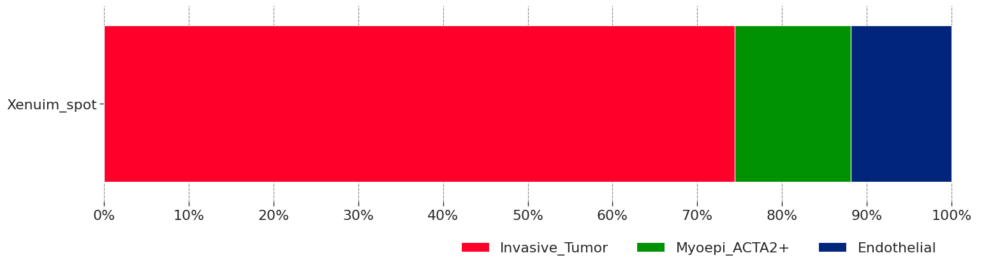

In [57]:
plot_stackedbar_p(df_res_DCSI2, labels, colors, title, subtitle)

View of AnnData object with n_obs × n_vars = 10487 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


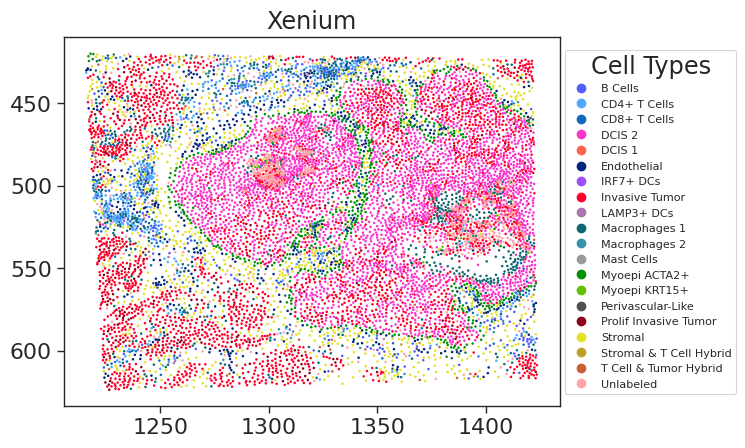

In [58]:
from matplotlib.path import Path
polygon = Path(polygon2* visium_scale_factors["tissue_hires_scalef"])

xenium_mat_ROI2 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
print(xenium_mat_ROI2)
colors = xenium_mat_ROI2.obs['cell_type'].map(ctype_hex_map_xenium)

## row
fig, ax = plt.subplots(1, 1, dpi=100)
plt.scatter(xenium_mat_ROI2.obsm['spatial'][:, 0], xenium_mat_ROI2.obsm['spatial'][:, 1], s=1.0, c=colors)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=color, label=cell_type, markersize=6) 
                   for cell_type, color in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI2.pdf', format='pdf')

View of AnnData object with n_obs × n_vars = 3641 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


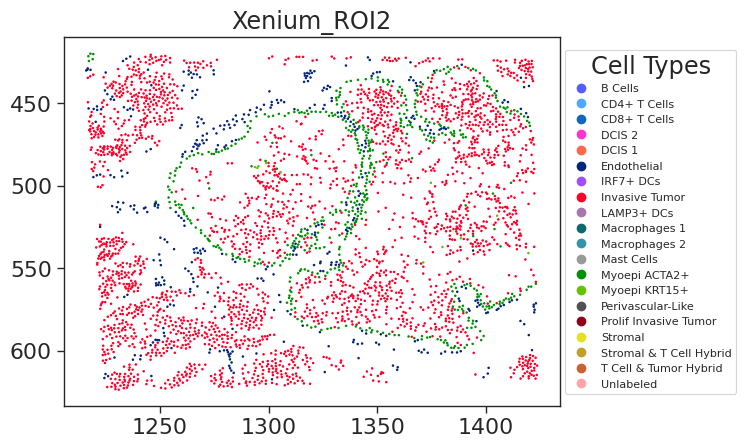

In [59]:
clust_labels = ['#ff002a', '#009203', '#66c102', '#01257b']
# 从colors中选择包含clust_labels的所有行
selected_rows = colors.isin(clust_labels)
# 从xenium_mat_ROI2中选择相应的样本
xenium_mat_ROI2_sele = xenium_mat_ROI2[selected_rows.values, :]
colors_sele = xenium_mat_ROI2_sele.obs['cell_type'].map(ctype_hex_map_xenium)
print(xenium_mat_ROI2_sele)

## row
fig, ax = plt.subplots(1, 1, dpi=100)
plt.scatter(xenium_mat_ROI2_sele.obsm['spatial'][:, 0], xenium_mat_ROI2_sele.obsm['spatial'][:, 1], s=1.0, c=colors_sele)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=colors_sele, label=cell_type, markersize=6) 
                   for cell_type, colors_sele in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium_ROI2')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI2_sele.pdf', format='pdf')

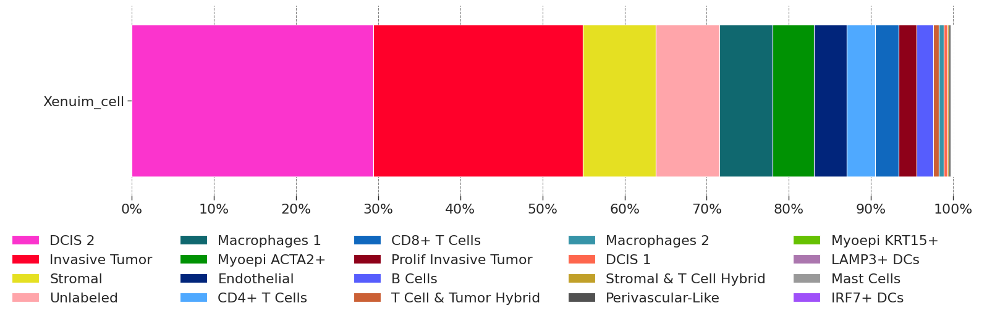

In [60]:
cell_DCSI2 = pd.DataFrame(xenium_mat_ROI2.obs['cell_type'].value_counts()/xenium_mat_ROI2.obs['cell_type'].value_counts().sum())
cell_DCSI2.columns = ['Xenuim_cell']

df_res_DCSI2 = cell_DCSI2.T
# print(df_res_DCSI2)

# variables
color_dict = ctype_hex_map_xenium
plot_columns = np.array(df_res_DCSI2.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns 
colors = plot_colors
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

plot_stackedbar_p(df_res_DCSI2, labels, colors, title, subtitle)

In [61]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# plot_stackedbar_p(df_res_DCSI2, labels, colors, title, subtitle, 'Xenium_ROI2_prop.pdf')

In [62]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# df_res_DCSI2.to_csv('celltype_xeniumgt_ROI2.csv')

## Xenium Invasive

resultsROIs/spot_celltype_xenium_ROIs3_4.csv

[[ 9345.73338021  4923.18604238]
 [12404.18896321  4773.32853051]
 [12533.61135981  7068.87314403]
 [ 9468.34407174  7218.73065589]
 [ 9468.34407174  7218.73065589]]
[False False False ... False False False]


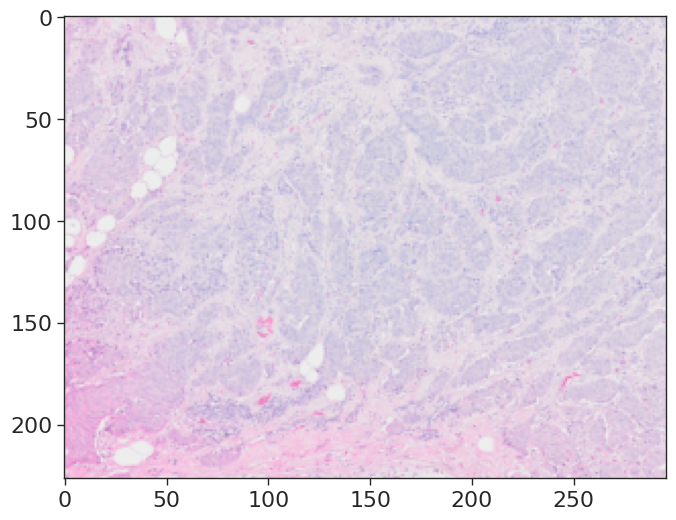

In [63]:
shape3 = np.array([[9345.733380213871, 12404.18896320663, 12533.611359814342, 9468.344071736967, 9468.344071736967], 
                  [4923.186042375999, 4773.328530514438, 7068.873144030162, 7218.730655891723, 7218.730655891723]])

polygon3 = shape3.T
print(polygon3)

# 计算多边形的边界框（bounding box）
min_x, min_y = np.min(polygon3* visium_scale_factors["tissue_hires_scalef"], axis=0)
max_x, max_y = np.max(polygon3* visium_scale_factors["tissue_hires_scalef"], axis=0)

min_x, min_y, max_x, max_y = map(int, [min_x, min_y, max_x, max_y])
cropped_image = visium_high_res_image[min_y:max_y, min_x:max_x].copy()

# Create a mask array
mask = (
    (xenium_cell_centroids_visium_high_res[:, 0] > min_x) & 
    (xenium_cell_centroids_visium_high_res[:, 1] > min_y) & 
    (xenium_cell_centroids_visium_high_res[:, 0] < max_x) & 
    (xenium_cell_centroids_visium_high_res[:, 1] < max_y)
)
print(mask)

fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=100)
ax = plt.gca()
ax.imshow(cropped_image)

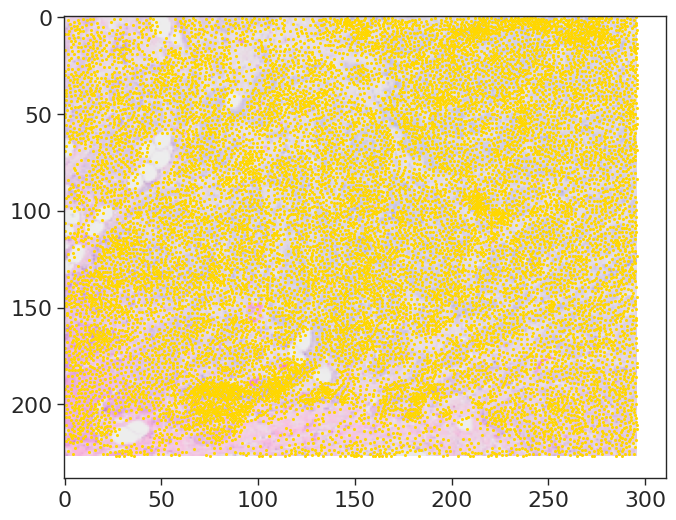

In [64]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=100)
ax = plt.gca()

ax.imshow(cropped_image)
points_within_range = xenium_cell_centroids_visium_high_res[mask]
points_within_range_cropped = points_within_range - np.array([min_x, min_y])

ax.scatter(
    *points_within_range_cropped.T,
    s=5.0,
    linewidth=0,
    edgecolor=None,
    marker="o",
    color="gold"
)

In [65]:
## 计算多边形的边界框（bounding box）
min_x0, min_y0 = np.min(polygon3, axis=0)
max_x0, max_y0 = np.max(polygon3, axis=0)
min_x0, min_y0, max_x0, max_y0 = map(int, [min_x0, min_y0, max_x0, max_y0])

## Create a mask array
mask = (
    (visium_spot_centroids[:, 0] > min_x0) & 
    (visium_spot_centroids[:, 1] > min_y0) & 
    (visium_spot_centroids[:, 0] < max_x0) & 
    (visium_spot_centroids[:, 1] < max_y0)
)

## Select the points within the desired range
visium_spot_centroids_range = visium_spot_centroids[mask]
print(visium_spot_centroids_range.shape)
# print(visium_spot_centroids_range)

(259, 2)


In [66]:
## Get cell -> Visium barcode assignments.
xenium_spotbinned_cell_barcodes0 = bin_xenium_data_to_visium_spots(
    visium_spot_centroids=visium_spot_centroids_range,
    # visium_spot_centroids=visium_tissue_positions[
    #     ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    # ].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    xenium_coords=xenium_cell_info[["x_centroid", "y_centroid"]].values,
    xenium_to_visium_transform=xenium_to_visium_full_res_transformation,
)

## Filter cells outside of Visium capture area.
unassigned_cell_mask0 = (
    xenium_spotbinned_cell_barcodes0 != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generate a spot X cell type dataframe.
xenium_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=xenium_spotbinned_cell_barcodes0[unassigned_cell_mask0],
    feature_names=xenium_celltype_df[unassigned_cell_mask0]["Cluster"].values,
)
xenium_spotbinned_celltypes_df = xenium_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
xenium_spotbinned_celltypes_normed_df_Invasive = xenium_spotbinned_celltypes_df.div(
    xenium_spotbinned_celltypes_df.sum(1), axis=0
)

In [67]:
xenium_spotbinned_celltypes_normed_df_Invasive

,B_Cells,Prolif_Invasive_Tumor,Stromal_&_T_Cell_Hybrid,Invasive_Tumor,Macrophages_1,CD4+_T_Cells,Mast_Cells,Myoepi_ACTA2+,Perivascular-Like,Macrophages_2,CD8+_T_Cells,Endothelial,LAMP3+_DCs,T_Cell_&_Tumor_Hybrid,IRF7+_DCs,DCIS_2,Stromal,Unlabeled
AAGGCGCCGACAATCT-1,0.000000,0.000000,0.038462,0.000000,0.153846,0.153846,0.0,0.0,0.000000,0.038462,0.230769,0.000000,0.0,0.000000,0.000000,0.0,0.307692,0.076923
AATAACATGTGCTATG-1,0.000000,0.042553,0.000000,0.404255,0.127660,0.085106,0.0,0.0,0.000000,0.000000,0.106383,0.063830,0.0,0.021277,0.000000,0.0,0.063830,0.085106
AAGGCCGATTCTGAGC-1,0.000000,0.236364,0.000000,0.527273,0.054545,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.036364,0.0,0.000000,0.000000,0.0,0.109091,0.036364
AAGCCATTATCTGCCA-1,0.027027,0.189189,0.000000,0.527027,0.013514,0.000000,0.0,0.0,0.013514,0.000000,0.013514,0.108108,0.0,0.013514,0.000000,0.0,0.081081,0.013514
AACTTGGTTAATACTA-1,0.018519,0.037037,0.018519,0.296296,0.111111,0.092593,0.0,0.0,0.018519,0.000000,0.111111,0.018519,0.0,0.074074,0.000000,0.0,0.111111,0.092593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AACTGCGATCGACTAA-1,0.000000,0.100000,0.000000,0.833333,0.016667,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.016667,0.0,0.000000,0.000000,0.0,0.033333,0.000000
AATGGCATAGTATCAT-1,0.049505,0.029703,0.009901,0.158416,0.198020,0.227723,0.0,0.0,0.009901,0.000000,0.158416,0.029703,0.0,0.029703,0.000000,0.0,0.069307,0.029703
AACTCAACTTGACAGC-1,0.054545,0.036364,0.000000,0.509091,0.036364,0.000000,0.0,0.0,0.000000,0.000000,0.018182,0.000000,0.0,0.000000,0.018182,0.0,0.309091,0.018182
AACCAAGGTATCAGGC-1,0.018519,0.101852,0.009259,0.657407,0.092593,0.018519,0.0,0.0,0.000000,0.000000,0.000000,0.009259,0.0,0.018519,0.000000,0.0,0.046296,0.027778


In [68]:
# ['Invasive_Tumor', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Endothelial']
clust_labels = ['Invasive_Tumor', 'Myoepi_ACTA2+', 'Endothelial']
xenium_spotbinned_celltypes_normed_df_Invasive[clust_labels]

,Invasive_Tumor,Myoepi_ACTA2+,Endothelial
AAGGCGCCGACAATCT-1,0.000000,0.0,0.000000
AATAACATGTGCTATG-1,0.404255,0.0,0.063830
AAGGCCGATTCTGAGC-1,0.527273,0.0,0.036364
AAGCCATTATCTGCCA-1,0.527027,0.0,0.108108
AACTTGGTTAATACTA-1,0.296296,0.0,0.018519
...,...,...,...
AACTGCGATCGACTAA-1,0.833333,0.0,0.016667
AATGGCATAGTATCAT-1,0.158416,0.0,0.029703
AACTCAACTTGACAGC-1,0.509091,0.0,0.000000
AACCAAGGTATCAGGC-1,0.657407,0.0,0.009259


In [69]:
ss_Invasive = pd.DataFrame(xenium_spotbinned_celltypes_normed_df_Invasive[clust_labels].idxmax(axis=1).value_counts()/xenium_spotbinned_celltypes_normed_df_Invasive[clust_labels].idxmax(axis=1).value_counts().sum())
ss_Invasive.columns = ['Xenuim_spot']

df_res_Invasive = ss_Invasive.T
df_res_Invasive

,Invasive_Tumor,Endothelial
Xenuim_spot,0.942085,0.057915


In [70]:
!pwd
## save Xenium results
# df_res_Invasive.to_csv('resultsROIs/spot_celltype_xenium_ROIs3.csv')

/mnt/lingyu/nfs_share2/Python/Xenium/janesick_nature_comms_2023_companion-main


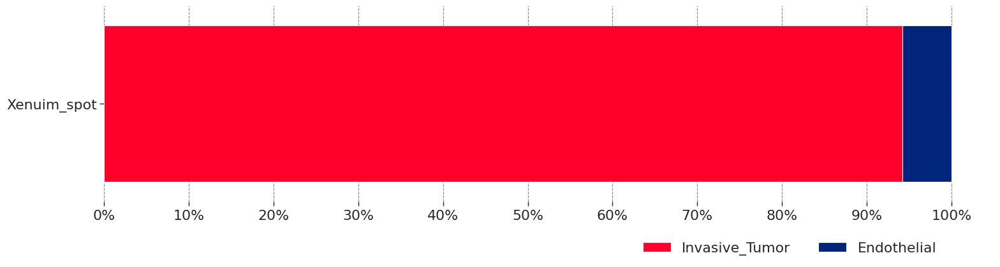

In [71]:
color_dict = ctype_hex_map
plot_columns = np.array(df_res_Invasive.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns
colors = plot_colors
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

plot_stackedbar_p(df_res_Invasive, labels, colors, title, subtitle)

View of AnnData object with n_obs × n_vars = 13773 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


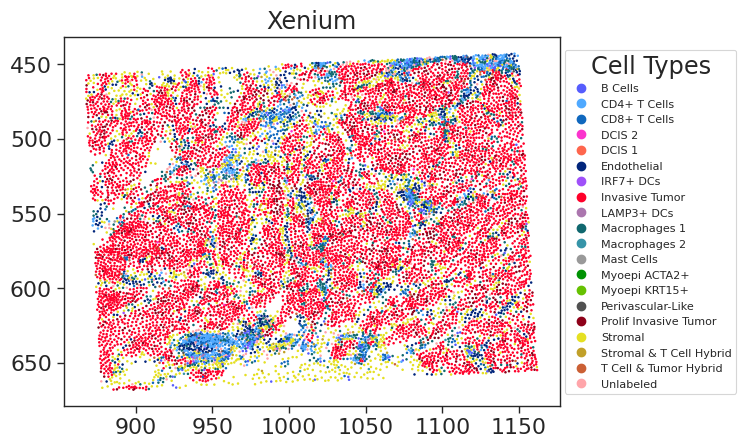

In [72]:
from matplotlib.path import Path
polygon = Path(polygon3* visium_scale_factors["tissue_hires_scalef"])

xenium_mat_ROI3 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
print(xenium_mat_ROI3)
colors = xenium_mat_ROI3.obs['cell_type'].map(ctype_hex_map_xenium)

## row
fig, ax = plt.subplots(1, 1, dpi=100)
plt.scatter(xenium_mat_ROI3.obsm['spatial'][:, 0], xenium_mat_ROI3.obsm['spatial'][:, 1], s=1.0, c=colors)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=color, label=cell_type, markersize=6) 
                   for cell_type, color in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI3.pdf', format='pdf')

View of AnnData object with n_obs × n_vars = 8142 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


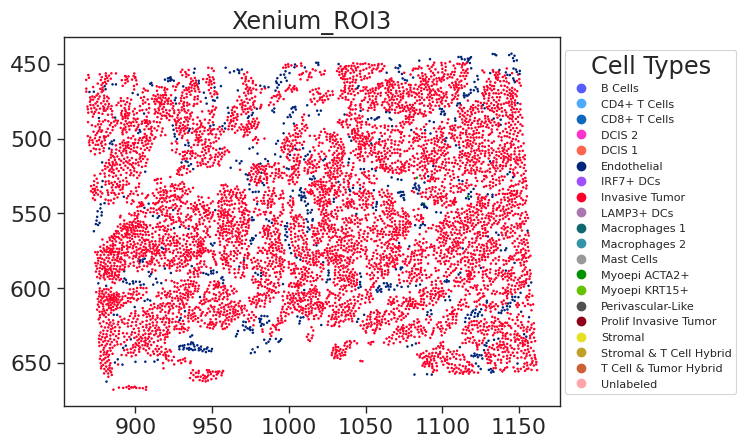

In [73]:
clust_labels = ['#ff002a', '#009203', '#66c102', '#01257b']
# 从colors中选择包含clust_labels的所有行
selected_rows = colors.isin(clust_labels)
# 从xenium_mat_ROI3中选择相应的样本
xenium_mat_ROI3_sele = xenium_mat_ROI3[selected_rows.values, :]
colors_sele = xenium_mat_ROI3_sele.obs['cell_type'].map(ctype_hex_map_xenium)
print(xenium_mat_ROI3_sele)

## row
fig, ax = plt.subplots(1, 1, dpi=100)
plt.scatter(xenium_mat_ROI3_sele.obsm['spatial'][:, 0], xenium_mat_ROI3_sele.obsm['spatial'][:, 1], s=1.0, c=colors_sele)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=colors_sele, label=cell_type, markersize=6) 
                   for cell_type, colors_sele in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium_ROI3')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI3_sele.pdf', format='pdf')

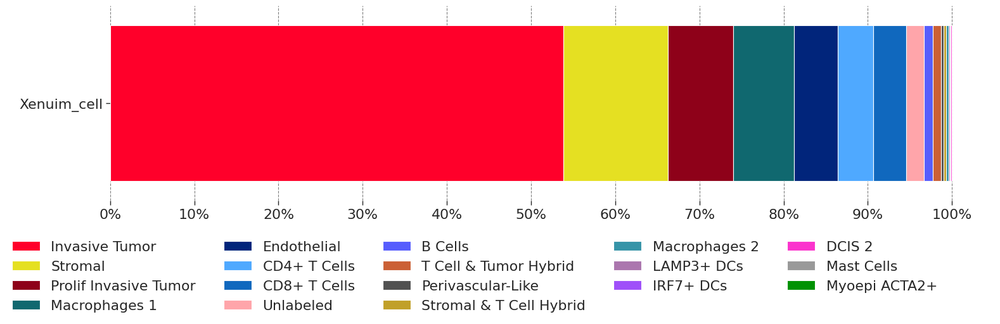

In [74]:
cell_DCSI3 = pd.DataFrame(xenium_mat_ROI3.obs['cell_type'].value_counts()/xenium_mat_ROI3.obs['cell_type'].value_counts().sum())
cell_DCSI3.columns = ['Xenuim_cell']

df_res_DCSI3 = cell_DCSI3.T
# print(df_res_DCSI3)

# variables
color_dict = ctype_hex_map_xenium
plot_columns = np.array(df_res_DCSI3.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns 
colors = plot_colors
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

plot_stackedbar_p(df_res_DCSI3, labels, colors, title, subtitle)

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# plot_stackedbar_p(df_res_DCSI3, labels, colors, title, subtitle, 'Xenium_ROI3_prop.pdf')

In [75]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# df_res_DCSI3.to_csv('celltype_xeniumgt_ROI3.csv')

## Xenium ROI4

shape4 = np.array([[5939.0512888550375, 8694.69027461145, 8694.69027461145, 5939.05128885503759], 
                  [10606.69653598249, 10606.69653598249, 13362.335521738056, 13362.335521738056]])

In [76]:
shape4 = np.array([[5939.0512888550375, 8694.69027461145, 8694.69027461145, 5939.05128885503759], 
                  [10606.69653598249, 10606.69653598249, 13362.335521738056, 13362.335521738056]])

polygon4 = shape4.T
print(polygon4)

# 计算多边形的边界框（bounding box）
min_x, min_y = np.min(polygon4* visium_scale_factors["tissue_hires_scalef"], axis=0)
max_x, max_y = np.max(polygon4* visium_scale_factors["tissue_hires_scalef"], axis=0)

min_x, min_y, max_x, max_y = map(int, [min_x, min_y, max_x, max_y])
cropped_image = visium_high_res_image[min_y:max_y, min_x:max_x].copy()

# Create a mask array
mask = (
    (xenium_cell_centroids_visium_high_res[:, 0] > min_x) & 
    (xenium_cell_centroids_visium_high_res[:, 1] > min_y) & 
    (xenium_cell_centroids_visium_high_res[:, 0] < max_x) & 
    (xenium_cell_centroids_visium_high_res[:, 1] < max_y)
)
print(mask)

[[ 5939.05128886 10606.69653598]
 [ 8694.69027461 10606.69653598]
 [ 8694.69027461 13362.33552174]
 [ 5939.05128886 13362.33552174]]
[False False False ... False False False]


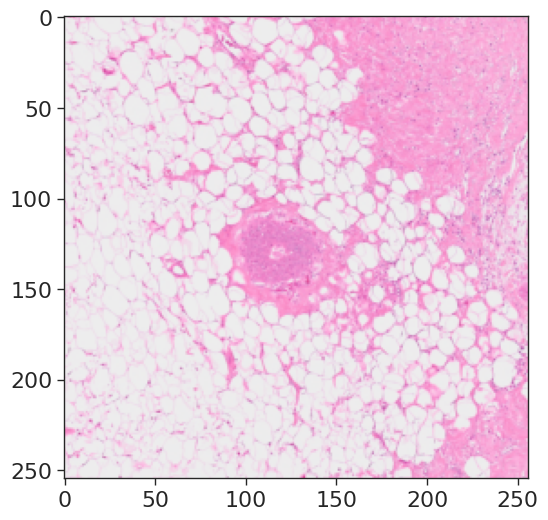

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=100)
ax = plt.gca()
ax.imshow(cropped_image)

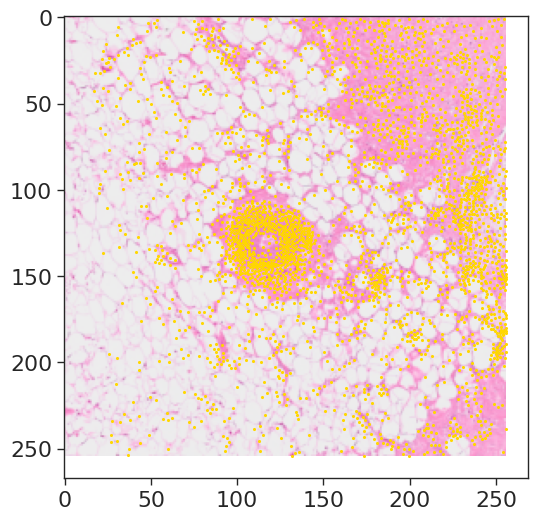

In [78]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=100)
ax = plt.gca()

ax.imshow(cropped_image)
points_within_range = xenium_cell_centroids_visium_high_res[mask]
points_within_range_cropped = points_within_range - np.array([min_x, min_y])

ax.scatter(
    *points_within_range_cropped.T,
    s=5.0,
    linewidth=0,
    edgecolor=None,
    marker="o",
    color="gold"
)

In [79]:
## 计算多边形的边界框（bounding box）
min_x0, min_y0 = np.min(polygon4, axis=0)
max_x0, max_y0 = np.max(polygon4, axis=0)
min_x0, min_y0, max_x0, max_y0 = map(int, [min_x0, min_y0, max_x0, max_y0])

## Create a mask array
mask = (
    (visium_spot_centroids[:, 0] > min_x0) & 
    (visium_spot_centroids[:, 1] > min_y0) & 
    (visium_spot_centroids[:, 0] < max_x0) & 
    (visium_spot_centroids[:, 1] < max_y0)
)

## Select the points within the desired range
visium_spot_centroids_range = visium_spot_centroids[mask]
print(visium_spot_centroids_range.shape)
# print(visium_spot_centroids_range)

(270, 2)


In [80]:
## Get cell -> Visium barcode assignments.
xenium_spotbinned_cell_barcodes0 = bin_xenium_data_to_visium_spots(
    visium_spot_centroids=visium_spot_centroids_range,javascript:void(0);
    # visium_spot_centroids=visium_tissue_positions[
    #     ["pxl_col_in_fullres", "pxl_row_in_fullres"]
    # ].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    xenium_coords=xenium_cell_info[["x_centroid", "y_centroid"]].values,
    xenium_to_visium_transform=xenium_to_visium_full_res_transformation,
)

## Filter cells outside of Visium capture area.
unassigned_cell_mask0 = (
    xenium_spotbinned_cell_barcodes0 != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generate a spot X cell type dataframe.
xenium_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=xenium_spotbinned_cell_barcodes0[unassigned_cell_mask0],
    feature_names=xenium_celltype_df[unassigned_cell_mask0]["Cluster"].values,
)
xenium_spotbinned_celltypes_df = xenium_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
xenium_spotbinned_celltypes_normed_df_ROI4 = xenium_spotbinned_celltypes_df.div(
    xenium_spotbinned_celltypes_df.sum(1), axis=0
)

In [81]:
xenium_spotbinned_celltypes_normed_df_ROI4

,B_Cells,Stromal_&_T_Cell_Hybrid,Myoepi_KRT15+,Macrophages_1,Invasive_Tumor,DCIS_1,CD4+_T_Cells,Mast_Cells,Myoepi_ACTA2+,Perivascular-Like,Macrophages_2,CD8+_T_Cells,Endothelial,LAMP3+_DCs,IRF7+_DCs,DCIS_2,Stromal,Unlabeled
AAGGCGCCGACAATCT-1,0.000000,0.0,0.0,0.055556,0.0,0.0,0.000,0.0,0.000,0.0,0.166667,0.000,0.000000,0.0,0.0,0.000,0.722222,0.055556
AATAACATGTGCTATG-1,0.083333,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.000,0.0,0.083333,0.000,0.000000,0.0,0.0,0.000,0.833333,0.000000
AAGGCCGATTCTGAGC-1,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.000,0.0,0.000000,0.000,0.000000,0.0,0.0,0.000,1.000000,0.000000
AAGGCCAATTCAATAA-1,0.000000,0.0,0.0,0.025000,0.0,0.0,0.025,0.0,0.175,0.0,0.000000,0.125,0.050000,0.0,0.0,0.175,0.375000,0.050000
AACTTGGTTAATACTA-1,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.000,0.0,0.000000,0.000,0.125000,0.0,0.0,0.000,0.875000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AACTGCGATCGACTAA-1,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.000,0.0,0.250000,0.000,0.000000,0.0,0.0,0.000,0.750000,0.000000
AACTGGATACTTCACT-1,0.000000,0.0,0.0,0.086957,0.0,0.0,0.000,0.0,0.000,0.0,0.000000,0.000,0.000000,0.0,0.0,0.000,0.869565,0.043478
AATGGCATAGTATCAT-1,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.000,0.0,0.000000,0.000,0.000000,0.0,0.0,0.000,1.000000,0.000000
AACCAAGGTATCAGGC-1,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.000,0.0,0.000000,0.000,0.333333,0.0,0.0,0.000,0.666667,0.000000


In [82]:
clust_labels = ['Invasive_Tumor', 'Myoepi_ACTA2+', 'Endothelial']
xenium_spotbinned_celltypes_normed_df_ROI4[clust_labels]

,Invasive_Tumor,Myoepi_ACTA2+,Endothelial
AAGGCGCCGACAATCT-1,0.0,0.000,0.000000
AATAACATGTGCTATG-1,0.0,0.000,0.000000
AAGGCCGATTCTGAGC-1,0.0,0.000,0.000000
AAGGCCAATTCAATAA-1,0.0,0.175,0.050000
AACTTGGTTAATACTA-1,0.0,0.000,0.125000
...,...,...,...
AACTGCGATCGACTAA-1,0.0,0.000,0.000000
AACTGGATACTTCACT-1,0.0,0.000,0.000000
AATGGCATAGTATCAT-1,0.0,0.000,0.000000
AACCAAGGTATCAGGC-1,0.0,0.000,0.333333


In [83]:
ss_ROI4 = pd.DataFrame(xenium_spotbinned_celltypes_normed_df_ROI4[clust_labels].idxmax(axis=1).value_counts()/xenium_spotbinned_celltypes_normed_df_ROI4[clust_labels].idxmax(axis=1).value_counts().sum())
ss_ROI4.columns = ['Xenuim_spot']

df_res_ROI4 = ss_ROI4.T
print(df_res_ROI4)

!pwd
## save Xenium results
# df_res_ROI4.to_csv('resultsROIs/spot_celltype_xenium_ROIs4.csv')

             Invasive_Tumor  Endothelial  Myoepi_ACTA2+
Xenuim_spot        0.624506     0.324111       0.051383
/mnt/lingyu/nfs_share2/Python/Xenium/janesick_nature_comms_2023_companion-main


In [84]:
!pwd

/mnt/lingyu/nfs_share2/Python/Xenium/janesick_nature_comms_2023_companion-main


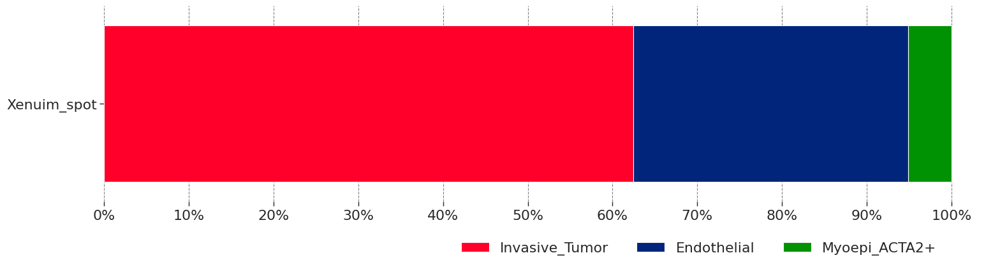

In [85]:
color_dict = ctype_hex_map
plot_columns = np.array(df_res_ROI4.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns
colors = plot_colors
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

plot_stackedbar_p(df_res_ROI4, labels, colors, title, subtitle)

View of AnnData object with n_obs × n_vars = 2858 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


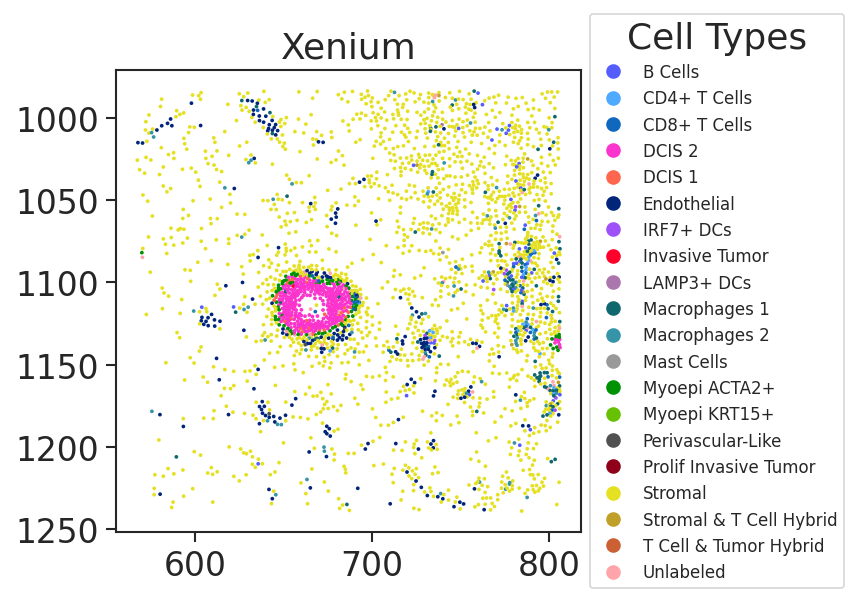

In [86]:
from matplotlib.path import Path
polygon = Path(polygon4* visium_scale_factors["tissue_hires_scalef"])

xenium_mat_ROI4 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
print(xenium_mat_ROI4)
colors = xenium_mat_ROI4.obs['cell_type'].map(ctype_hex_map_xenium)

## row
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)
plt.scatter(xenium_mat_ROI4.obsm['spatial'][:, 0], xenium_mat_ROI4.obsm['spatial'][:, 1], s=1.0, c=colors)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=color, label=cell_type, markersize=6) 
                   for cell_type, color in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI4.pdf', format='pdf')

View of AnnData object with n_obs × n_vars = 2612 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


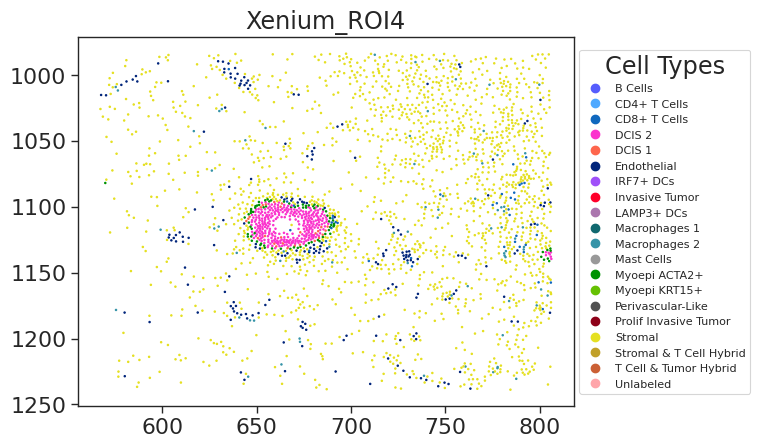

In [87]:
# clust_labels = ['#ff002a', '#009203', '#66c102', '#01257b']
clust_labels = ['#009203', '#FE664D', '#fb34cd', '#e5e022', '#01257b', '#3694a8', '#1068be']
# 从colors中选择包含clust_labels的所有行
selected_rows = colors.isin(clust_labels)
# 从xenium_mat_ROI4中选择相应的样本
xenium_mat_ROI4_sele = xenium_mat_ROI4[selected_rows.values, :]
colors_sele = xenium_mat_ROI4_sele.obs['cell_type'].map(ctype_hex_map_xenium)
print(xenium_mat_ROI4_sele)

## row
fig, ax = plt.subplots(1, 1, dpi=100)
plt.scatter(xenium_mat_ROI4_sele.obsm['spatial'][:, 0], xenium_mat_ROI4_sele.obsm['spatial'][:, 1], s=1.0, c=colors_sele)

legend_elements = [plt.Line2D([0], [0], linestyle='', marker='o', color=colors_sele, label=cell_type, markersize=6) 
                   for cell_type, colors_sele in ctype_hex_map_xenium.items()]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5), title='Cell Types', fontsize=8)
ax.invert_yaxis()
plt.title('Xenium_ROI4')
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Xenium_ROI4_sele.pdf', format='pdf')

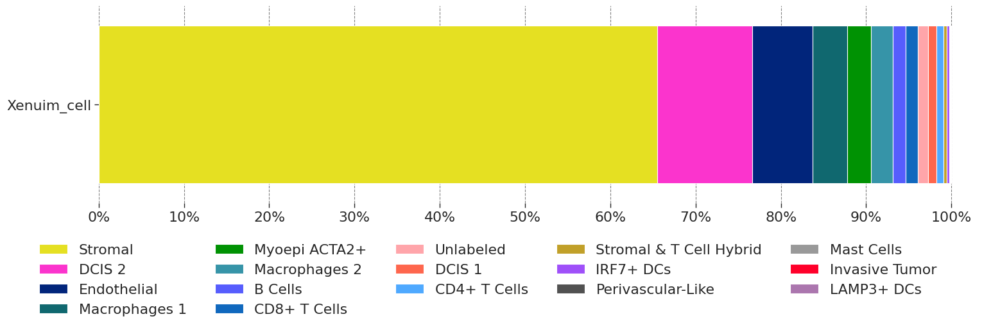

In [88]:
cell_DCSI4 = pd.DataFrame(xenium_mat_ROI4.obs['cell_type'].value_counts()/xenium_mat_ROI4.obs['cell_type'].value_counts().sum())
cell_DCSI4.columns = ['Xenuim_cell']

df_res_DCSI4 = cell_DCSI4.T
# print(df_res_DCSI4)

# variables
color_dict = ctype_hex_map_xenium
plot_columns = np.array(df_res_DCSI4.columns)
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns 
colors = plot_colors
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'

# plot_stackedbar_p(df_res_DCSI4, labels, colors, title, subtitle)

os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
plot_stackedbar_p(df_res_DCSI4, labels, colors, title, subtitle, 'Xenium_ROI4_prop.pdf')

In [89]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# df_res_DCSI4.to_csv('celltype_xeniumgt_ROI4.csv')

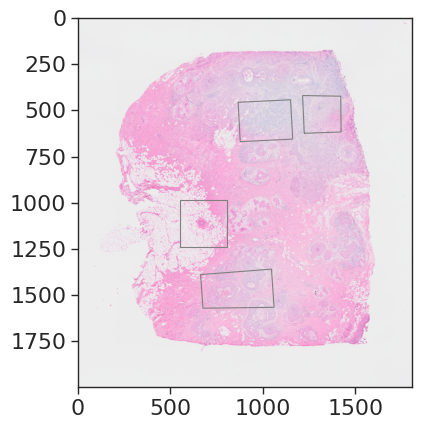

In [90]:
from matplotlib import pyplot as plt
from matplotlib.patches import Polygon

# ## white fill
# fig, ax = plt.subplots(dpi=100)
# ax.imshow(visium_high_res_image)
# polygon = Polygon(polygon_points * visium_scale_factors["tissue_hires_scalef"], fill=True, color='white', alpha=0.3)
# ax.add_patch(polygon)
# polygon = Polygon(polygon2 * visium_scale_factors["tissue_hires_scalef"], fill=True, color='white', alpha=0.3)
# ax.add_patch(polygon)
# polygon = Polygon(polygon3 * visium_scale_factors["tissue_hires_scalef"], fill=True, color='white', alpha=0.3)
# ax.add_patch(polygon)
# polygon = Polygon(polygon4 * visium_scale_factors["tissue_hires_scalef"], fill=True, color='white', alpha=0.3)
# ax.add_patch(polygon)
# plt.show()

fig, ax = plt.subplots(dpi=100)
ax.imshow(visium_high_res_image)
polygon = Polygon(polygon_points * visium_scale_factors["tissue_hires_scalef"], fill=False, edgecolor='gray')
ax.add_patch(polygon)
polygon = Polygon(polygon2 * visium_scale_factors["tissue_hires_scalef"], fill=False, edgecolor='gray')
ax.add_patch(polygon)
polygon = Polygon(polygon3 * visium_scale_factors["tissue_hires_scalef"], fill=False, edgecolor='gray')
ax.add_patch(polygon)
polygon = Polygon(polygon4 * visium_scale_factors["tissue_hires_scalef"], fill=False, edgecolor='gray')
ax.add_patch(polygon)
plt.show()

# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# fig.savefig('Visium_ROIs_mark.pdf', format='pdf')

## Cell feature matrix: Slide correlation

-cell2location outperforms TransImp, in terms of average cell type expression

-py310 doesn't work

-see https://localhost:8888/notebooks/SpatialScope/Nuclei_Segmentation_ROIcompare.ipynb

For Xenium, 

-cell_feature_matrix:'Xenium/xenium-publication/xenium/outs/cell_feature_matrix.h5'

-obs['cell_type']: 'Xenium/xenium-publication/cell_groups.csv'

-obsm['spatial']: 'Xenium/xenium-publication/xenium/outs/cells.csv.gz'

In [1]:
import os
# path = '/Users/lilingyu/E/PhD/Python/'
# path = '/storage3/yhhuang/users/lingyu/'
# path = '/data/users/lingyu/'
# path = '/home/lly/Python/'
path = '/mnt/lingyu/nfs_share2/Python/'

In [2]:
import scanpy as sc
xenium_mat = sc.read_h5ad(str(path)+'Xenium/xenium-publication/xenium_cell_feature_matrix.h5ad')
print(xenium_mat)

AnnData object with n_obs × n_vars = 167780 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


In [3]:
print(xenium_mat.obs_names)
print(xenium_mat.var_names)
print(xenium_mat.obs['cell_type'])

Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10',
       ...
       '167771', '167772', '167773', '167774', '167775', '167776', '167777',
       '167778', '167779', '167780'],
      dtype='object', length=167780)
Index(['ABCC11', 'ACTA2', 'ACTG2', 'ADAM9', 'ADGRE5', 'ADH1B', 'ADIPOQ',
       'AGR3', 'AHSP', 'AIF1',
       ...
       'TUBB2B', 'TYROBP', 'UCP1', 'USP53', 'VOPP1', 'VWF', 'WARS', 'ZEB1',
       'ZEB2', 'ZNF562'],
      dtype='object', length=313)
1                 DCIS 2
2                 DCIS 2
3              Unlabeled
4         Invasive Tumor
5                 DCIS 2
               ...      
167776            DCIS 1
167777            DCIS 2
167778            DCIS 1
167779            DCIS 2
167780            DCIS 1
Name: cell_type, Length: 167780, dtype: category
Categories (20, object): ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', ..., 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid', 'Unlabeled']


In [4]:
import pandas as pd
xenium_mat_clty = pd.DataFrame(xenium_mat.X.A, columns=xenium_mat.var_names)
xenium_mat_clty['cell_type'] = xenium_mat.obs['cell_type'].values

## group cell_type and get gene average expression
xenium_ave_exp = xenium_mat_clty.groupby('cell_type').mean()
xenium_clty_exp = pd.DataFrame(xenium_ave_exp.values, index=xenium_ave_exp.index, columns=xenium_ave_exp.columns)
print(xenium_clty_exp.shape)

(20, 313)


/tmp/ipykernel_1447215/1088059416.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  xenium_ave_exp = xenium_mat_clty.groupby('cell_type').mean()


In [6]:
import os
# os.chdir(str(path)+'SpatialData/Data/')

###########################################
# cell2location
###########################################
# import scanpy as sc
# cell2loc_mat = sc.read_h5ad("visium_nuclei_annotated_cell2l_scFFPE.h5ad")
# clust_labels = ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid']
# cell2loc_mat.obs['cell_type'] = cell2loc_mat.obs[clust_labels].idxmax(axis=1)
# cell2loc_mat

###########################################
# TransImp
###########################################
# cell2loc_mat = sc.read_h5ad("visium_nuclei_annotated_TransImp_scFFPE.h5ad")
# cell2loc_mat
demo_data = 'BRCAhuman_data/'
cell2loc_mat = sc.read_h5ad(f'{path}FineST/FineST_demo/{demo_data}SaveData/nuclei_anno_TransImp.h5ad')
# cell2loc_mat

In [7]:
cell2loc_mat_clty = pd.DataFrame(cell2loc_mat.X, columns=cell2loc_mat.var_names)
cell2loc_mat_clty['cell_type'] = cell2loc_mat.obs['cell_type'].values

cell2loc_ave_exp = cell2loc_mat_clty.groupby('cell_type').mean()
cell2loc_clty_exp = pd.DataFrame(cell2loc_ave_exp.values, index=cell2loc_ave_exp.index, columns=cell2loc_ave_exp.columns)
print(cell2loc_clty_exp.shape)

(19, 863)


/tmp/ipykernel_1447215/3654998997.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell2loc_ave_exp = cell2loc_mat_clty.groupby('cell_type').mean()


In [8]:
## get the same row and col
common_rows = xenium_ave_exp.index.intersection(cell2loc_clty_exp.index)
common_columns = xenium_ave_exp.columns.intersection(cell2loc_clty_exp.columns)
print(common_rows.shape, common_columns.shape)

xenium_ave_exp_sel = xenium_ave_exp.loc[common_rows, common_columns]
cell2loc_ave_exp_sel = cell2loc_ave_exp.loc[common_rows, common_columns]
# xenium_spotbinned_celltypes_nuclei = xenium_spotbinned_celltypes_nuclei.reindex(index = nuclei_spotbinned_celltypes_normed_df.index, 
                                                                                # columns = nuclei_spotbinned_celltypes_normed_df.columns)
print(xenium_ave_exp_sel.shape)
print(cell2loc_ave_exp_sel.shape)

(19,) (61,)
(19, 61)
(19, 61)


In [9]:
xenium_ave_exp_sel.head()

,ADGRE5,ADIPOQ,AVPR1A,CCL20,CCL5,CCL8,CCR7,CD27,CD274,CD4,...,POSTN,PTN,PTPRC,SDC4,SELL,SSTR2,TAC1,TIGIT,TNFRSF17,VWF
cell_type,,,,,,,,,,,,,,,,,,,,,
B Cells,0.463204,0.017245,0.017245,0.006617,0.227391,0.038901,0.196110,0.912372,0.038099,0.498697,...,2.161420,0.074393,1.523160,0.071586,0.707640,0.012031,0.028474,0.039703,0.610989,0.139362
CD4+ T Cells,0.434402,0.010529,0.014314,0.051579,0.457471,0.024015,0.584999,0.281793,0.041287,1.384597,...,0.584290,0.030640,2.822430,0.032888,0.641784,0.004732,0.009582,0.242399,0.014669,0.152017
CD8+ T Cells,0.737320,0.011816,0.012536,0.034150,2.876945,0.033573,0.365994,0.297695,0.045389,0.903602,...,1.445677,0.075648,3.644092,0.050720,0.444380,0.007493,0.017579,0.275793,0.026945,0.156628
DCIS 1,0.063143,0.007119,0.005262,0.004411,0.043179,0.005339,0.006964,0.008125,0.012923,0.132167,...,0.421651,0.516211,0.066238,0.771957,0.015399,0.003173,0.018881,0.008821,0.003869,0.054554
DCIS 2,0.032697,0.004451,0.006762,0.004365,0.041342,0.014380,0.008987,0.009758,0.009587,0.091072,...,0.238723,0.123855,0.077720,0.250963,0.021399,0.004879,0.011213,0.008131,0.004708,0.052041


In [10]:
cell2loc_ave_exp_sel.head()

,ADGRE5,ADIPOQ,AVPR1A,CCL20,CCL5,CCL8,CCR7,CD27,CD274,CD4,...,POSTN,PTN,PTPRC,SDC4,SELL,SSTR2,TAC1,TIGIT,TNFRSF17,VWF
cell_type,,,,,,,,,,,,,,,,,,,,,
B Cells,0.424037,0.027737,0.069767,0.059004,0.493282,0.123677,0.379455,0.346165,0.103426,0.628355,...,0.916226,0.191665,0.379276,0.263158,0.557444,0.032794,0.048196,0.216915,0.196651,0.362410
CD4+ T Cells,0.403675,0.047207,0.074500,0.059557,0.521472,0.107619,0.421054,0.301099,0.131835,0.636306,...,0.926599,0.167595,0.371683,0.269565,0.537436,0.026167,0.038841,0.229403,0.158005,0.419541
CD8+ T Cells,0.400554,0.032761,0.073278,0.051713,0.615359,0.120846,0.249418,0.279087,0.088143,0.608988,...,1.071875,0.193187,0.348482,0.264909,0.418041,0.024518,0.038106,0.154531,0.167316,0.319719
DCIS 1,0.211309,0.025122,0.049290,0.041006,0.253429,0.041644,0.082575,0.110149,0.061368,0.347362,...,0.854858,0.395317,0.112797,0.646768,0.127158,0.020821,0.055199,0.070254,0.090359,0.268147
DCIS 2,0.205443,0.030259,0.061324,0.040061,0.313873,0.067277,0.113617,0.129340,0.051668,0.388218,...,0.910796,0.192179,0.142987,0.520140,0.188263,0.031641,0.043216,0.075878,0.088146,0.295887


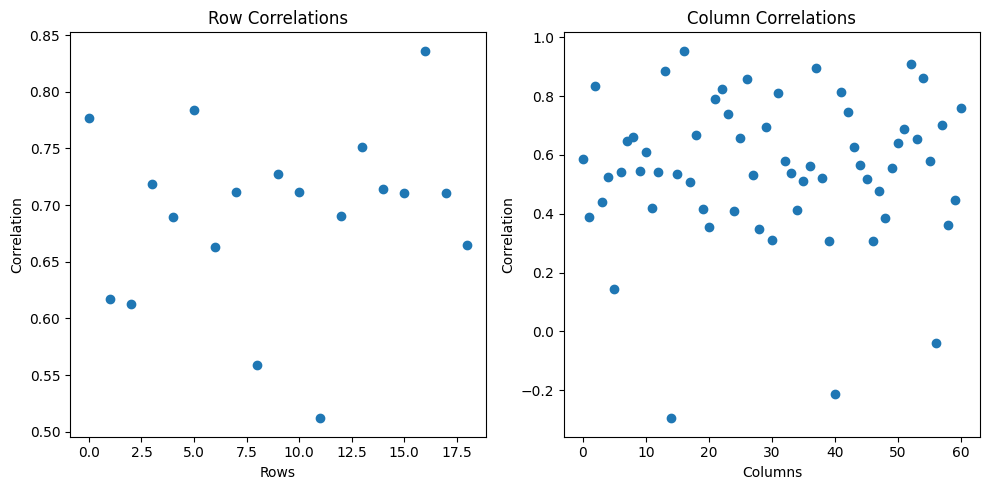

In [14]:
import matplotlib.pyplot as plt
def plot_row_col_correlations(xenium_ave_exp_sel, cell2loc_clty_exp):
    """
    Compute row and column correlations between two DataFrames and plot scatter plots.

    Args:
        xenium_ave_exp_sel (pd.DataFrame): First DataFrame.
        cell2loc_clty_exp (pd.DataFrame): Second DataFrame.

    Returns:
        row_correlations (pd.Series): Correlations computed across rows.
        column_correlations (pd.Series): Correlations computed across columns.
    """
    # Compute row-wise and column-wise correlations
    row_correlations = xenium_ave_exp_sel.corrwith(cell2loc_clty_exp, axis=1)
    column_correlations = xenium_ave_exp_sel.T.corrwith(cell2loc_clty_exp.T, axis=1)

    # Create subplots
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # Plot row correlations as scatter plot
    ax[0].scatter(range(len(row_correlations)), row_correlations)
    ax[0].set_title('Row Correlations')
    ax[0].set_xlabel('Rows')
    ax[0].set_ylabel('Correlation')

    # Plot column correlations as scatter plot
    ax[1].scatter(range(len(column_correlations)), column_correlations)
    ax[1].set_title('Column Correlations')
    ax[1].set_xlabel('Columns')
    ax[1].set_ylabel('Correlation')

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

    return row_correlations, column_correlations


row_corr, col_corr = plot_row_col_correlations(xenium_ave_exp_sel, cell2loc_clty_exp)

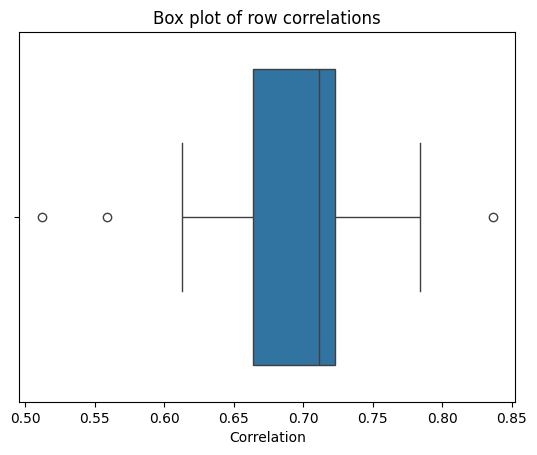

In [15]:
## Compute row correlations
row_correlations = xenium_ave_exp_sel.corrwith(cell2loc_ave_exp_sel, axis=1)

import seaborn as sns
sns.boxplot(x=row_correlations)
plt.title('Box plot of row correlations')
plt.xlabel('Correlation')
plt.show()

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


def plot_correlations(df1, df2):
    sns.set_style("ticks")
    sns.set(font_scale=1.5)

    # Compute row and column correlations
    row_correlations = df1.corrwith(df2, axis=1)
    column_correlations = df1.T.corrwith(df2.T, axis=1)

    # Create a DataFrame with row and column correlations
    correlations_df = pd.DataFrame({'Spot': row_correlations, 'Gene': column_correlations})

    # Melt the DataFrame to long format
    melted_correlations_df = correlations_df.melt(var_name='Correlation Type', value_name='Correlation')

    # Create a box plot of row and column correlations
    sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")
    plt.title('Correlations')
    plt.xlabel('Correlation Type')
    plt.ylabel('Correlation')
    
    ## recover plt style
    plt.rcdefaults()

    # Show the plot
    plt.show()

/tmp/ipykernel_1447215/2154764137.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")


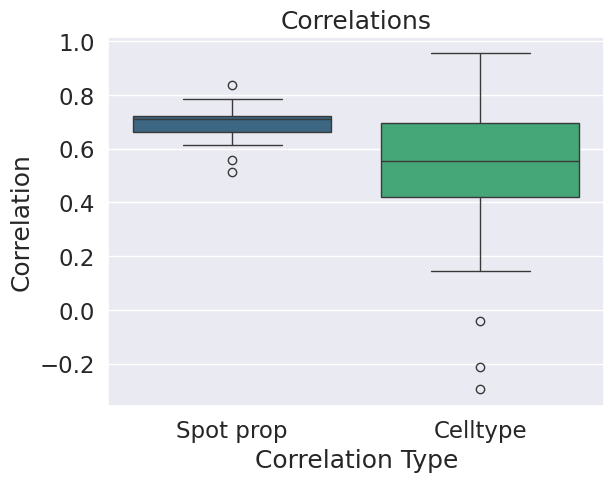

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set style and font size
sns.set_style("white")
sns.set(font_scale=1.5)

# Compute row and column correlations
row_correlations = xenium_ave_exp_sel.corrwith(cell2loc_ave_exp_sel, axis=1)
column_correlations = xenium_ave_exp_sel.T.corrwith(cell2loc_ave_exp_sel.T, axis=1)

# Create a DataFrame with row and column correlations
correlations_df = pd.DataFrame({'Spot prop': row_correlations, 'Celltype': column_correlations})

# Melt the DataFrame to long format
melted_correlations_df = correlations_df.melt(var_name='Correlation Type', value_name='Correlation')

# Create a box plot of row and column correlations
sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")
plt.title('Correlations')
plt.xlabel('Correlation Type')
plt.ylabel('Correlation')

# Show the plot
plt.show()

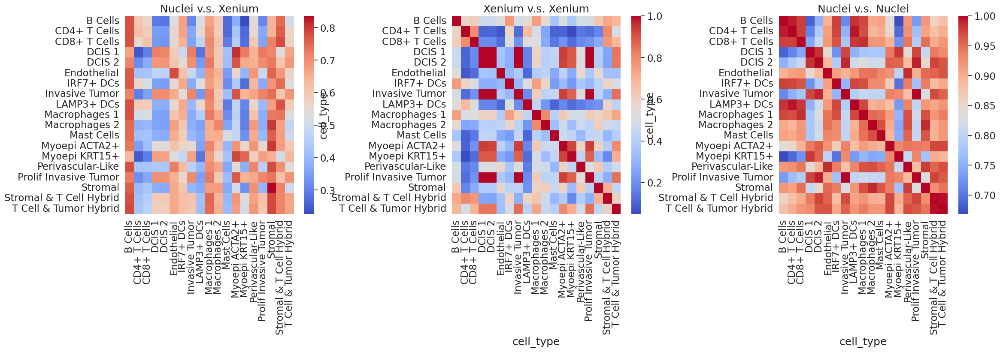

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(26, 6), dpi=100)

corr_list = []
for index1 in cell2loc_ave_exp_sel.T.columns:
    temp_list = []
    for index2 in xenium_ave_exp_sel.T.columns:
        temp_list.append(cell2loc_ave_exp_sel.T[index1].corr(xenium_ave_exp_sel.T[index2]))
    corr_list.append(temp_list)
corr_df = pd.DataFrame(corr_list)

sns.heatmap(corr_df, annot=False, cmap='coolwarm', 
            xticklabels=xenium_ave_exp_sel.T.columns, 
            yticklabels=cell2loc_ave_exp_sel.T.columns, ax=axes[0])
axes[0].set_title('Nuclei v.s. Xenium')


corr_xenium = xenium_ave_exp_sel.T.corr()
sns.heatmap(corr_xenium, annot=False, cmap='coolwarm', ax=axes[1])
axes[1].set_title('Xenium v.s. Xenium')


corr_nuclei = cell2loc_ave_exp_sel.T.corr()
sns.heatmap(corr_nuclei, annot=False, cmap='coolwarm', ax=axes[2])
axes[2].set_title('Nuclei v.s. Nuclei')


plt.subplots_adjust(wspace=0.55)
plt.show()

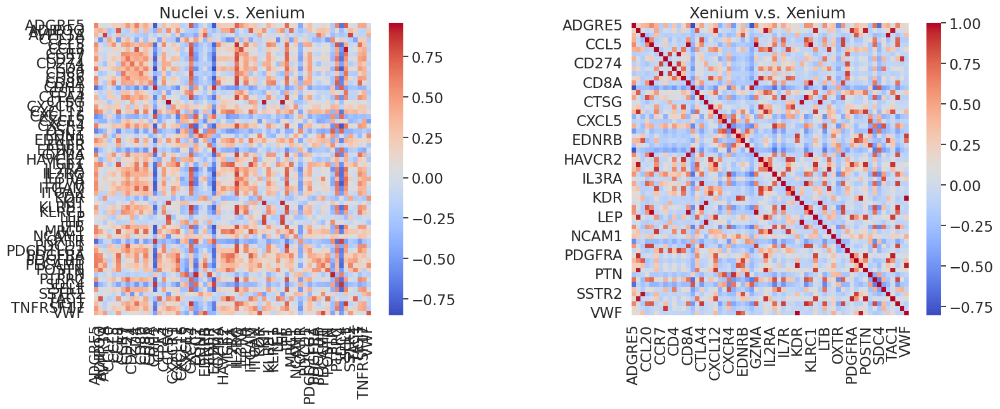

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=100)

corr_list = []
for col1 in cell2loc_ave_exp_sel.columns:
    temp_list = []
    for col2 in xenium_ave_exp_sel.columns:
        temp_list.append(cell2loc_ave_exp_sel[col1].corr(xenium_ave_exp_sel[col2]))
    corr_list.append(temp_list)
corr_df = pd.DataFrame(corr_list)

sns.heatmap(corr_df, annot=False, cmap='coolwarm', xticklabels=xenium_ave_exp_sel.columns, 
            yticklabels=cell2loc_ave_exp_sel.columns, ax=axes[0])
axes[0].set_title('Nuclei v.s. Xenium')


corr_xenium = xenium_ave_exp_sel.corr()
sns.heatmap(corr_xenium, annot=False, cmap='coolwarm', ax=axes[1])
axes[1].set_title('Xenium v.s. Xenium ')

plt.subplots_adjust(wspace=0.55)
plt.show()

## Cell_feature_matrix: ROIs correlation

In [12]:
ctype_hex_map = {'B Cells': '#565DFD',
 'CD4+ T Cells': '#4fa9ff',
 'CD8+ T Cells': '#1068be',
 # 'DCIS 1': '#fb34cd',
 # 'DCIS 2': '#FE664D',
 'DCIS 2': '#fb34cd',
 'DCIS 1': '#FE664D',
 'Endothelial': '#01257b',
 'IRF7+ DCs': '#9f50f9',
 'Invasive Tumor': '#ff002a',
 'LAMP3+ DCs': '#AB76AE',
 'Macrophages 1': '#10686f',
 'Macrophages 2': '#3694a8',
 'Mast Cells': '#999999',
 'Myoepi ACTA2+': '#009203',
 'Myoepi KRT15+': '#66c102',
 'Perivascular-Like': '#515151',
 'Prolif Invasive Tumor': '#8e0119',
 'Stromal': '#e5e022',
 'Stromal & T Cell Hybrid': '#C1A029',
 'T Cell & Tumor Hybrid': '#CB6035',
 'Unlabeled': '#ffa5aa'}

In [13]:
def select_common_rows_cols(df1, df2):
    common_rows = df1.index.intersection(df2.index)
    common_columns = df1.columns.intersection(df2.columns)
    print(common_rows.shape, common_columns.shape)

    df1_sel = df1.loc[common_rows, common_columns]
    df2_sel = df2.loc[common_rows, common_columns]
    print(df1_sel.shape)
    print(df2_sel.shape)
    
    return df1_sel, df2_sel


import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def plot_correlation_boxplot(df1, df2, output_file=None):
    # Set style and font size
    # sns.set_style("ticks")
    sns.set(font_scale=1.5)

    # Compute row and column correlations
    row_correlations = df1.corrwith(df2, axis=1)
    column_correlations = df1.T.corrwith(df2.T, axis=1)

    # Create a DataFrame with row and column correlations
    correlations_df = pd.DataFrame({'Spot prop': row_correlations, 'Celltype': column_correlations})

    # Melt the DataFrame to long format
    melted_correlations_df = correlations_df.melt(var_name='Correlation Type', value_name='Correlation')

    # Create a box plot of row and column correlations
    box_plot = sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")
    plt.title('Correlations', fontsize=20)
    plt.xlabel('Correlation Type', fontsize=18)
    plt.ylabel('Correlation', fontsize=18)

    # Remove the top and right spines for a cleaner look
    sns.despine()

    # Set the linewidth and tick size
    plt.gca().spines['left'].set_linewidth(1.5)
    plt.gca().spines['bottom'].set_linewidth(1.5)
    plt.gca().tick_params(width=1.5, length=6)
    
    if output_file is not None:
        plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)  
    
    # Show the plot
    plt.show()

    # Reset style and context to default
    sns.reset_defaults()

    return row_correlations
    

def plot_heatmaps(df1, df2, output_file=None):
    fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=100)

    corr_df1_df1 = df1.T.corr()
    corr_df2_df1 = df1.T.apply(lambda x: df2.T.apply(lambda y: y.corr(x)))

    # 使用 NumPy 的 triu 和 tril 函数合并两个相关性矩阵
    combined_corr = np.triu(corr_df1_df1) + np.tril(corr_df2_df1, -1)

    sns.heatmap(combined_corr, annot=False, cmap='coolwarm', 
                xticklabels=df1.T.columns, 
                yticklabels=df1.T.columns, ax=axes[0])
    axes[0].set_title('Nuclei v.s. Xenium & Xenium v.s. Xenium')

    corr_xenium = df1.T.corr()
    sns.heatmap(corr_xenium, annot=False, cmap='coolwarm', ax=axes[1])
    axes[1].set_title('Xenium v.s. Xenium ')

    plt.subplots_adjust(wspace=0.55)

    if output_file is not None:
        plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)  
    
    plt.show()


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
def plot_correlation_barplot(correlations: pd.Series, ctype_hex_map: dict, title: str, figsize=(5, 4), output_file=None):
    # Set figure size
    plt.figure(figsize=figsize)

    # Set background style
    custom_params = {"axes.spines.right": False, "axes.spines.top": False}
    sns.set_theme(style="ticks", rc=custom_params)

    # Sort the values in descending order
    sorted_correlations = correlations.sort_values(ascending=False)

    # Get the colors for each cell type from ctype_hex_map
    colors = [ctype_hex_map[cell_type] for cell_type in sorted_correlations.index]

    # Create the bar plot with the specified colors
    bar_plot = sns.barplot(x=sorted_correlations.index, y=sorted_correlations.values, palette=colors)

    # Customize the plot
    plt.title(title, fontsize=15, pad=12)
    plt.xlabel('Cell Type', fontsize=15, labelpad=12)
    plt.ylabel('Correlation', fontsize=15, labelpad=12)
    plt.xticks(rotation=90, fontsize=12)  # Rotate x-axis labels for better readability
    plt.yticks(fontsize=12)

    # Add grey dashed lines every 0.1 on the y-axis
    for y in np.arange(0, 1, 0.1):  # adjust the range according to your data
        plt.axhline(y, color='grey', linestyle='--', linewidth=0.5)

    # Remove the top and right spines for a cleaner look
    sns.despine()

    if output_file is not None:
        plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=100)  

    # Show the plot
    plt.show()

In [14]:
import os
# path = '/Users/lilingyu/E/PhD/Python/'
# path = '/storage3/yhhuang/users/lingyu/'
# path = '/data/users/lingyu/'
# path = '/home/lly/Python/'
path = '/mnt/lingyu/nfs_share2/Python/'

In [15]:
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import scanpy as sc

https://192.168.50.25:8889/notebooks/SpatialScope/Nuclei_Segmentation_ROIcompare_Train2.ipynb

In [16]:
demo_data = 'BRCAhuman_data/'
st_adata_TransImp = sc.read_h5ad(f'{path}FineST/FineST_demo/{demo_data}SaveData/nuclei_anno_TransImp.h5ad')
print(st_adata_TransImp)

AnnData object with n_obs × n_vars = 56794 × 863
    obs: 'x', 'y', 'cell_type'
    var: 'mt', 'n_cells'
    uns: 'cell_type_colors', 'log1p', 'pca', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


In [17]:
def crop_and_save_by_polygon(
    st_adata, 
    polygon_points, 
    img_key='hires', 
    color='cell_type', 
    title='TransImp', 
    size=0.25, 
    alpha_img=0.9, 
    palette=None
):
    """
    Crop AnnData object by a polygon region, save the result, and plot spatial data.

    Args:
        st_adata (AnnData): Input AnnData object with obsm["spatial"] coordinates.
        polygon_points (np.ndarray): 2D numpy array of polygon vertices, shape (n_points, 2).
        img_key (str): Key for image in AnnData.uns.
        color (str): Key for color annotation.
        title (str): Plot title.
        size (float): Spot size for plotting.
        alpha_img (float): Alpha for background image.
        palette (dict or list, optional): Color palette.

    Returns:
        st_crop (AnnData): Cropped AnnData object.
    """
    # Create Path object for polygon
    polygon = Path(polygon_points)
    # Find points within the polygon
    mask = polygon.contains_points(st_adata.obsm["spatial"])
    st_crop = st_adata[mask, :].copy()
    print(st_crop)

    # Plot
    fig, ax = plt.subplots(1, 1, dpi=100)
    sc.pl.spatial(
        st_crop, 
        img_key=img_key, 
        color=color, 
        title=title, 
        size=size, 
        alpha_img=alpha_img, 
        palette=palette, 
        ax=ax,
        show=True
    )
    return st_crop

AnnData object with n_obs × n_vars = 5616 × 863
    obs: 'x', 'y', 'cell_type'
    var: 'mt', 'n_cells'
    uns: 'cell_type_colors', 'log1p', 'pca', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


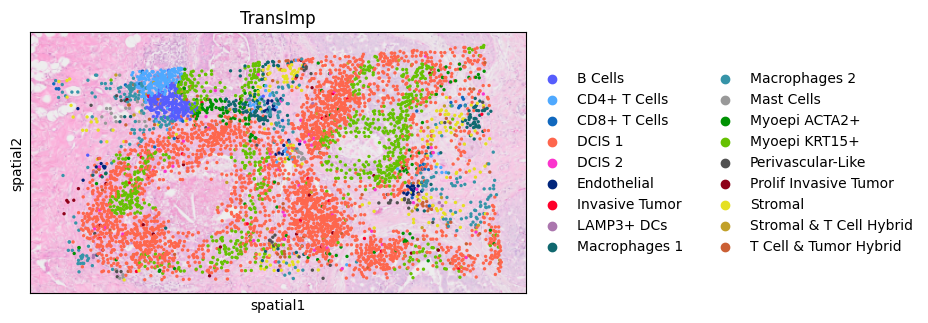

In [18]:
polygon_points1 = np.array([[7153.7988057548255, 11291.780890749125, 11444.567921579684, 7293.853584016171], 
                           [14977.526715321099, 14659.22040109077, 16887.364600703084, 16938.293610979938]]).T

st_crop = crop_and_save_by_polygon(st_adata_TransImp, polygon_points1, palette=ctype_hex_map)

## save data
roi_data = 'ROIData'
save_dir = os.path.join(f'{path}FineST/FineST_demo/{demo_data}', roi_data)
os.makedirs(save_dir, exist_ok=True)  
st_crop.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/st_crop_TransImp_DCIS1.h5ad')

AnnData object with n_obs × n_vars = 3349 × 863
    obs: 'x', 'y', 'cell_type'
    var: 'mt', 'n_cells'
    uns: 'cell_type_colors', 'log1p', 'pca', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


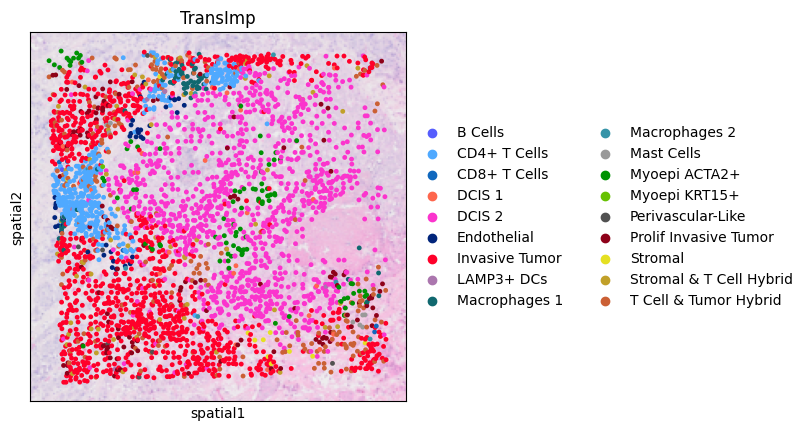

In [19]:
polygon_points2 = np.array([[13107.567467473213, 15334.344811164356, 15356.446819538462, 13201.40836466815, 13205.890527448819], 
                          [4527.231645961396, 4565.910160616081, 6654.549951969062, 6730.587870812411, 6735.07003359308]]).T
st_crop = crop_and_save_by_polygon(st_adata_TransImp, polygon_points2, palette=ctype_hex_map)
st_crop.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/st_crop_TransImp_DCIS2.h5ad')

AnnData object with n_obs × n_vars = 5881 × 863
    obs: 'x', 'y', 'cell_type'
    var: 'mt', 'n_cells'
    uns: 'cell_type_colors', 'log1p', 'pca', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


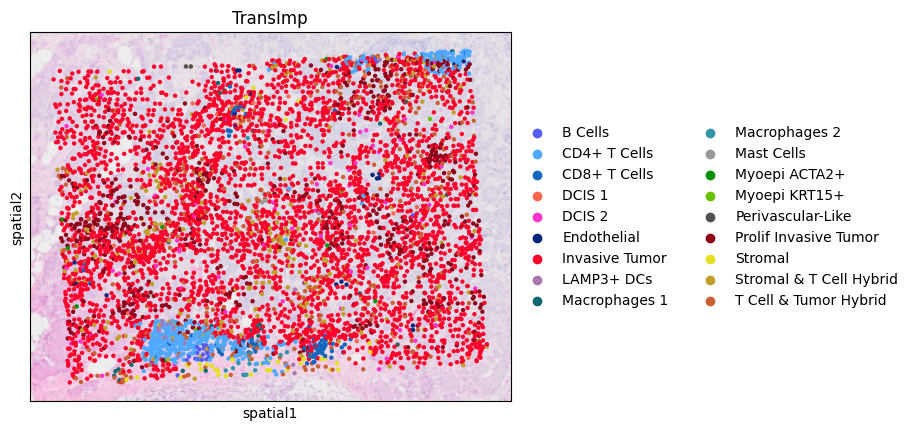

In [20]:
polygon_points3 = np.array([[9345.733380213871, 12404.18896320663, 12533.611359814342, 9468.344071736967, 9468.344071736967], 
                          [4923.186042375999, 4773.328530514438, 7068.873144030162, 7218.730655891723, 7218.730655891723]]).T
st_crop = crop_and_save_by_polygon(st_adata_TransImp, polygon_points3, palette=ctype_hex_map)
st_crop.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/st_crop_TransImp_DCIS3.h5ad')

AnnData object with n_obs × n_vars = 775 × 863
    obs: 'x', 'y', 'cell_type'
    var: 'mt', 'n_cells'
    uns: 'cell_type_colors', 'log1p', 'pca', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


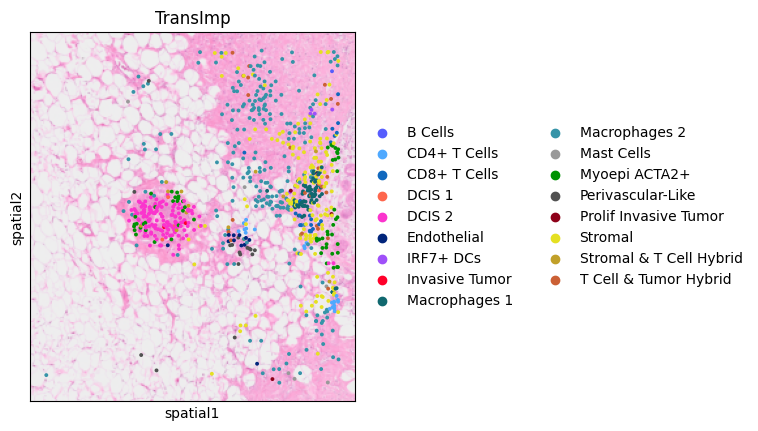

In [21]:
polygon_points4 = np.array([[5939.0512888550375, 8694.69027461145, 8694.69027461145, 5939.05128885503759], 
                          [10606.69653598249, 10606.69653598249, 13362.335521738056, 13362.335521738056]]).T
st_crop = crop_and_save_by_polygon(st_adata_TransImp, polygon_points4, palette=ctype_hex_map)
st_crop.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/st_crop_TransImp_DCIS4.h5ad')

In [22]:
#####################
# Xenium
#####################
xenium_mat = sc.read_h5ad(str(path)+'Xenium/xenium-publication/xenium_cell_feature_matrix.h5ad')
print(xenium_mat.obsm["spatial"].shape)
xenium_mat.obsm["spatial"]

xenium_mat.obsm["spatial"]= (
    transform_coordinates(
        pd.DataFrame(xenium_mat.obsm["spatial"]).values,
        xenium_to_visium_full_res_transformation,
    )
    * visium_scale_factors["tissue_hires_scalef"]
)

from matplotlib.path import Path
polygon = Path(polygon_points1 * visium_scale_factors["tissue_hires_scalef"])
xenium_mat_ROI1 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
xenium_mat_ROI1.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/xenium_mat_ROI1.h5ad')

polygon = Path(polygon_points2 * visium_scale_factors["tissue_hires_scalef"])
xenium_mat_ROI2 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
xenium_mat_ROI2.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/xenium_mat_ROI2.h5ad')

polygon = Path(polygon_points3 * visium_scale_factors["tissue_hires_scalef"])
xenium_mat_ROI3 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
xenium_mat_ROI3.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/xenium_mat_ROI3.h5ad')

polygon = Path(polygon_points4 * visium_scale_factors["tissue_hires_scalef"])
xenium_mat_ROI4 = xenium_mat[polygon.contains_points(xenium_mat.obsm["spatial"]), :]
xenium_mat_ROI4.write(f'{path}FineST/FineST_demo/{demo_data}{roi_data}/xenium_mat_ROI4.h5ad')

(167780, 2)


### ROI 1

In [23]:
os.chdir(f'{path}FineST/FineST_demo/{demo_data}{roi_data}')
st_crop_TransImp_ROI1 = sc.read_h5ad('st_crop_TransImp_DCIS1.h5ad')
st_crop_TransImp_ROI2 = sc.read_h5ad('st_crop_TransImp_DCIS2.h5ad')
st_crop_TransImp_ROI3 = sc.read_h5ad('st_crop_TransImp_DCIS3.h5ad')
st_crop_TransImp_ROI4 = sc.read_h5ad('st_crop_TransImp_DCIS4.h5ad')

xenium_mat_ROI1 = sc.read_h5ad('xenium_mat_ROI1.h5ad')
xenium_mat_ROI2 = sc.read_h5ad('xenium_mat_ROI2.h5ad')
xenium_mat_ROI3 = sc.read_h5ad('xenium_mat_ROI3.h5ad')
xenium_mat_ROI4 = sc.read_h5ad('xenium_mat_ROI4.h5ad')

In [24]:
print(st_crop_TransImp_ROI1)
print(xenium_mat_ROI1)

AnnData object with n_obs × n_vars = 5616 × 863
    obs: 'x', 'y', 'cell_type'
    var: 'mt', 'n_cells'
    uns: 'cell_type_colors', 'log1p', 'pca', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
AnnData object with n_obs × n_vars = 14146 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


In [25]:
xenium_mat_ROI1_clty = pd.DataFrame(xenium_mat_ROI1.X.A, columns=xenium_mat_ROI1.var_names)
xenium_mat_ROI1_clty['cell_type'] = xenium_mat_ROI1.obs['cell_type'].values

## group cell_type and get gene average expression
xenium_mat_ROI1_ave_exp = xenium_mat_ROI1_clty.groupby('cell_type').mean()
xenium_mat_ROI1_exp = pd.DataFrame(xenium_mat_ROI1_ave_exp.values, index=xenium_mat_ROI1_ave_exp.index, columns=xenium_mat_ROI1_ave_exp.columns)
print(xenium_mat_ROI1_exp.shape)

(20, 313)


/tmp/ipykernel_1931729/323560557.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  xenium_mat_ROI1_ave_exp = xenium_mat_ROI1_clty.groupby('cell_type').mean()


In [26]:
st_crop_TransImp_ROI1_clty = pd.DataFrame(st_crop_TransImp_ROI1.X, columns=st_crop_TransImp_ROI1.var_names)
st_crop_TransImp_ROI1_clty['cell_type'] = st_crop_TransImp_ROI1.obs['cell_type'].values

## group cell_type and get gene average expression
st_crop_TransImp_ROI1_ave_exp = st_crop_TransImp_ROI1_clty.groupby('cell_type').mean()
st_crop_TransImp_ROI1_exp = pd.DataFrame(st_crop_TransImp_ROI1_ave_exp.values, index=st_crop_TransImp_ROI1_ave_exp.index, columns=st_crop_TransImp_ROI1_ave_exp.columns)
print(st_crop_TransImp_ROI1_exp.shape)

(18, 863)


/tmp/ipykernel_1931729/2881166197.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  st_crop_TransImp_ROI1_ave_exp = st_crop_TransImp_ROI1_clty.groupby('cell_type').mean()


(18,) (61,)
(18, 61)
(18, 61)


/tmp/ipykernel_1931729/2487520240.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")


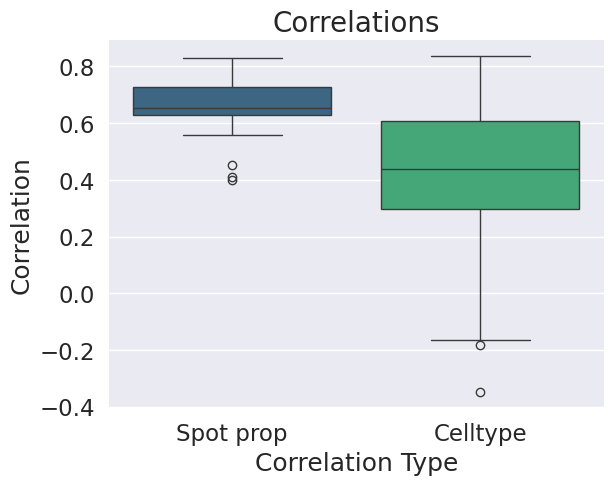

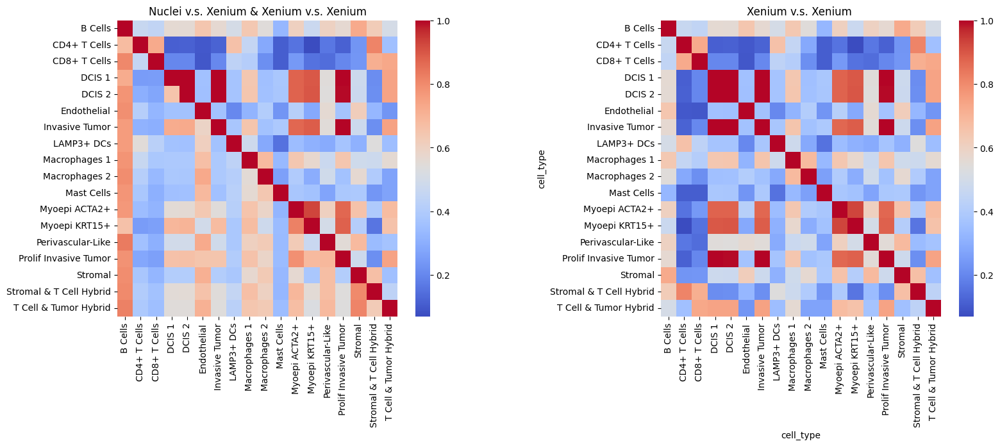

In [27]:
xenium_ave_exp_ROI1, transimp_ave_exp_ROI1 = select_common_rows_cols(xenium_mat_ROI1_exp, st_crop_TransImp_ROI1_exp)
transimp_ave_exp_ROI1_cor = plot_correlation_boxplot(xenium_ave_exp_ROI1, transimp_ave_exp_ROI1)
plot_heatmaps(xenium_ave_exp_ROI1, transimp_ave_exp_ROI1)

/tmp/ipykernel_1931729/2487520240.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=sorted_correlations.index, y=sorted_correlations.values, palette=colors)


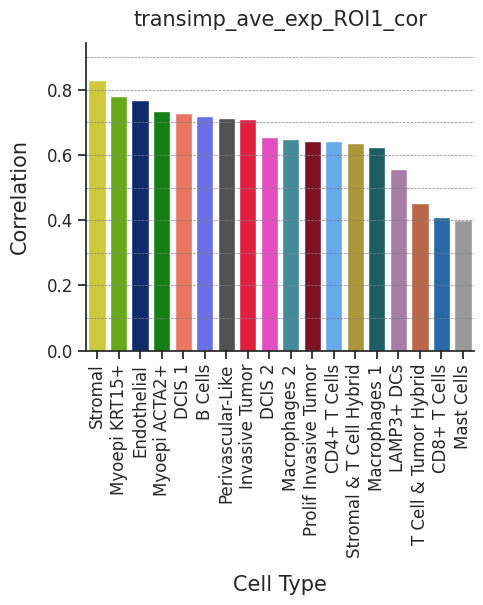

In [29]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
title='transimp_ave_exp_ROI1_cor' 
plot_correlation_barplot(transimp_ave_exp_ROI1_cor, ctype_hex_map, title)
# plot_correlation_barplot(transimp_ave_exp_ROI1_cor, ctype_hex_map_xenium, title, output_file=str(title)+'.pdf')

### ROI 2

In [31]:
xenium_mat_ROI2_clty = pd.DataFrame(xenium_mat_ROI2.X.A, columns=xenium_mat_ROI2.var_names)
xenium_mat_ROI2_clty['cell_type'] = xenium_mat_ROI2.obs['cell_type'].values

## group cell_type and get gene average expression
xenium_mat_ROI2_ave_exp = xenium_mat_ROI2_clty.groupby('cell_type').mean()
xenium_mat_ROI2_exp = pd.DataFrame(xenium_mat_ROI2_ave_exp.values, index=xenium_mat_ROI2_ave_exp.index, columns=xenium_mat_ROI2_ave_exp.columns)
print(xenium_mat_ROI2_exp.shape)

(20, 313)


/tmp/ipykernel_1931729/742271728.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  xenium_mat_ROI2_ave_exp = xenium_mat_ROI2_clty.groupby('cell_type').mean()


In [32]:
st_crop_TransImp_ROI2_clty = pd.DataFrame(st_crop_TransImp_ROI2.X, columns=st_crop_TransImp_ROI2.var_names)
st_crop_TransImp_ROI2_clty['cell_type'] = st_crop_TransImp_ROI2.obs['cell_type'].values

## group cell_type and get gene average expression
st_crop_TransImp_ROI2_ave_exp = st_crop_TransImp_ROI2_clty.groupby('cell_type').mean()
st_crop_TransImp_ROI2_exp = pd.DataFrame(st_crop_TransImp_ROI2_ave_exp.values, index=st_crop_TransImp_ROI2_ave_exp.index, columns=st_crop_TransImp_ROI2_ave_exp.columns)
print(st_crop_TransImp_ROI2_exp.shape)

(18, 863)


/tmp/ipykernel_1931729/4217368074.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  st_crop_TransImp_ROI2_ave_exp = st_crop_TransImp_ROI2_clty.groupby('cell_type').mean()


(18,) (61,)
(18, 61)
(18, 61)


/tmp/ipykernel_1931729/2487520240.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")


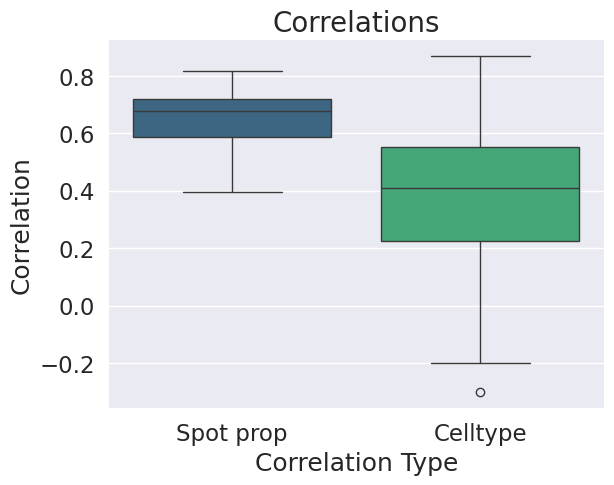

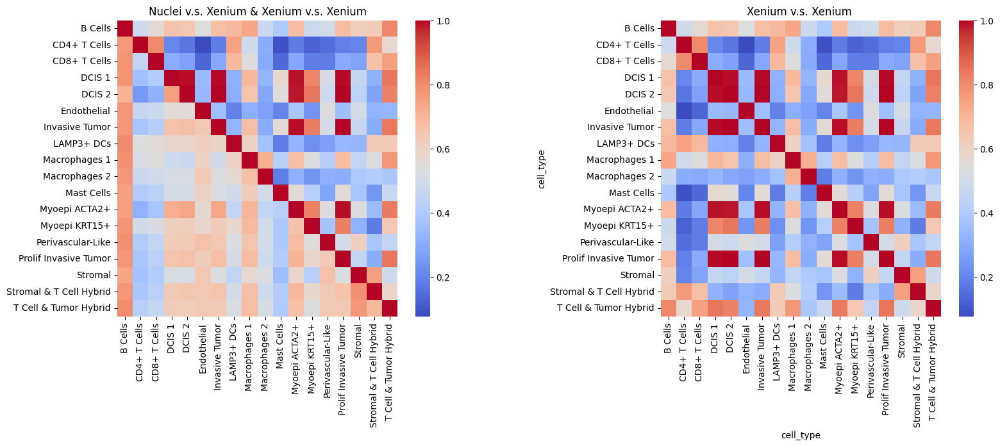

In [33]:
xenium_ave_exp_ROI2, transimp_ave_exp_ROI2 = select_common_rows_cols(xenium_mat_ROI2_exp, st_crop_TransImp_ROI2_exp)
transimp_ave_exp_ROI2_cor = plot_correlation_boxplot(xenium_ave_exp_ROI2, transimp_ave_exp_ROI2)
plot_heatmaps(xenium_ave_exp_ROI2, transimp_ave_exp_ROI2)

/tmp/ipykernel_2743596/2487520240.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=sorted_correlations.index, y=sorted_correlations.values, palette=colors)


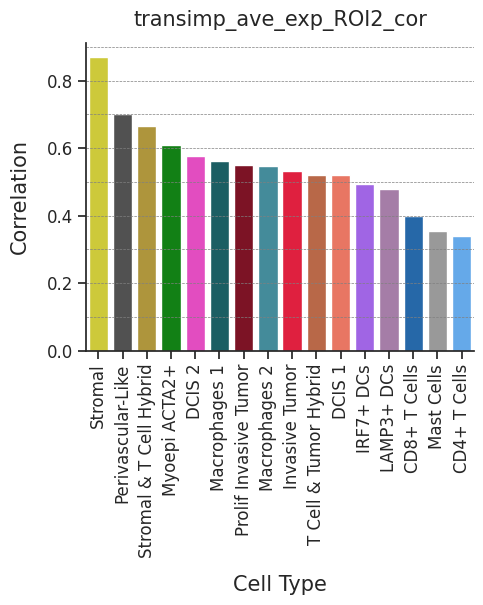

In [260]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# title='transimp_ave_exp_ROI2_cor' 
# plot_correlation_barplot(transimp_ave_exp_ROI2_cor, ctype_hex_map_xenium, title, output_file=str(title)+'.pdf')

### ROI 3

In [34]:
xenium_mat_ROI3_clty = pd.DataFrame(xenium_mat_ROI3.X.A, columns=xenium_mat_ROI3.var_names)
xenium_mat_ROI3_clty['cell_type'] = xenium_mat_ROI3.obs['cell_type'].values

## group cell_type and get gene average expression
xenium_mat_ROI3_ave_exp = xenium_mat_ROI3_clty.groupby('cell_type').mean()
xenium_mat_ROI3_exp = pd.DataFrame(xenium_mat_ROI3_ave_exp.values, index=xenium_mat_ROI3_ave_exp.index, columns=xenium_mat_ROI3_ave_exp.columns)
print(xenium_mat_ROI3_exp.shape)

(18, 313)


/tmp/ipykernel_1931729/2255889643.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  xenium_mat_ROI3_ave_exp = xenium_mat_ROI3_clty.groupby('cell_type').mean()


In [35]:
st_crop_TransImp_ROI3_clty = pd.DataFrame(st_crop_TransImp_ROI3.X, columns=st_crop_TransImp_ROI3.var_names)
st_crop_TransImp_ROI3_clty['cell_type'] = st_crop_TransImp_ROI3.obs['cell_type'].values

## group cell_type and get gene average expression
st_crop_TransImp_ROI3_ave_exp = st_crop_TransImp_ROI3_clty.groupby('cell_type').mean()
st_crop_TransImp_ROI3_exp = pd.DataFrame(st_crop_TransImp_ROI3_ave_exp.values, index=st_crop_TransImp_ROI3_ave_exp.index, columns=st_crop_TransImp_ROI3_ave_exp.columns)
print(st_crop_TransImp_ROI3_exp.shape)

(18, 863)


/tmp/ipykernel_1931729/3944744915.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  st_crop_TransImp_ROI3_ave_exp = st_crop_TransImp_ROI3_clty.groupby('cell_type').mean()


(16,) (61,)
(16, 61)
(16, 61)


/tmp/ipykernel_1931729/2487520240.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")


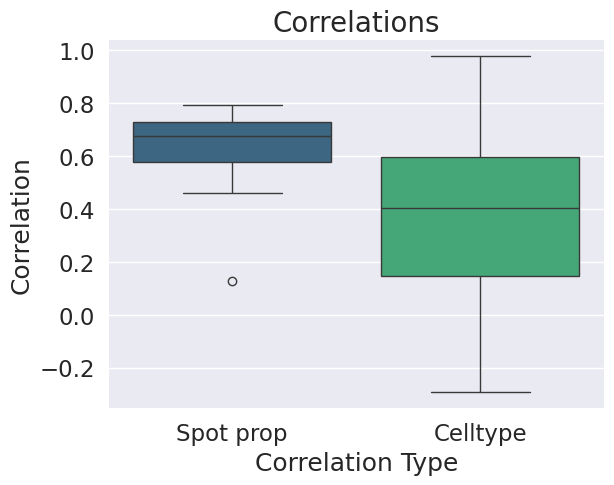

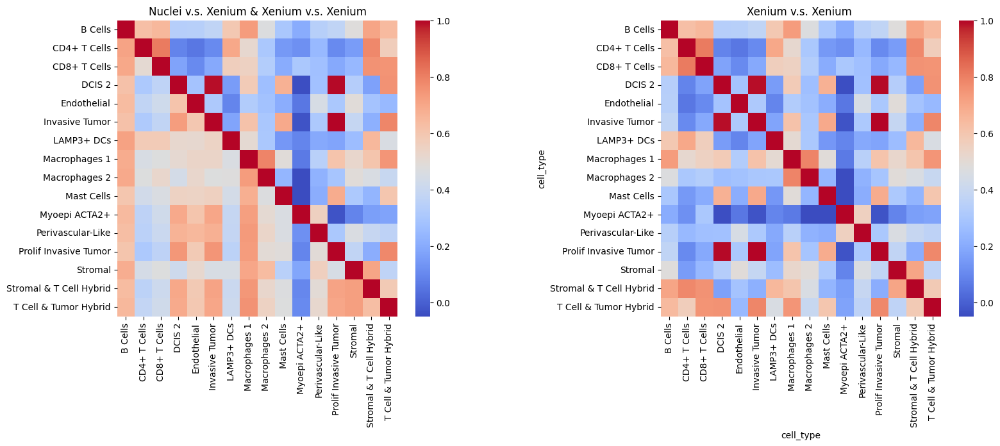

In [36]:
xenium_ave_exp_ROI3, transimp_ave_exp_ROI3 = select_common_rows_cols(xenium_mat_ROI3_exp, st_crop_TransImp_ROI3_exp)
transimp_ave_exp_ROI3_cor = plot_correlation_boxplot(xenium_ave_exp_ROI3, transimp_ave_exp_ROI3)
plot_heatmaps(xenium_ave_exp_ROI3, transimp_ave_exp_ROI3)

/tmp/ipykernel_2743596/2487520240.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=sorted_correlations.index, y=sorted_correlations.values, palette=colors)


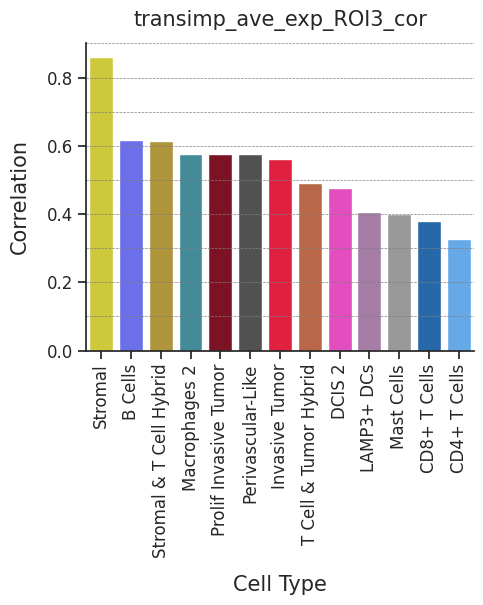

In [259]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# title='transimp_ave_exp_ROI3_cor' 
# plot_correlation_barplot(transimp_ave_exp_ROI3_cor, ctype_hex_map_xenium, title, output_file=str(title)+'.pdf')

### ROI4

In [37]:
xenium_mat_ROI4_clty = pd.DataFrame(xenium_mat_ROI4.X.A, columns=xenium_mat_ROI4.var_names)
xenium_mat_ROI4_clty['cell_type'] = xenium_mat_ROI4.obs['cell_type'].values

## group cell_type and get gene average expression
xenium_mat_ROI4_ave_exp = xenium_mat_ROI4_clty.groupby('cell_type').mean()
xenium_mat_ROI4_exp = pd.DataFrame(xenium_mat_ROI4_ave_exp.values, index=xenium_mat_ROI4_ave_exp.index, columns=xenium_mat_ROI4_ave_exp.columns)
print(xenium_mat_ROI4_exp.shape)

(17, 313)


/tmp/ipykernel_1931729/1671107620.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  xenium_mat_ROI4_ave_exp = xenium_mat_ROI4_clty.groupby('cell_type').mean()


In [38]:
!pwd

/mnt/lingyu/nfs_share2/Python/FineST/FineST_demo/BRCAhuman_data/ROIData


In [39]:
st_crop_TransImp_ROI4_clty = pd.DataFrame(st_crop_TransImp_ROI4.X, columns=st_crop_TransImp_ROI4.var_names)
st_crop_TransImp_ROI4_clty['cell_type'] = st_crop_TransImp_ROI4.obs['cell_type'].values

## group cell_type and get gene average expression
st_crop_TransImp_ROI4_ave_exp = st_crop_TransImp_ROI4_clty.groupby('cell_type').mean()
st_crop_TransImp_ROI4_exp = pd.DataFrame(st_crop_TransImp_ROI4_ave_exp.values, index=st_crop_TransImp_ROI4_ave_exp.index, columns=st_crop_TransImp_ROI4_ave_exp.columns)
print(st_crop_TransImp_ROI4_exp.shape)

(17, 863)


/tmp/ipykernel_1931729/616933513.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  st_crop_TransImp_ROI4_ave_exp = st_crop_TransImp_ROI4_clty.groupby('cell_type').mean()


(15,) (61,)
(15, 61)
(15, 61)


/tmp/ipykernel_1931729/2487520240.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")


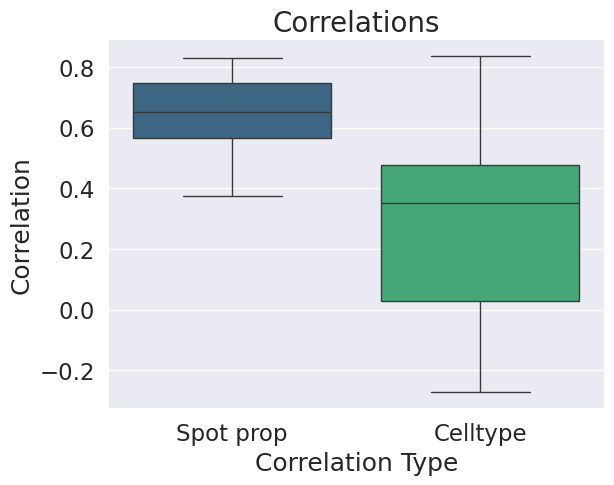

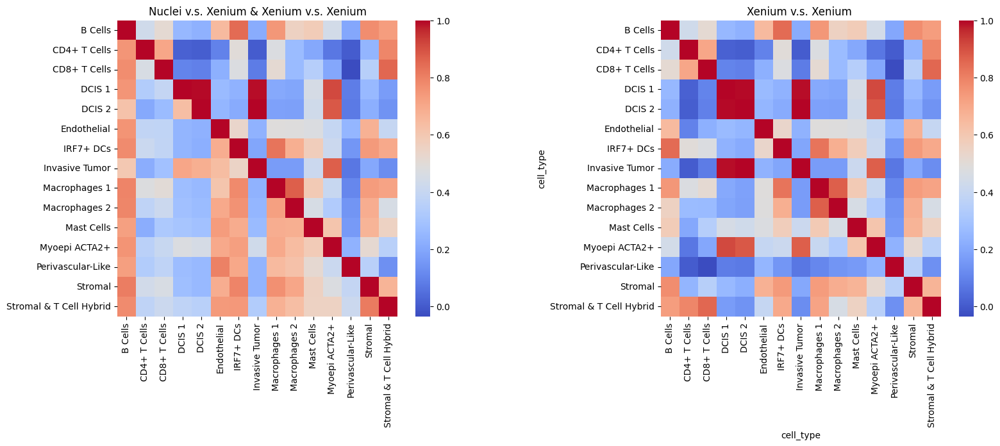

In [40]:
xenium_ave_exp_ROI4, transimp_ave_exp_ROI4 = select_common_rows_cols(xenium_mat_ROI4_exp, st_crop_TransImp_ROI4_exp)
transimp_ave_exp_ROI4_cor = plot_correlation_boxplot(xenium_ave_exp_ROI4, transimp_ave_exp_ROI4)
plot_heatmaps(xenium_ave_exp_ROI4, transimp_ave_exp_ROI4)

/tmp/ipykernel_2743596/2487520240.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=sorted_correlations.index, y=sorted_correlations.values, palette=colors)


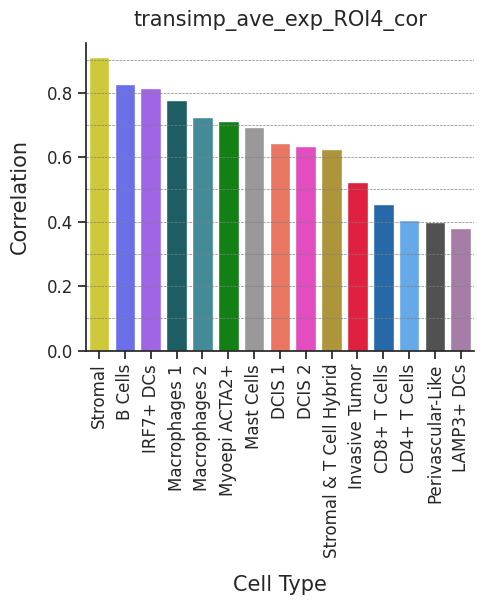

In [258]:
# os.chdir(str(path)+'SpatialData/Data/resultsROIs/')
# title='transimp_ave_exp_ROI4_cor' 
# plot_correlation_barplot(transimp_ave_exp_ROI4_cor, ctype_hex_map_xenium, title, output_file=str(title)+'.pdf')

## Pseudo-visium matrix: Slide correlation

###  Visium spot interpolation of Visium spot data：cell2loc
-process using the paper deconv. results, like 'Ground truth: Visium' in https://localhost:8888/notebooks/SpatialScope/Nuclei_Segmentation_ROIcompare.ipynb#ROI%EF%BC%9ADCIS-2

-conda activate xenium-publication-env

-pip install openpyxl

In [21]:
import os
os.chdir(str(path)+'SpatialData/Data/')

st_adata = sc.read_h5ad("visium_annotated_cell2l_scFFPE.h5ad")
st_adata

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [22]:
#########################################
# paper deconv.: 2889 obs, 19 cell types
#########################################
celltypp_gt = pd.read_excel(str(path)+'NPC/Data/stdata/Annodata/41467_2023_43458_MOESM4_ESM.xlsx', sheet_name='Sup. Fig. 10 Visium Deconv.', index_col=0) 
# celltypp_gt

missing_elements = [x for x in st_adata.obs_names if x not in celltypp_gt.index]
missing_data = pd.DataFrame(0, index=missing_elements, columns=celltypp_gt.columns)
celltypp_gt = pd.concat([celltypp_gt, missing_data]).loc[st_adata.obs_names]
celltypp_gt.columns = celltypp_gt.columns.str.replace('_', ' ')
# celltypp_gt

## update .obs['cell_type'] and .obsm['q05_cell_abundance_w_sf'] using paper deconv. results
clust_labels = np.array(celltypp_gt.columns)
st_adata.obs[clust_labels]=celltypp_gt
st_adata.obsm['q05_cell_abundance_w_sf'] = celltypp_gt
# st_adata.obs[clust_labels]

## directly save the cell2location result
st_adata.obs['cell_type'] = st_adata.obs[clust_labels].idxmax(axis=1)
print(st_adata)

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'


###  Visium spot interpolation of Nuclei cell data：cell2loc

In [101]:
import os
os.chdir(str(path)+'SpatialData/Data/')

import scanpy as sc
st_adata = sc.read_h5ad("visium_nuclei_annotated_cell2l_scFFPE.h5ad")

## directly save the cell2location result
clust_labels = ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid']
st_adata.obs['cell_type'] = st_adata.obs[clust_labels].idxmax(axis=1)

print(st_adata)

AnnData object with n_obs × n_vars = 56794 × 643
    obs: 'x', 'y', 'CD70', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid', 'cell_type'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'


In [102]:
print(st_adata.obs['x'].min(), st_adata.obs['x'].max())
print(st_adata.obs['y'].min(), st_adata.obs['y'].max())

3621.0 15425.0
4487.0 16917.0


In [103]:
# 计算x和y的变换参数
x_min, x_max = st_adata.obs['x'].min(), st_adata.obs['x'].max()
y_min, y_max = st_adata.obs['y'].min(), st_adata.obs['y'].max()
x_range = x_max - x_min
y_range = y_max - y_min

x_centroid_min, x_centroid_max = xenium_cell_info['x_centroid'].min(), xenium_cell_info['x_centroid'].max()
y_centroid_min, y_centroid_max = xenium_cell_info['y_centroid'].min(), xenium_cell_info['y_centroid'].max()
x_centroid_range = x_centroid_max - x_centroid_min
y_centroid_range = y_centroid_max - y_centroid_min

# 应用线性变换
st_adata.obs['x_scale'] = ((st_adata.obs['x'] - x_min) / x_range) * x_centroid_range + x_centroid_min
st_adata.obs['y_scale'] = ((st_adata.obs['y'] - y_min) / y_range) * y_centroid_range + y_centroid_min

In [104]:
unassigned_cell_mask

array([ True,  True,  True, ..., False, False, False])

In [105]:
pd.DataFrame(st_adata.obs['cell_type'])

,cell_type
0,Invasive Tumor
1,Prolif Invasive Tumor
2,Stromal
3,Stromal
4,Stromal
...,...
56789,Prolif Invasive Tumor
56790,Stromal
56791,Prolif Invasive Tumor
56792,Prolif Invasive Tumor


In [106]:
visium_spot_centroids=visium_tissue_positions[ ["pxl_col_in_fullres", "pxl_row_in_fullres"] ].values    # (4992, 2)   
visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"]
visium_barcodes=visium_tissue_positions.index.values
xenium_coords=st_adata.obs[['x_scale','y_scale']].values
xenium_to_visium_transform=xenium_to_visium_full_res_transformation

In [107]:
print(visium_scale_factors["spot_diameter_fullres"])
print(visium_spot_centroids.min(), visium_spot_centroids.max())
print(visium_spot_centroids.max()/visium_scale_factors["spot_diameter_fullres"] )

print(xenium_cell_info[["x_centroid", "y_centroid"]].values.min(), xenium_cell_info[["x_centroid", "y_centroid"]].values.max())
print(st_adata.obs[['x_scale','y_scale']].values.min(), st_adata.obs[['x_scale','y_scale']].values.max())

127.8358082731091
3676 16873
131.98962190587815
1.3671555936336517 7523.086865234375
1.3671555936336517 7523.086865234375


In [108]:
unassigned_cell_mask.shape

(167780,)

In [109]:
## Get cell -> Visium barcode assignments.
xenium_spotbinned_cell_barcodes = bin_xenium_data_to_visium_spots(visium_spot_centroids,visium_spot_diameter,
                                                                  visium_barcodes,xenium_coords,xenium_to_visium_transform)

## Filter cells outside of Visium capture area.
unassigned_cell_mask = (
    xenium_spotbinned_cell_barcodes != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generate a spot X cell type dataframe.
nuclei_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=xenium_spotbinned_cell_barcodes[unassigned_cell_mask],
    feature_names=pd.DataFrame(st_adata.obs['cell_type'])[unassigned_cell_mask]["cell_type"].values
    )
nuclei_spotbinned_celltypes_df = nuclei_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
nuclei_spotbinned_celltypes_normed_df = nuclei_spotbinned_celltypes_df.div(
    nuclei_spotbinned_celltypes_df.sum(1), axis=0
)

In [110]:
nuclei_spotbinned_cell_adata

AnnData object with n_obs × n_vars = 2762 × 17

In [111]:
nuclei_spotbinned_celltypes_normed_df

,DCIS 2,Endothelial,Myoepi ACTA2+,CD4+ T Cells,DCIS 1,Stromal,LAMP3+ DCs,Macrophages 2,Mast Cells,Myoepi KRT15+,Stromal & T Cell Hybrid,CD8+ T Cells,Prolif Invasive Tumor,Perivascular-Like,Macrophages 1,Invasive Tumor,B Cells
CGTGTTAACCTGAAGC-1,0.000000,0.0,0.0,0.0,0.000000,0.974359,0.0,0.0,0.0,0.0,0.0,0.000000,0.025641,0.0,0.0,0.0,0.0
TGCGATGCAGGTGCGA-1,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
TGGAGTCGGCAAGCTC-1,0.000000,0.0,0.0,0.0,0.000000,0.454545,0.0,0.0,0.0,0.0,0.0,0.000000,0.545455,0.0,0.0,0.0,0.0
TCATCCATGCCAAGCG-1,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
GTAGGAGCAACAGGCA-1,0.000000,0.0,0.0,0.0,0.000000,0.870968,0.0,0.0,0.0,0.0,0.0,0.064516,0.064516,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAATGACAACTAGTCA-1,0.000000,0.0,0.0,0.0,0.000000,0.950000,0.0,0.0,0.0,0.0,0.0,0.000000,0.050000,0.0,0.0,0.0,0.0
GGCGGAGTTGAACTAT-1,0.000000,0.0,0.0,0.0,0.000000,0.875000,0.0,0.0,0.0,0.0,0.0,0.000000,0.125000,0.0,0.0,0.0,0.0
CGACTTCGCAAGCGGT-1,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0
GTCGTAGACTGACAAG-1,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0


In [63]:
!pwd

/mnt/lingyu/nfs_share2/Python/SpatialData/Data


In [64]:
## save nuclei_scFFPE results
# nuclei_spotbinned_celltypes_normed_df.to_csv('spot_celltype_nuclei.csv')

###  Visium spot interpolation of Nuclei cell data：TransImp

In [41]:
def bin_nuclei_data_to_visium_spots(
    visium_spot_centroids: np.ndarray[np.float32, (None, 2)],
    visium_spot_diameter: float,
    visium_barcodes: np.ndarray[str, (None, 2)],
    nuclei_coords: np.ndarray[np.float32, (None, 2)],
) -> np.ndarray[str]:
    """
    Assigns xenium coordinates to visium spots using a transform into the visium coordinate system.
    Coordinates are assigned by nearest neighbor.
    e.g. each Xenium transcript/cell etc is assigned to the closest Visium barcode after transformation.
    Also filters coordinates that lie outside an estimated capture area.
    """
    kdtree = KDTree(visium_spot_centroids)
    _, neighbors = kdtree.query(nuclei_coords, k=1)
    barcode_assignments = visium_barcodes[neighbors]

    visium_capture_polygon_full_res = get_visium_capture_polygon(
        spot_centroids=visium_spot_centroids, spot_diameter=visium_spot_diameter
    )
    barcode_assignments[
        ~points_in_poly(nuclei_coords, visium_capture_polygon_full_res)
    ] = __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
    return barcode_assignments

In [24]:
import os
os.chdir(str(path)+'SpatialData/Data/')

st_adata = sc.read_h5ad("visium_annotated_cell2l_scFFPE.h5ad")
st_adata

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [25]:
st_adata.obs_names

Index(['AACACCTACTATCGAA-1', 'AACACGTGCATCGCAC-1', 'AACACTTGGCAAGGAA-1',
       'AACAGGAAGAGCATAG-1', 'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1',
       'AACAGGTTATTGCACC-1', 'AACAGGTTCACCGAAG-1', 'AACAGTCAGGCTCCGC-1',
       'AACAGTCCACGCGGTG-1',
       ...
       'TGTTCGCAACCGCCAA-1', 'TGTTCGTGACCAGTAG-1', 'TGTTCTGCTCTGTCGT-1',
       'TGTTGCGTCCAAGATT-1', 'TGTTGGAACCTTCCGC-1', 'TGTTGGAACGAGGTCA-1',
       'TGTTGGAAGCTCGGTA-1', 'TGTTGGATGGACTTCT-1', 'TGTTGGCCAGACCTAC-1',
       'TGTTGGCCTACACGTG-1'],
      dtype='object', length=4992)

In [26]:
import os
os.chdir(str(path)+'SpatialData/Data/')

import scanpy as sc
TransImp_adata = sc.read_h5ad("visium_nuclei_annotated_TransImp_scFFPE.h5ad")
print(TransImp_adata)

AnnData object with n_obs × n_vars = 56794 × 863
    obs: 'x', 'y', 'CD70', 'cell_type'
    uns: 'cell_type_colors', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


In [27]:
## Get nuclei -> Visium barcode assignments.
nuclei_spotbinned_cell_barcodes = bin_nuclei_data_to_visium_spots(
    visium_spot_centroids=st_adata.obsm['spatial'],
    # visium_spot_centroids=npc1_spot.obs[['pixel_x','pixel_y']].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    nuclei_coords=TransImp_adata.obs[['x','y']].values,
)

print(nuclei_spotbinned_cell_barcodes)
print(len(nuclei_spotbinned_cell_barcodes))

['AAGTTAAGCACTATAA-1' 'TCCTATTGACTGTTGA-1' 'TGCGTATCTTGTACCG-1' ...
 'AAGGCCAGTCGCAATT-1' 'AAGTTAAGCACTATAA-1' 'AACTTCATCTTCTGGT-1']
56794


In [28]:
## Filter cells outside of Visium capture area.
unassigned_cell_mask = (nuclei_spotbinned_cell_barcodes != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__)
print(unassigned_cell_mask)
print(len(unassigned_cell_mask))

## Generate a spot X cell type dataframe.
## input: -nuclei_celltype_df
nuclei_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=nuclei_spotbinned_cell_barcodes[unassigned_cell_mask],
    feature_names=pd.DataFrame(TransImp_adata.obs['cell_type'])[unassigned_cell_mask]["cell_type"].values,
    # feature_names=nuclei_celltype_df[unassigned_cell_mask]["Cluster"].values,
)
nuclei_spotbinned_celltypes_df = nuclei_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
nuclei_spotbinned_celltypes_normed_df = nuclei_spotbinned_celltypes_df.div(
    nuclei_spotbinned_celltypes_df.sum(1), axis=0
)

nuclei_spotbinned_celltypes_normed_df

[ True  True  True ...  True  True  True]
56794


,Invasive Tumor,B Cells,CD4+ T Cells,Mast Cells,CD8+ T Cells,Stromal,DCIS 1,Myoepi ACTA2+,LAMP3+ DCs,Myoepi KRT15+,Macrophages 2,Macrophages 1,Endothelial,Prolif Invasive Tumor,T Cell & Tumor Hybrid,Perivascular-Like,IRF7+ DCs,Stromal & T Cell Hybrid,DCIS 2
AGGAGCATAATCCACT-1,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,1.0
TGTCTTGCGACTAATT-1,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,1.000000,0.0
CGGTAGGTACTCTACG-1,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.5,0.0,0.0,0.0,0.5,0.000000,0.0,0.0,0.000000,0.0
CCACAACCAGCAGGTG-1,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
GGTGCGTGGAGTTGGT-1,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AAGGCCGACCTACCTG-1,0.0,0.0,0.0,0.0,0.0,0.800000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.200000,0.0,0.0,0.000000,0.0
TGCAGAACTATCAACT-1,0.0,0.0,0.0,0.0,0.0,0.000000,0.714286,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.142857,0.0,0.0,0.142857,0.0
AGGTGGCACTTGTCAG-1,0.0,0.0,0.0,0.0,0.0,0.833333,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.000000,0.0
GTAATCTTGTCTAGTT-1,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0


In [29]:
## inter 'xenium_spotbinned_cell_adata' and 'xenium_spotbinned_transcript_adata' to 'xenium_spotbinned_adata'
nuclei_spotbinned_adata = st_adata[nuclei_spotbinned_cell_adata.obs_names]
nuclei_spotbinned_adata.obsm['cell_type_TransImp'] = nuclei_spotbinned_celltypes_normed_df
nuclei_spotbinned_adata

/tmp/ipykernel_3078900/3328910086.py:3: ImplicitModificationWarning: Setting element `.obsm['cell_type_TransImp']` of view, initializing view as actual.
  nuclei_spotbinned_adata.obsm['cell_type_TransImp'] = nuclei_spotbinned_celltypes_normed_df


AnnData object with n_obs × n_vars = 3493 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf', 'cell_type_TransImp'

In [ ]:
## save adata
# nuclei_spotbinned_adata.write(str(path)+'SpatialData/Data/nuclei_spotbinned_adata_TransImp.h5ad')

### old

In [24]:
import os
os.chdir(str(path)+'SpatialData/Data/')

import scanpy as sc
st_adata = sc.read_h5ad("visium_nuclei_annotated_TransImp_scFFPE.h5ad")
print(st_adata)

AnnData object with n_obs × n_vars = 56794 × 863
    obs: 'x', 'y', 'CD70', 'cell_type'
    uns: 'cell_type_colors', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


In [25]:
print(st_adata.obs['x'].min(), st_adata.obs['x'].max())
print(st_adata.obs['y'].min(), st_adata.obs['y'].max())

3621.0 15425.0
4487.0 16917.0


In [26]:
# 计算x和y的变换参数
x_min, x_max = st_adata.obs['x'].min(), st_adata.obs['x'].max()
y_min, y_max = st_adata.obs['y'].min(), st_adata.obs['y'].max()
x_range = x_max - x_min
y_range = y_max - y_min

x_centroid_min, x_centroid_max = xenium_cell_info['x_centroid'].min(), xenium_cell_info['x_centroid'].max()
y_centroid_min, y_centroid_max = xenium_cell_info['y_centroid'].min(), xenium_cell_info['y_centroid'].max()
x_centroid_range = x_centroid_max - x_centroid_min
y_centroid_range = y_centroid_max - y_centroid_min

# 应用线性变换
st_adata.obs['x_scale'] = ((st_adata.obs['x'] - x_min) / x_range) * x_centroid_range + x_centroid_min
st_adata.obs['y_scale'] = ((st_adata.obs['y'] - y_min) / y_range) * y_centroid_range + y_centroid_min

In [27]:
unassigned_cell_mask

array([ True,  True,  True, ..., False, False, False])

In [28]:
pd.DataFrame(st_adata.obs['cell_type'])

,cell_type
0,T Cell & Tumor Hybrid
1,Prolif Invasive Tumor
2,Prolif Invasive Tumor
3,Stromal & T Cell Hybrid
4,T Cell & Tumor Hybrid
...,...
56789,Prolif Invasive Tumor
56790,Perivascular-Like
56791,Prolif Invasive Tumor
56792,Prolif Invasive Tumor


In [29]:
visium_spot_centroids=visium_tissue_positions[ ["pxl_col_in_fullres", "pxl_row_in_fullres"] ].values    # (4992, 2)   
visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"]
visium_barcodes=visium_tissue_positions.index.values
xenium_coords=st_adata.obs[['x_scale','y_scale']].values
xenium_to_visium_transform=xenium_to_visium_full_res_transformation

In [30]:
print(visium_scale_factors["spot_diameter_fullres"])
print(visium_spot_centroids.min(), visium_spot_centroids.max())
print(visium_spot_centroids.max()/visium_scale_factors["spot_diameter_fullres"] )

print(xenium_cell_info[["x_centroid", "y_centroid"]].values.min(), xenium_cell_info[["x_centroid", "y_centroid"]].values.max())
print(st_adata.obs[['x_scale','y_scale']].values.min(), st_adata.obs[['x_scale','y_scale']].values.max())

127.8358082731091
3676 16873
131.98962190587815
1.3671555936336517 7523.086865234375
1.3671555936336517 7523.086865234375


In [31]:
unassigned_cell_mask.shape

(167780,)

In [32]:
## Get cell -> Visium barcode assignments.
xenium_spotbinned_cell_barcodes = bin_xenium_data_to_visium_spots(visium_spot_centroids,visium_spot_diameter,
                                                                  visium_barcodes,xenium_coords,xenium_to_visium_transform)

## Filter cells outside of Visium capture area.
unassigned_cell_mask = (
    xenium_spotbinned_cell_barcodes != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
)

## Generate a spot X cell type dataframe.
nuclei_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=xenium_spotbinned_cell_barcodes[unassigned_cell_mask],
    feature_names=pd.DataFrame(st_adata.obs['cell_type'])[unassigned_cell_mask]["cell_type"].values
    )
nuclei_spotbinned_celltypes_df = nuclei_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
nuclei_spotbinned_celltypes_normed_df = nuclei_spotbinned_celltypes_df.div(
    nuclei_spotbinned_celltypes_df.sum(1), axis=0
)

In [33]:
nuclei_spotbinned_cell_adata

AnnData object with n_obs × n_vars = 2762 × 19

In [34]:
nuclei_spotbinned_celltypes_normed_df

,CD8+ T Cells,Myoepi KRT15+,Perivascular-Like,Endothelial,Macrophages 2,Prolif Invasive Tumor,Macrophages 1,LAMP3+ DCs,B Cells,Stromal,Invasive Tumor,CD4+ T Cells,T Cell & Tumor Hybrid,Myoepi ACTA2+,DCIS 2,Mast Cells,IRF7+ DCs,Stromal & T Cell Hybrid,DCIS 1
TCCAACTGAATAAGGT-1,0.076923,0.0000,0.0,0.0,0.0,0.000000,0.057692,0.019231,0.0,0.153846,0.0,0.0,0.038462,0.000000,0.000000,0.0,0.0,0.653846,0.0000
TGTCACTCCGTCAAGT-1,0.000000,0.0000,0.0,0.0,0.0,0.133333,0.000000,0.000000,0.0,0.133333,0.0,0.0,0.400000,0.000000,0.266667,0.0,0.0,0.066667,0.0000
TCGGTATCTAGTATAC-1,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,1.000000,0.0000
AGGATATCGCGAATAC-1,0.000000,0.0625,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.500000,0.0,0.0,0.375000,0.000000,0.000000,0.0,0.0,0.000000,0.0625
ACTGTACAATTCTACT-1,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,1.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AACCTGACAGTGCCGC-1,0.000000,0.0000,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0000
ACAGGAACTACAGAAC-1,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.142857,0.714286,0.000000,0.0,0.0,0.142857,0.0000
TCGCCTGACGGCCACT-1,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.250000,0.0,0.0,0.000000,0.250000,0.250000,0.0,0.0,0.250000,0.0000
CTGGTGCGAGAAGCTT-1,0.000000,0.0000,0.0,0.0,0.0,0.409091,0.000000,0.000000,0.0,0.000000,0.5,0.0,0.045455,0.000000,0.000000,0.0,0.0,0.045455,0.0000


In [35]:
!pwd

/mnt/lingyu/nfs_share2/Python/SpatialData/Data


### Compare xenuim and nuclei: Paper deconv.

In [37]:
cell_type_gt_order = ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2',
       'Endothelial', 'Invasive Tumor', 'IRF7+ DCs', 'LAMP3+ DCs',
       'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+',
       'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor',
       'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid']
len(cell_type_gt_order)

19

In [36]:
import os
import pandas as pd
import numpy as np
import scanpy as sc

xenium_gt_adata = sc.read_h5ad(str(path)+'Xenium/xenium-publication/xenium_spotbinned_adata.h5ad')
xenium_spotbinned_celltypes_normed_df = xenium_gt_adata.obsm['cell_type_gt'][cell_type_gt_order]


st_adata = sc.read_h5ad(str(path)+'SpatialData/Data/visium_annotated_cell2l_scFFPE.h5ad')
#########################################
# paper deconv.: 2889 obs, 19 cell types
#########################################
celltypp_gt = pd.read_excel(str(path)+'NPC/Data/stdata/Annodata/41467_2023_43458_MOESM4_ESM.xlsx', sheet_name='Sup. Fig. 10 Visium Deconv.', index_col=0) 
# celltypp_gt

missing_elements = [x for x in st_adata.obs_names if x not in celltypp_gt.index]
missing_data = pd.DataFrame(0, index=missing_elements, columns=celltypp_gt.columns)
celltypp_gt = pd.concat([celltypp_gt, missing_data]).loc[st_adata.obs_names]
celltypp_gt.columns = celltypp_gt.columns.str.replace('_', ' ')
# celltypp_gt

## update .obs['cell_type'] and .obsm['q05_cell_abundance_w_sf'] using paper deconv. results
clust_labels = np.array(celltypp_gt.columns)
st_adata.obs[clust_labels]=celltypp_gt
st_adata.obsm['q05_cell_abundance_w_sf'] = celltypp_gt
# st_adata.obs[clust_labels]

## directly save the cell2location result
st_adata.obs['cell_type'] = st_adata.obs[clust_labels].idxmax(axis=1)
print(st_adata)

nuclei_spotbinned_celltypes_normed_df = st_adata.obsm['q05_cell_abundance_w_sf'][cell_type_gt_order]

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'


In [38]:
print(xenium_spotbinned_celltypes_normed_df.shape, nuclei_spotbinned_celltypes_normed_df.shape)

(3958, 19) (4992, 19)


In [39]:
xenium_spotbinned_celltypes_normed_df

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
CGTGTTAACCTGAAGC-1,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.000000,0.000,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000
TGCGATGCAGGTGCGA-1,0.000000,0.111111,0.111111,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.000000,0.000,0.0,0.000000,0.0,0.000000,0.000000,0.666667,0.000000,0.000000
TAGGCTCCGGCATACA-1,0.000000,0.000000,0.000000,0.0,0.000000,0.063492,0.746032,0.000,0.0,0.031746,0.000,0.0,0.000000,0.0,0.015873,0.031746,0.063492,0.000000,0.031746
GCCTTGGCGAACAATC-1,0.062500,0.062500,0.000000,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.062500,0.125,0.0,0.000000,0.0,0.000000,0.000000,0.687500,0.000000,0.000000
AACTTGGTTAATACTA-1,0.000000,0.000000,0.000000,0.0,0.000000,0.050000,0.775000,0.025,0.0,0.050000,0.000,0.0,0.000000,0.0,0.000000,0.025000,0.075000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTTACGGTAAGCCGAA-1,0.000000,0.023256,0.046512,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.162791,0.000,0.0,0.000000,0.0,0.000000,0.000000,0.744186,0.023256,0.000000
CTGTCACTATGTGCAT-1,0.017241,0.000000,0.000000,0.0,0.327586,0.034483,0.000000,0.000,0.0,0.034483,0.000,0.0,0.172414,0.0,0.000000,0.000000,0.396552,0.017241,0.000000
AACGACATTAAGATGG-1,0.031746,0.015873,0.015873,0.0,0.000000,0.158730,0.428571,0.000,0.0,0.079365,0.000,0.0,0.015873,0.0,0.000000,0.031746,0.158730,0.000000,0.015873
GATGCCACATTATCAC-1,0.000000,0.000000,0.048780,0.0,0.000000,0.195122,0.365854,0.000,0.0,0.097561,0.000,0.0,0.000000,0.0,0.000000,0.073171,0.195122,0.000000,0.000000


In [40]:
nuclei_spotbinned_celltypes_normed_df

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
AACACCTACTATCGAA-1,0.000926,0.000033,0.002080,0.000022,0.000022,0.149962,0.000033,0.008040,0.000022,0.000022,0.073790,0.018029,0.000022,0.002695,0.001447,0.000022,0.742833,0.000022,0.000022
AACACGTGCATCGCAC-1,0.024426,0.030168,0.030168,0.015528,0.000032,0.055793,0.000048,0.011127,0.000032,0.000036,0.096797,0.013958,0.007596,0.007169,0.000054,0.000032,0.707036,0.120512,0.000032
AACACTTGGCAAGGAA-1,0.000030,0.000044,0.019155,0.000030,0.036227,0.138459,0.000044,0.003533,0.003211,0.076897,0.000030,0.000030,0.307695,0.098795,0.029461,0.000030,0.286332,0.000030,0.000030
AACAGGAAGAGCATAG-1,0.006845,0.040909,0.066741,0.006429,0.001744,0.120076,0.000047,0.023946,0.015337,0.103275,0.051200,0.011226,0.064571,0.000082,0.028690,0.000031,0.458849,0.148034,0.000031
AACAGGATTCATAGTT-1,0.000021,0.000031,0.000031,0.000055,0.027452,0.108853,0.000037,0.005453,0.005365,0.000185,0.056443,0.004307,0.001378,0.000025,0.000032,0.066085,0.724246,0.000021,0.000021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,0.000044,0.000066,0.000066,0.000044,0.000044,0.171849,0.000066,0.001437,0.000845,0.000044,0.177899,0.011710,0.000044,0.000044,0.000087,0.000044,0.635666,0.000044,0.000044
TGTTGGAAGCTCGGTA-1,0.027047,0.084946,0.112311,0.000030,0.051792,0.123063,0.000046,0.013125,0.016749,0.234279,0.000030,0.000030,0.036681,0.003134,0.053497,0.000030,0.243209,0.230388,0.000030
TGTTGGATGGACTTCT-1,0.000022,0.020490,0.013706,0.000022,0.000033,0.026385,0.434853,0.000022,0.004998,0.094365,0.004730,0.000022,0.000022,0.002567,0.012692,0.295202,0.089869,0.000022,0.000022
TGTTGGCCAGACCTAC-1,0.011097,0.059529,0.025589,0.000031,0.000031,0.011668,0.000046,0.007350,0.002276,0.110795,0.010246,0.002257,0.004746,0.021189,0.000035,0.000031,0.733085,0.060006,0.000031


In [41]:
common_rows = xenium_spotbinned_celltypes_normed_df.index.intersection(nuclei_spotbinned_celltypes_normed_df.index)
common_columns = xenium_spotbinned_celltypes_normed_df.columns.intersection(nuclei_spotbinned_celltypes_normed_df.columns)
print(common_rows.shape, common_columns.shape)

xenium_spotbinned_celltypes_nuclei = xenium_spotbinned_celltypes_normed_df.loc[common_rows, common_columns]
xenium_spotbinned_celltypes_nuclei = xenium_spotbinned_celltypes_nuclei.reindex(index = nuclei_spotbinned_celltypes_normed_df.index, 
                                                                                columns = nuclei_spotbinned_celltypes_normed_df.columns)
print(xenium_spotbinned_celltypes_nuclei.shape)

(3958,) (19,)
(4992, 19)


In [42]:
xenium_spotbinned_celltypes_nuclei

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
AACACCTACTATCGAA-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AACACGTGCATCGCAC-1,0.071429,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.071429,0.0,0.00000,0.0,0.000000,0.000000,0.857143,0.000000,0.0
AACACTTGGCAAGGAA-1,0.000000,0.020833,0.083333,0.0,0.104167,0.020833,0.000000,0.000000,0.0,0.145833,0.000000,0.0,0.18750,0.0,0.000000,0.000000,0.395833,0.020833,0.0
AACAGGAAGAGCATAG-1,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.800000,0.000000,0.0
AACAGGATTCATAGTT-1,0.000000,0.000000,0.111111,0.0,0.000000,0.222222,0.000000,0.111111,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.555556,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.125000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.875000,0.000000,0.0
TGTTGGAAGCTCGGTA-1,0.035714,0.119048,0.297619,0.0,0.023810,0.035714,0.000000,0.000000,0.0,0.154762,0.011905,0.0,0.02381,0.0,0.000000,0.000000,0.238095,0.000000,0.0
TGTTGGATGGACTTCT-1,0.000000,0.000000,0.035088,0.0,0.000000,0.052632,0.666667,0.000000,0.0,0.052632,0.000000,0.0,0.00000,0.0,0.017544,0.052632,0.087719,0.000000,0.0
TGTTGGCCAGACCTAC-1,0.000000,0.000000,0.090909,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.909091,0.000000,0.0


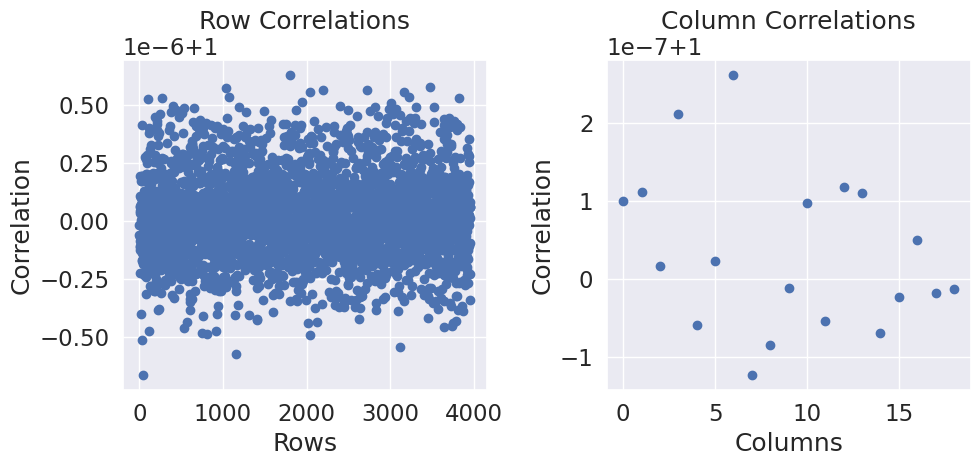

In [43]:
## Plotting imports
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize, to_hex, Colormap
from matplotlib.cm import ScalarMappable

# Compute row and column correlations
row_correlations = xenium_spotbinned_celltypes_nuclei.corrwith(xenium_spotbinned_celltypes_normed_df, axis=1)
column_correlations = xenium_spotbinned_celltypes_nuclei.T.corrwith(xenium_spotbinned_celltypes_normed_df.T, axis=1)

# Create subplots
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plot row correlations
ax[0].scatter(range(len(row_correlations)), row_correlations)
ax[0].set_title('Row Correlations')
ax[0].set_xlabel('Rows')
ax[0].set_ylabel('Correlation')

# Plot column correlations
ax[1].scatter(range(len(column_correlations)), column_correlations)
ax[1].set_title('Column Correlations')
ax[1].set_xlabel('Columns')
ax[1].set_ylabel('Correlation')

# Show plot
plt.tight_layout()
plt.show()

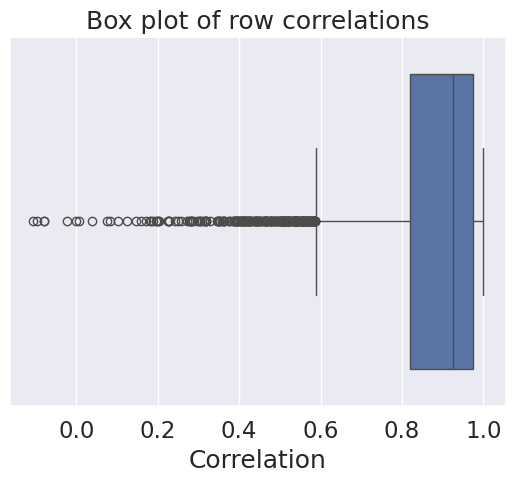

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

## Compute row correlations
row_correlations = xenium_spotbinned_celltypes_nuclei.corrwith(nuclei_spotbinned_celltypes_normed_df, axis=1)

sns.boxplot(x=row_correlations)
plt.title('Box plot of row correlations')
plt.xlabel('Correlation')
plt.show()

/tmp/ipykernel_3802000/2042513572.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")


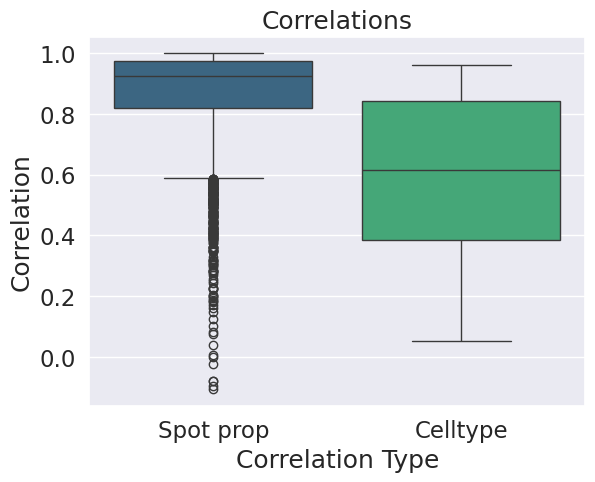

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set style and font size
# sns.set_style("whitegrid")
sns.set(font_scale=1.5)

# Compute row and column correlations
row_correlations = xenium_spotbinned_celltypes_nuclei.corrwith(nuclei_spotbinned_celltypes_normed_df, axis=1)
column_correlations = xenium_spotbinned_celltypes_nuclei.T.corrwith(nuclei_spotbinned_celltypes_normed_df.T, axis=1)

# Create a DataFrame with row and column correlations
correlations_df = pd.DataFrame({'Spot prop': row_correlations, 'Celltype': column_correlations})

# Melt the DataFrame to long format
melted_correlations_df = correlations_df.melt(var_name='Correlation Type', value_name='Correlation')

# Create a box plot of row and column correlations
sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")
plt.title('Correlations')
plt.xlabel('Correlation Type')
plt.ylabel('Correlation')

# Show the plot
plt.show()

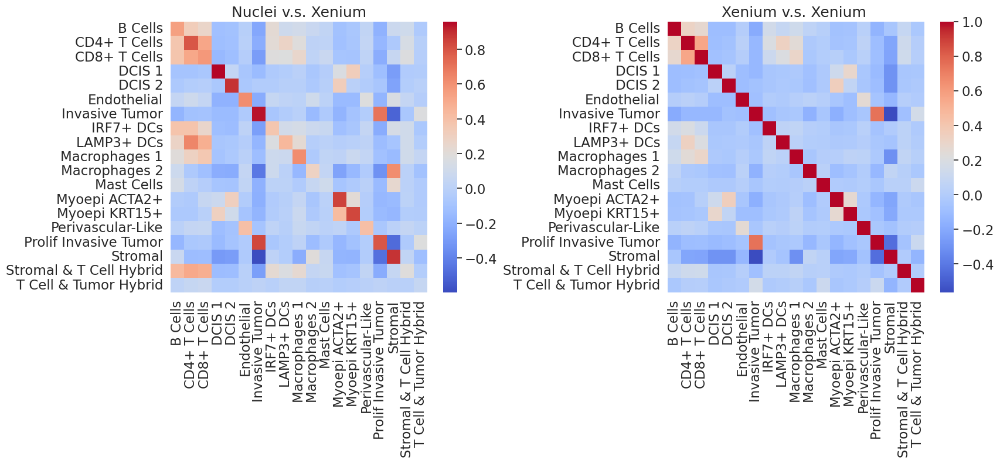

In [46]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=100)

corr_list = []
for col1 in nuclei_spotbinned_celltypes_normed_df.columns:
    temp_list = []
    for col2 in xenium_spotbinned_celltypes_nuclei.columns:
        temp_list.append(nuclei_spotbinned_celltypes_normed_df[col1].corr(xenium_spotbinned_celltypes_nuclei[col2]))
    corr_list.append(temp_list)
corr_df_deconv = pd.DataFrame(corr_list)

sns.heatmap(corr_df_deconv, annot=False, cmap='coolwarm', xticklabels=xenium_spotbinned_celltypes_nuclei.columns, 
            yticklabels=nuclei_spotbinned_celltypes_normed_df.columns, ax=axes[0])
axes[0].set_title('Nuclei v.s. Xenium')



corr_xenium = xenium_spotbinned_celltypes_nuclei.corr()
sns.heatmap(corr_xenium, annot=False, cmap='coolwarm', ax=axes[1])
axes[1].set_title('Xenium v.s. Xenium ')

plt.subplots_adjust(wspace=0.55)
plt.show()

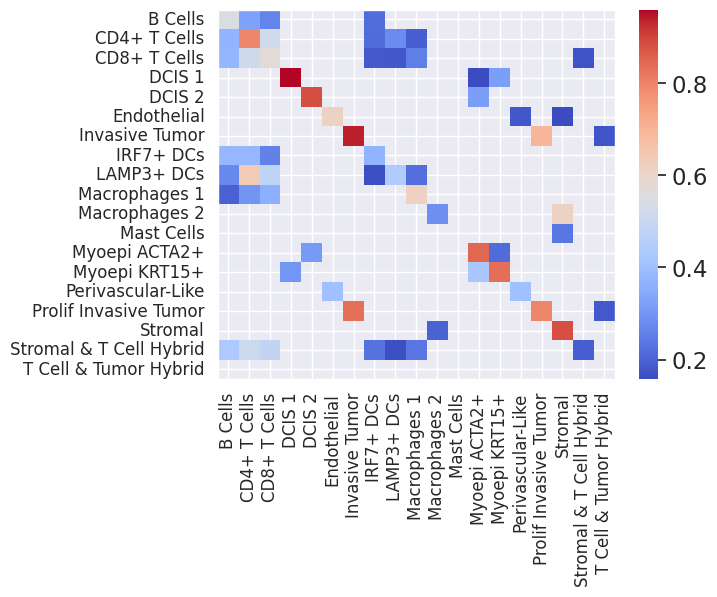

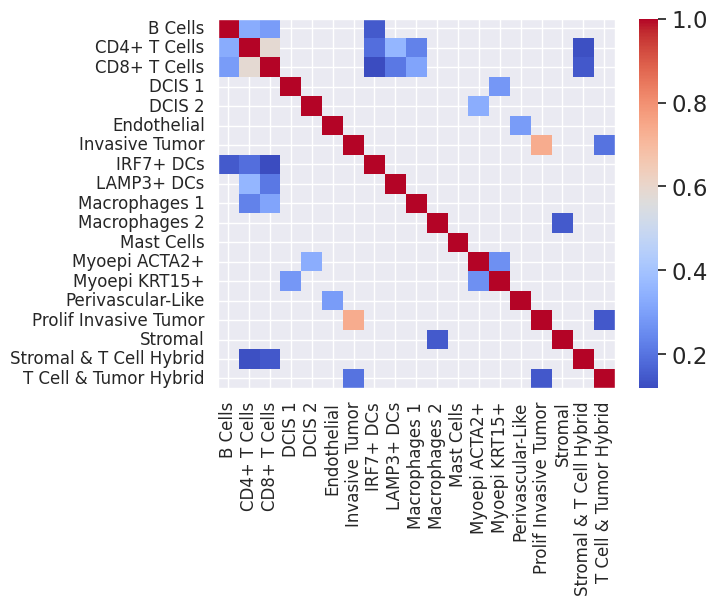

In [79]:
correlation_matrix1 = corr_df_deconv.copy()
correlation_matrix1[correlation_matrix1 < 0.15] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), 
            xticklabels=xenium_spotbinned_celltypes_nuclei.columns, 
            yticklabels=nuclei_spotbinned_celltypes_normed_df.columns, 
            ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_spot_010.pdf", dpi=300)

plt.show()


correlation_matrix1 = corr_xenium.copy()
correlation_matrix1[correlation_matrix1 < 0.118] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), 
            xticklabels=xenium_spotbinned_celltypes_nuclei.columns, 
            yticklabels=nuclei_spotbinned_celltypes_normed_df.columns, 
            ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_spot_010.pdf", dpi=300)

plt.show()

### Compare xenium and nuclei: TransImp

In [48]:
cell_type_gt_order = ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2',
       'Endothelial', 'Invasive Tumor', 'IRF7+ DCs', 'LAMP3+ DCs',
       'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+',
       'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor',
       'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid']
len(cell_type_gt_order)

19

In [49]:
import os
import scanpy as sc

xenium_gt_adata = sc.read_h5ad(str(path)+'Xenium/xenium-publication/xenium_spotbinned_adata.h5ad')
xenium_spotbinned_celltypes_normed_df = xenium_gt_adata.obsm['cell_type_gt'][cell_type_gt_order]

st_adata = sc.read_h5ad(str(path)+'SpatialData/Data/nuclei_spotbinned_adata_TransImp.h5ad')
nuclei_spotbinned_celltypes_normed_df = st_adata.obsm['cell_type_TransImp'][cell_type_gt_order]

In [50]:
print(xenium_spotbinned_celltypes_normed_df.shape, nuclei_spotbinned_celltypes_normed_df.shape)

(3958, 19) (3493, 19)


In [51]:
xenium_spotbinned_celltypes_normed_df

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
CGTGTTAACCTGAAGC-1,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.000000,0.000,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000
TGCGATGCAGGTGCGA-1,0.000000,0.111111,0.111111,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.000000,0.000,0.0,0.000000,0.0,0.000000,0.000000,0.666667,0.000000,0.000000
TAGGCTCCGGCATACA-1,0.000000,0.000000,0.000000,0.0,0.000000,0.063492,0.746032,0.000,0.0,0.031746,0.000,0.0,0.000000,0.0,0.015873,0.031746,0.063492,0.000000,0.031746
GCCTTGGCGAACAATC-1,0.062500,0.062500,0.000000,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.062500,0.125,0.0,0.000000,0.0,0.000000,0.000000,0.687500,0.000000,0.000000
AACTTGGTTAATACTA-1,0.000000,0.000000,0.000000,0.0,0.000000,0.050000,0.775000,0.025,0.0,0.050000,0.000,0.0,0.000000,0.0,0.000000,0.025000,0.075000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTTACGGTAAGCCGAA-1,0.000000,0.023256,0.046512,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.162791,0.000,0.0,0.000000,0.0,0.000000,0.000000,0.744186,0.023256,0.000000
CTGTCACTATGTGCAT-1,0.017241,0.000000,0.000000,0.0,0.327586,0.034483,0.000000,0.000,0.0,0.034483,0.000,0.0,0.172414,0.0,0.000000,0.000000,0.396552,0.017241,0.000000
AACGACATTAAGATGG-1,0.031746,0.015873,0.015873,0.0,0.000000,0.158730,0.428571,0.000,0.0,0.079365,0.000,0.0,0.015873,0.0,0.000000,0.031746,0.158730,0.000000,0.015873
GATGCCACATTATCAC-1,0.000000,0.000000,0.048780,0.0,0.000000,0.195122,0.365854,0.000,0.0,0.097561,0.000,0.0,0.000000,0.0,0.000000,0.073171,0.195122,0.000000,0.000000


In [52]:
nuclei_spotbinned_celltypes_normed_df

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
GGTTAGCACGCCTATG-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.428571,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.476190,0.095238,0.000000,0.000000
TCCGAATACCGAATAG-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.517241,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.275862,0.034483,0.068966,0.103448
ATAACGCCTGTAGGCA-1,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
ACATCGCCACAAGAGG-1,0.936709,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.037975,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.025316
CGGTCAACGGCGGATT-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.187500,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.125000,0.000000,0.687500,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTGCTCATTAGAGTGC-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.000000,0.000000
CCTATGTCTTACCGGC-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000
AAGCACTCAGGAATGT-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.083333,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.333333,0.000000,0.333333,0.250000
GAACGCCAGTGCATAC-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.181818,0.0,0.0,0.0,0.000000,0.272727,0.000000,0.545455


In [53]:
common_rows = xenium_spotbinned_celltypes_normed_df.index.intersection(nuclei_spotbinned_celltypes_normed_df.index)
common_columns = xenium_spotbinned_celltypes_normed_df.columns.intersection(nuclei_spotbinned_celltypes_normed_df.columns)
print(common_rows.shape, common_columns.shape)

(3244,) (19,)


In [54]:
xenium_spotbinned_celltypes_nuclei = xenium_spotbinned_celltypes_normed_df.loc[common_rows, common_columns]
xenium_spotbinned_celltypes_nuclei = xenium_spotbinned_celltypes_nuclei.reindex(index = nuclei_spotbinned_celltypes_normed_df.index, 
                                                                                columns = nuclei_spotbinned_celltypes_normed_df.columns)
print(xenium_spotbinned_celltypes_nuclei.shape)

(3493, 19)


In [55]:
xenium_spotbinned_celltypes_nuclei

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
GGTTAGCACGCCTATG-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000,0.000000,0.000000,0.025000,0.000000,0.000000,0.000000,0.0,0.000000,0.050000,0.125000,0.000000,0.000000
TCCGAATACCGAATAG-1,0.018868,0.000000,0.018868,0.000000,0.018868,0.056604,0.622642,0.000000,0.000000,0.094340,0.000000,0.000000,0.000000,0.0,0.000000,0.075472,0.056604,0.000000,0.018868
ATAACGCCTGTAGGCA-1,0.045455,0.000000,0.045455,0.136364,0.045455,0.181818,0.000000,0.000000,0.000000,0.045455,0.090909,0.000000,0.045455,0.0,0.000000,0.000000,0.318182,0.000000,0.000000
ACATCGCCACAAGAGG-1,0.184874,0.336134,0.092437,0.000000,0.000000,0.000000,0.000000,0.016807,0.016807,0.142857,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.134454,0.008403,0.000000
CGGTCAACGGCGGATT-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.880597,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.074627,0.014925,0.000000,0.029851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTGCTCATTAGAGTGC-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000
CCTATGTCTTACCGGC-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.111111,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.888889,0.000000,0.000000
AAGCACTCAGGAATGT-1,0.071429,0.011905,0.011905,0.000000,0.000000,0.011905,0.416667,0.000000,0.000000,0.059524,0.000000,0.000000,0.000000,0.0,0.000000,0.047619,0.297619,0.000000,0.011905
GAACGCCAGTGCATAC-1,0.076923,0.038462,0.076923,0.000000,0.000000,0.076923,0.000000,0.000000,0.000000,0.076923,0.000000,0.038462,0.000000,0.0,0.000000,0.000000,0.538462,0.076923,0.000000


In [56]:
# Compute row and column correlations
row_correlations = xenium_spotbinned_celltypes_nuclei.corrwith(xenium_spotbinned_celltypes_normed_df, axis=1)
column_correlations = xenium_spotbinned_celltypes_nuclei.T.corrwith(xenium_spotbinned_celltypes_normed_df.T, axis=1)

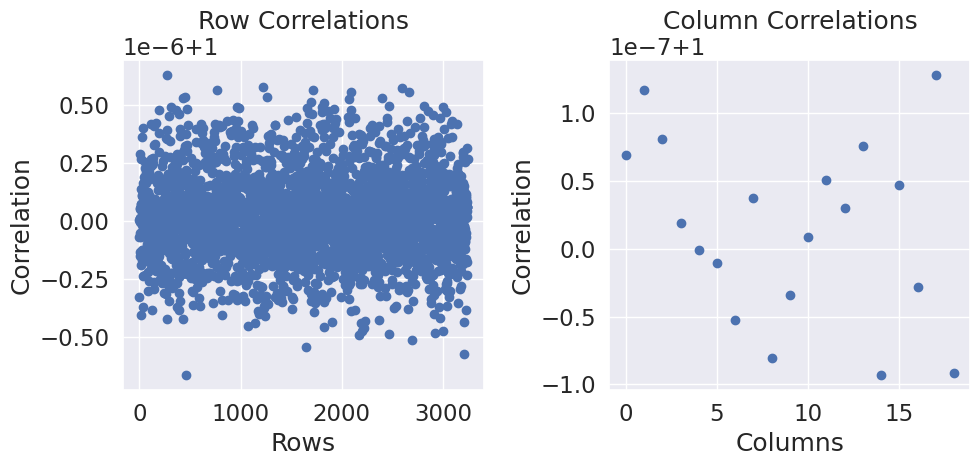

In [57]:
# Create subplots
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plot row correlations
ax[0].scatter(range(len(row_correlations)), row_correlations)
ax[0].set_title('Row Correlations')
ax[0].set_xlabel('Rows')
ax[0].set_ylabel('Correlation')

# Plot column correlations
ax[1].scatter(range(len(column_correlations)), column_correlations)
ax[1].set_title('Column Correlations')
ax[1].set_xlabel('Columns')
ax[1].set_ylabel('Correlation')

# Show plot
plt.tight_layout()
plt.show()

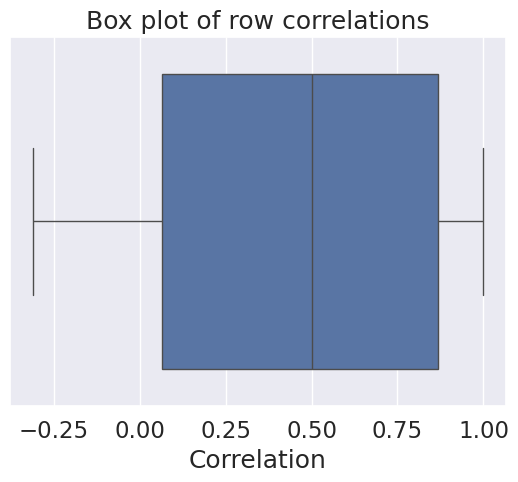

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

## Compute row correlations
row_correlations = xenium_spotbinned_celltypes_nuclei.corrwith(nuclei_spotbinned_celltypes_normed_df, axis=1)

sns.boxplot(x=row_correlations)
plt.title('Box plot of row correlations')
plt.xlabel('Correlation')
plt.show()

/tmp/ipykernel_3802000/3028021002.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")


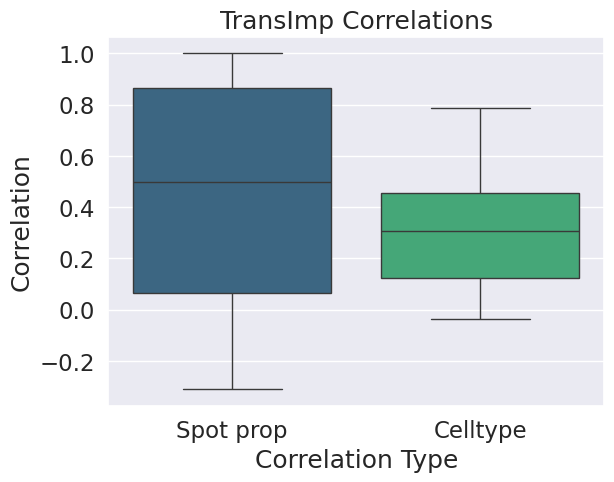

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set style and font size
# sns.set_style("white")
sns.set(font_scale=1.5)

# Compute row and column correlations
row_correlations = xenium_spotbinned_celltypes_nuclei.corrwith(nuclei_spotbinned_celltypes_normed_df, axis=1)
column_correlations = xenium_spotbinned_celltypes_nuclei.T.corrwith(nuclei_spotbinned_celltypes_normed_df.T, axis=1)

# Create a DataFrame with row and column correlations
correlations_df = pd.DataFrame({'Spot prop': row_correlations, 'Celltype': column_correlations})

# Melt the DataFrame to long format
melted_correlations_df = correlations_df.melt(var_name='Correlation Type', value_name='Correlation')

# Create a box plot of row and column correlations
sns.boxplot(x='Correlation Type', y='Correlation', data=melted_correlations_df, palette="viridis")
plt.title('TransImp Correlations')
plt.xlabel('Correlation Type')
plt.ylabel('Correlation')

plt.show()

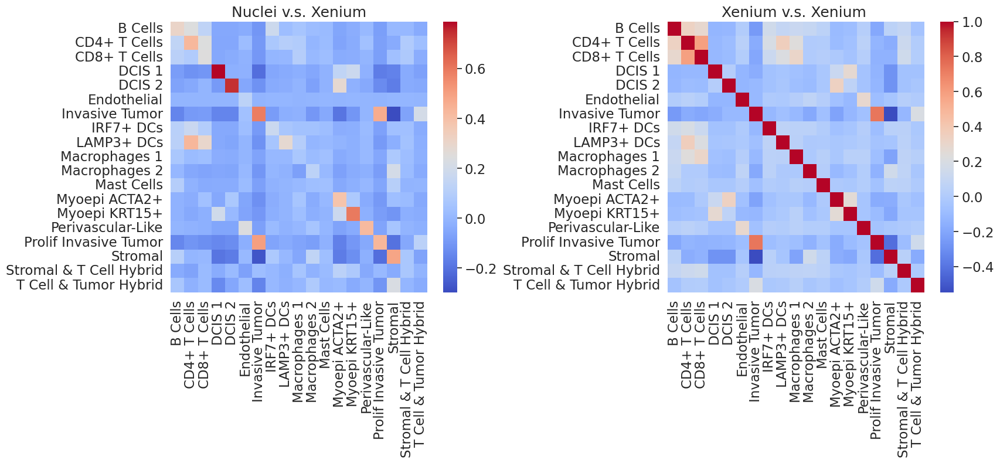

In [60]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=100)

corr_list = []
for col1 in nuclei_spotbinned_celltypes_normed_df.columns:
    temp_list = []
    for col2 in xenium_spotbinned_celltypes_nuclei.columns:
        temp_list.append(nuclei_spotbinned_celltypes_normed_df[col1].corr(xenium_spotbinned_celltypes_nuclei[col2]))
    corr_list.append(temp_list)
corr_df_TransImp = pd.DataFrame(corr_list)

sns.heatmap(corr_df_TransImp, annot=False, cmap='coolwarm', xticklabels=xenium_spotbinned_celltypes_nuclei.columns, 
            yticklabels=nuclei_spotbinned_celltypes_normed_df.columns, ax=axes[0])
axes[0].set_title('Nuclei v.s. Xenium')



corr_xenium = xenium_spotbinned_celltypes_nuclei.corr()
sns.heatmap(corr_xenium, annot=False, cmap='coolwarm', ax=axes[1])
axes[1].set_title('Xenium v.s. Xenium ')

plt.subplots_adjust(wspace=0.55)
plt.show()

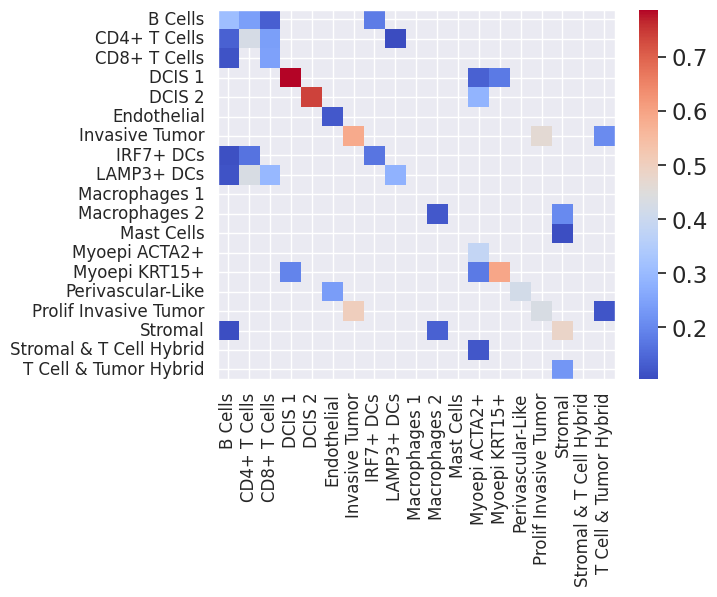

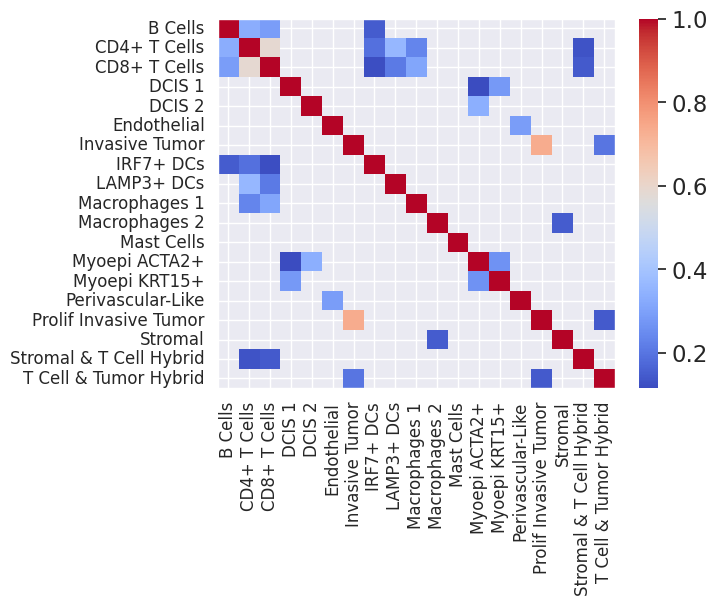

In [86]:
correlation_matrix1 = corr_df_TransImp.copy()
correlation_matrix1[correlation_matrix1 < 0.1] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), 
            xticklabels=xenium_spotbinned_celltypes_nuclei.columns, 
            yticklabels=nuclei_spotbinned_celltypes_normed_df.columns, 
            ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_spot_010.pdf", dpi=300)

plt.show()


correlation_matrix1 = corr_xenium.copy()
correlation_matrix1[correlation_matrix1 < 0.113] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), 
            xticklabels=xenium_spotbinned_celltypes_nuclei.columns, 
            yticklabels=nuclei_spotbinned_celltypes_normed_df.columns, 
            ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_spot_010.pdf", dpi=300)

plt.show()

##  Visium spot interpolation of Nuclei cell data：TransImp

In [ ]:
def bin_nuclei_data_to_visium_spots(
    visium_spot_centroids: np.ndarray[np.float32, (None, 2)],
    visium_spot_diameter: float,
    visium_barcodes: np.ndarray[str, (None, 2)],
    nuclei_coords: np.ndarray[np.float32, (None, 2)],
) -> np.ndarray[str]:
    """
    Assigns xenium coordinates to visium spots using a transform into the visium coordinate system.
    Coordinates are assigned by nearest neighbor.
    e.g. each Xenium transcript/cell etc is assigned to the closest Visium barcode after transformation.
    Also filters coordinates that lie outside an estimated capture area.
    """
    kdtree = KDTree(visium_spot_centroids)
    _, neighbors = kdtree.query(nuclei_coords, k=1)
    barcode_assignments = visium_barcodes[neighbors]

    visium_capture_polygon_full_res = get_visium_capture_polygon(
        spot_centroids=visium_spot_centroids, spot_diameter=visium_spot_diameter
    )
    barcode_assignments[
        ~points_in_poly(nuclei_coords, visium_capture_polygon_full_res)
    ] = __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__
    return barcode_assignments

In [147]:
import os
os.chdir(str(path)+'SpatialData/Data/')

st_adata = sc.read_h5ad("visium_annotated_cell2l_scFFPE.h5ad")
st_adata

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [148]:
st_adata.obs_names

Index(['AACACCTACTATCGAA-1', 'AACACGTGCATCGCAC-1', 'AACACTTGGCAAGGAA-1',
       'AACAGGAAGAGCATAG-1', 'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1',
       'AACAGGTTATTGCACC-1', 'AACAGGTTCACCGAAG-1', 'AACAGTCAGGCTCCGC-1',
       'AACAGTCCACGCGGTG-1',
       ...
       'TGTTCGCAACCGCCAA-1', 'TGTTCGTGACCAGTAG-1', 'TGTTCTGCTCTGTCGT-1',
       'TGTTGCGTCCAAGATT-1', 'TGTTGGAACCTTCCGC-1', 'TGTTGGAACGAGGTCA-1',
       'TGTTGGAAGCTCGGTA-1', 'TGTTGGATGGACTTCT-1', 'TGTTGGCCAGACCTAC-1',
       'TGTTGGCCTACACGTG-1'],
      dtype='object', length=4992)

In [149]:
import os
os.chdir(str(path)+'SpatialData/Data/')

import scanpy as sc
TransImp_adata = sc.read_h5ad("visium_nuclei_annotated_TransImp_scFFPE.h5ad")
print(TransImp_adata)

AnnData object with n_obs × n_vars = 56794 × 863
    obs: 'x', 'y', 'CD70', 'cell_type'
    uns: 'cell_type_colors', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


In [150]:
## Get nuclei -> Visium barcode assignments.
nuclei_spotbinned_cell_barcodes = bin_nuclei_data_to_visium_spots(
    visium_spot_centroids=st_adata.obsm['spatial'],
    # visium_spot_centroids=npc1_spot.obs[['pixel_x','pixel_y']].values,
    visium_spot_diameter=visium_scale_factors["spot_diameter_fullres"],
    visium_barcodes=visium_tissue_positions.index.values,
    nuclei_coords=TransImp_adata.obs[['x','y']].values,
)

print(nuclei_spotbinned_cell_barcodes)
print(len(nuclei_spotbinned_cell_barcodes))

## Filter cells outside of Visium capture area.
unassigned_cell_mask = (nuclei_spotbinned_cell_barcodes != __OUTSIDE_VISIUM_CAPTURE_AREA_BARCODE__)
print(unassigned_cell_mask)
print(len(unassigned_cell_mask))

## Generate a spot X cell type dataframe.
## input: -nuclei_celltype_df
nuclei_spotbinned_cell_adata = generate_anndata_matrix_from_transcript_assignments(
    barcodes=nuclei_spotbinned_cell_barcodes[unassigned_cell_mask],
    feature_names=pd.DataFrame(TransImp_adata.obs['cell_type'])[unassigned_cell_mask]["cell_type"].values,
    # feature_names=nuclei_celltype_df[unassigned_cell_mask]["Cluster"].values,
)
nuclei_spotbinned_celltypes_df = nuclei_spotbinned_cell_adata.to_df()

## Normalize each spot to the sum of the cell count. 
nuclei_spotbinned_celltypes_normed_df = nuclei_spotbinned_celltypes_df.div(
    nuclei_spotbinned_celltypes_df.sum(1), axis=0
)

['AAGTTAAGCACTATAA-1' 'TCCTATTGACTGTTGA-1' 'TGCGTATCTTGTACCG-1' ...
 'AAGGCCAGTCGCAATT-1' 'AAGTTAAGCACTATAA-1' 'AACTTCATCTTCTGGT-1']
56794
[ True  True  True ...  True  True  True]
56794


In [151]:
nuclei_spotbinned_celltypes_normed_df

,Macrophages 1,Mast Cells,T Cell & Tumor Hybrid,Invasive Tumor,Stromal & T Cell Hybrid,Myoepi KRT15+,DCIS 2,Myoepi ACTA2+,Prolif Invasive Tumor,IRF7+ DCs,Macrophages 2,LAMP3+ DCs,Stromal,CD8+ T Cells,CD4+ T Cells,Perivascular-Like,DCIS 1,B Cells,Endothelial
GGTTAGCACGCCTATG-1,0.0,0.000000,0.000000,0.428571,0.000000,0.0,0.0,0.0,0.476190,0.0,0.000000,0.000000,0.095238,0.000000,0.000000,0.0,0.0,0.000000,0.0
TCCGAATACCGAATAG-1,0.0,0.000000,0.103448,0.517241,0.068966,0.0,0.0,0.0,0.275862,0.0,0.000000,0.000000,0.034483,0.000000,0.000000,0.0,0.0,0.000000,0.0
ATAACGCCTGTAGGCA-1,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.000000,0.0
ACATCGCCACAAGAGG-1,0.0,0.000000,0.025316,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.037975,0.000000,0.000000,0.000000,0.0,0.0,0.936709,0.0
CGGTCAACGGCGGATT-1,0.0,0.000000,0.000000,0.187500,0.687500,0.0,0.0,0.0,0.125000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTGCTCATTAGAGTGC-1,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
CCTATGTCTTACCGGC-1,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.000000,0.0
AAGCACTCAGGAATGT-1,0.0,0.000000,0.250000,0.083333,0.333333,0.0,0.0,0.0,0.333333,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
GAACGCCAGTGCATAC-1,0.0,0.181818,0.545455,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.272727,0.000000,0.000000,0.0,0.0,0.000000,0.0


In [152]:
## inter 'xenium_spotbinned_cell_adata' and 'xenium_spotbinned_transcript_adata' to 'xenium_spotbinned_adata'
nuclei_spotbinned_adata = st_adata[nuclei_spotbinned_cell_adata.obs_names]
nuclei_spotbinned_adata.obsm['cell_type_TransImp'] = nuclei_spotbinned_celltypes_normed_df
nuclei_spotbinned_adata

/tmp/ipykernel_3072124/3328910086.py:3: ImplicitModificationWarning: Setting element `.obsm['cell_type_TransImp']` of view, initializing view as actual.
  nuclei_spotbinned_adata.obsm['cell_type_TransImp'] = nuclei_spotbinned_celltypes_normed_df


AnnData object with n_obs × n_vars = 3493 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf', 'cell_type_TransImp'

In [156]:
## save adata
# nuclei_spotbinned_adata.write(str(path)+'SpatialData/Data/nuclei_spotbinned_adata_TransImp.h5ad')

## Spatial correlation between cell types
D:\OneDrive - The University Of Hong Kong\公派出国\博士后\HuangYH\Project\SpatialDM

### For each cell: xenium

In [111]:
# !pip install -U git+https://github.com/StatBiomed/SpatialDM

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
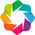

SpatailDM version: 0.2.0


In [21]:
import os
import pandas as pd
import numpy as np
import anndata as ann

import spatialdm as sdm
from spatialdm.datasets import dataset
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

In [23]:
import scanpy as sc
xenium_mat = sc.read_h5ad(str(path)+'Xenium/xenium-publication/xenium_cell_feature_matrix.h5ad')
print(xenium_mat)
pd.DataFrame(xenium_mat.X.A)

AnnData object with n_obs × n_vars = 167780 × 313
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


,0,1,2,3,4,5,6,7,8,9,...,303,304,305,306,307,308,309,310,311,312
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167775,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0
167776,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
167777,4.0,1.0,5.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,3.0
167778,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
xenium_mat.obs['cell_type']

1                 DCIS 2
2                 DCIS 2
3              Unlabeled
4         Invasive Tumor
5                 DCIS 2
               ...      
167776            DCIS 1
167777            DCIS 2
167778            DCIS 1
167779            DCIS 2
167780            DCIS 1
Name: cell_type, Length: 167780, dtype: category
Categories (20, object): ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', ..., 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid', 'Unlabeled']

In [25]:
## Normalize and log transform the data
sc.pp.normalize_total(xenium_mat, target_sum=5e4)
sc.pp.log1p(xenium_mat)

/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


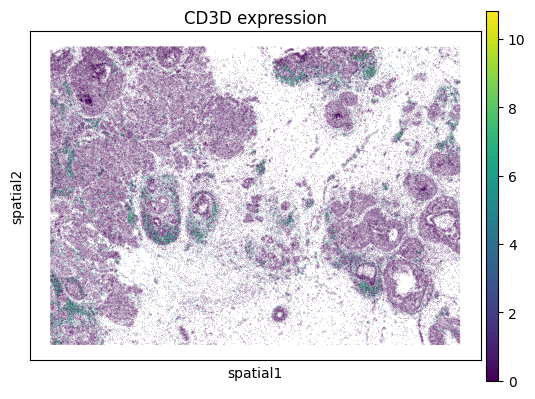

In [35]:
gene = 'CD3D'
sc.pl.spatial(xenium_mat, color=gene, title=f'{gene} expression', spot_size=10)

In [26]:
print((np.max(xenium_mat.obsm['spatial'][:,0]) - np.min(xenium_mat.obsm['spatial'][:,1])) / np.sqrt(xenium_mat.shape[0]))

18.363144459626046


In [29]:
sdm.weight_matrix(xenium_mat, l=130, cutoff=0.001, single_cell=False)

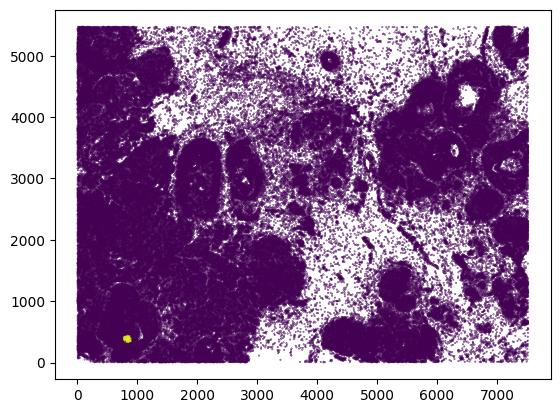

In [37]:
plt.scatter(xenium_mat.obsm['spatial'][:,0], xenium_mat.obsm['spatial'][:,1],
            c=xenium_mat.obsp['weight'].A[50], s=0.1)
plt.show()

In [27]:
# sdm.weight_matrix(xenium_mat, l=130, cutoff=0.001, single_cell=True)

# plt.scatter(xenium_mat.obsm['spatial'][:,0], xenium_mat.obsm['spatial'][:,1],
#             c=xenium_mat.obsp['weight'].A[50], s=0.1)
# plt.show()

In [31]:
res = sdm.utils.Moran_R(
    pd.DataFrame(xenium_mat.X.A).values[:, :10], 
    pd.DataFrame(xenium_mat.X.A).values[:, 10:20], 
    xenium_mat.obsp['weight']
)

In [32]:
res

(array([-0.03859255,  0.02802296,  0.02472438,  0.00013254, -0.00579837,
         0.04772007,  0.00268873, -0.00200998,  0.00082829,  0.01875878]),
 array([-220.01904445,  159.76100655,  140.95558004,    0.75560384,
         -33.05692173,  272.05575887,   15.32862852,  -11.45904427,
           4.72211729,  106.94520606]),
 array([1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.24943377e-01,
        1.00000000e+00, 0.00000000e+00, 2.46135370e-53, 1.00000000e+00,
        1.16701002e-06, 0.00000000e+00]))

In [331]:
## Any pair of genes
X = xenium_mat[:,'ERBB2'].X.A
Y = xenium_mat[:,'VWF'].X.A
## return: (Moran's R, z score and p values)
sdm.utils.Moran_R(X, Y, xenium_mat.obsp['weight'])

(array([0.00789141]), array([44.98951378]), array([0.]))

### For each spot: paper deconv. results

In [98]:
import os
os.chdir(str(path)+'SpatialData/Data/')

st_adata = sc.read_h5ad("visium_annotated_cell2l_scFFPE.h5ad")
st_adata

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [99]:
#########################################
# paper deconv.: 2889 obs, 19 cell types
#########################################
celltypp_gt = pd.read_excel(str(path)+'NPC/Data/stdata/Annodata/41467_2023_43458_MOESM4_ESM.xlsx', sheet_name='Sup. Fig. 10 Visium Deconv.', index_col=0) 
# celltypp_gt

missing_elements = [x for x in st_adata.obs_names if x not in celltypp_gt.index]
missing_data = pd.DataFrame(0, index=missing_elements, columns=celltypp_gt.columns)
celltypp_gt = pd.concat([celltypp_gt, missing_data]).loc[st_adata.obs_names]
celltypp_gt.columns = celltypp_gt.columns.str.replace('_', ' ')
# celltypp_gt

## update .obs['cell_type'] and .obsm['q05_cell_abundance_w_sf'] using paper deconv. results
clust_labels = np.array(celltypp_gt.columns)
st_adata.obs[clust_labels]=celltypp_gt
st_adata.obsm['q05_cell_abundance_w_sf'] = celltypp_gt
# st_adata.obs[clust_labels]

## directly save the cell2location result
st_adata.obs['cell_type'] = st_adata.obs[clust_labels].idxmax(axis=1)
print(st_adata)

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'


In [100]:
import os
import pandas as pd
import numpy as np
import anndata as ann

import spatialdm as sdm
from spatialdm.datasets import dataset
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

SpatailDM version: 0.2.0


In [101]:
st_adata.X.todense()

matrix([[15,  0,  1, ...,  0,  5,  1],
        [ 9,  0,  0, ...,  0,  4,  1],
        [57,  0,  2, ...,  0, 14,  0],
        ...,
        [22,  0,  0, ...,  2,  6,  3],
        [ 2,  0,  0, ...,  0,  0,  1],
        [ 4,  0,  0, ...,  0,  6,  0]])

In [102]:
st_adata.obsm['spatial']

array([[ 4131,  4636],
       [13355, 16640],
       [ 8845, 12067],
       ...,
       [10447,  6653],
       [11039, 12368],
       [ 3720, 10518]])

In [103]:
st_adata.var_names_make_unique()
## Normalize and log transform the data
sc.pp.normalize_total(st_adata, target_sum=5e4)
sc.pp.log1p(st_adata)

/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


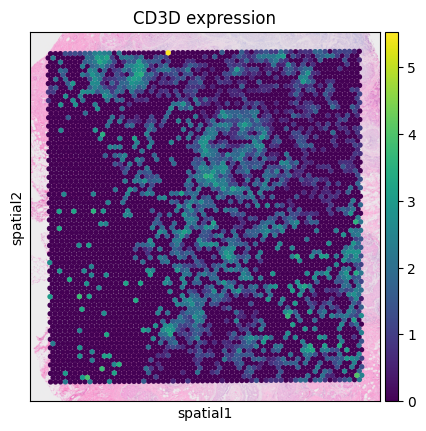

In [104]:
gene = 'CD3D'
sc.pl.spatial(st_adata, color=gene, title=f'{gene} expression', spot_size=200)

In [105]:
print((np.max(st_adata.obsm['spatial'][:,0]) - np.min(st_adata.obsm['spatial'][:,0])) / np.sqrt(st_adata.shape[0]))

165.42567468852542


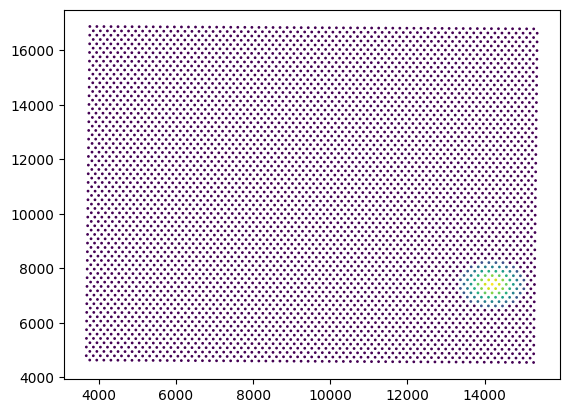

In [106]:
sdm.weight_matrix(st_adata, l=500, cutoff=0.2, single_cell=False)

plt.scatter(st_adata.obsm['spatial'][:,0], st_adata.obsm['spatial'][:,1],
            c=st_adata.obsp['weight'].A[50], s=1.0)
plt.show()

In [107]:
print(st_adata.obsm['q05_cell_abundance_w_sf'].shape)

(4992, 19)


In [108]:
## the first 40 cell types vs the last 40 cell types

res = sdm.utils.Moran_R(
    st_adata.obsm['q05_cell_abundance_w_sf'].values[:, 0:9], 
    st_adata.obsm['q05_cell_abundance_w_sf'].values[:, 9:18], 
    st_adata.obsp['weight']
)

In [109]:
res

(array([ 0.11457712, -0.03784074, -0.019259  ,  0.07685088, -0.03572777,
         0.18907485,  0.69310204,  0.08296699,  0.22675102]),
 array([ 66.65369484, -22.01333729, -11.2036649 ,  44.70696448,
        -20.78414593, 109.99174201, 403.20275614,  48.26492618,
        131.9093464 ]),
 array([0., 1., 1., 0., 1., 0., 0., 0., 0.]))

In [110]:
## Any pair of genes
# X = st_adata[:, 'CCL21'].X.A
# Y = st_adata[:, 'CCR7'].X.A
# sdm.utils.Moran_R(X, Y, st_adata.obsp['weight'])

In [111]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

n_cell_types = st_adata.obsm['q05_cell_abundance_w_sf'].shape[1]
correlation_matrix_visium = np.zeros((n_cell_types, n_cell_types))

for i in range(n_cell_types):
    for j in range(n_cell_types):
        correlation_matrix_visium[i, j] = sdm.utils.Moran_R(
            st_adata.obsm['q05_cell_abundance_w_sf'].values[:, i:i+1], 
            st_adata.obsm['q05_cell_abundance_w_sf'].values[:, j:j+1], 
            st_adata.obsp['weight']
        )[0]

/tmp/ipykernel_70005/30045258.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  correlation_matrix_visium[i, j] = sdm.utils.Moran_R(


In [112]:
st_adata.obsm['q05_cell_abundance_w_sf'].columns

Index(['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2',
       'Endothelial', 'Invasive Tumor', 'IRF7+ DCs', 'LAMP3+ DCs',
       'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+',
       'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor',
       'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'],
      dtype='object')

In [114]:
correlation_matrix0_paper = pd.DataFrame(correlation_matrix_visium)
correlation_matrix0_paper.index = st_adata.obsm['q05_cell_abundance_w_sf'].columns
correlation_matrix0_paper.columns = st_adata.obsm['q05_cell_abundance_w_sf'].columns
correlation_matrix0_paper

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
B Cells,0.313863,0.215706,0.213878,-0.003613,0.020671,-0.016067,-0.137117,0.239012,0.160442,0.114577,-0.020927,0.022791,0.089639,0.066107,-0.050871,-0.143791,0.003191,0.218422,-0.007157
CD4+ T Cells,0.215706,0.279709,0.250207,-0.051993,0.032904,-0.022323,-0.085761,0.219364,0.207778,0.146612,-0.037841,-0.004446,0.058540,0.013292,-0.030036,-0.083492,-0.030364,0.248695,-0.003566
CD8+ T Cells,0.213878,0.250207,0.338747,-0.048590,0.041622,-0.056586,-0.145957,0.236347,0.220587,0.170953,-0.040152,-0.019259,0.124355,0.039174,-0.056108,-0.145692,0.019961,0.331296,-0.012634
DCIS 1,-0.003613,-0.051993,-0.048590,0.622366,-0.070437,-0.078313,-0.122509,-0.022069,-0.020363,0.037068,-0.143369,-0.034595,0.076851,0.269227,-0.077251,-0.130761,-0.187940,-0.040171,-0.030758
DCIS 2,0.020671,0.032904,0.041622,-0.070437,0.519916,-0.066905,-0.063412,-0.013694,0.014997,0.097097,-0.121308,-0.053871,0.107581,-0.035728,-0.037593,-0.014449,-0.175197,0.031861,0.016062
Endothelial,-0.016067,-0.022323,-0.056586,-0.078313,-0.066905,0.283611,-0.112805,-0.006208,-0.033171,-0.067088,0.193652,0.080597,-0.052914,-0.042264,0.189075,-0.112158,0.097239,-0.054693,0.002218
Invasive Tumor,-0.137117,-0.085761,-0.145957,-0.122509,-0.063412,-0.112805,0.735033,-0.182662,-0.095090,-0.000537,-0.355935,-0.148778,-0.148845,-0.154471,-0.020286,0.693102,-0.472431,-0.164234,0.061912
IRF7+ DCs,0.239012,0.219364,0.236347,-0.022069,-0.013694,-0.006208,-0.182662,0.287184,0.174101,0.102618,0.028603,0.014282,0.078136,0.040012,-0.051143,-0.191834,0.082967,0.254406,-0.021574
LAMP3+ DCs,0.160442,0.207778,0.220587,-0.020363,0.014997,-0.033171,-0.095090,0.174101,0.218488,0.141735,-0.053931,-0.002305,0.088095,0.050971,-0.031256,-0.099856,-0.008209,0.226751,-0.010029
Macrophages 1,0.114577,0.146612,0.170953,0.037068,0.097097,-0.067088,-0.000537,0.102618,0.141735,0.302401,-0.153953,-0.065225,0.122618,0.114988,-0.014906,0.008369,-0.192537,0.169216,0.007924


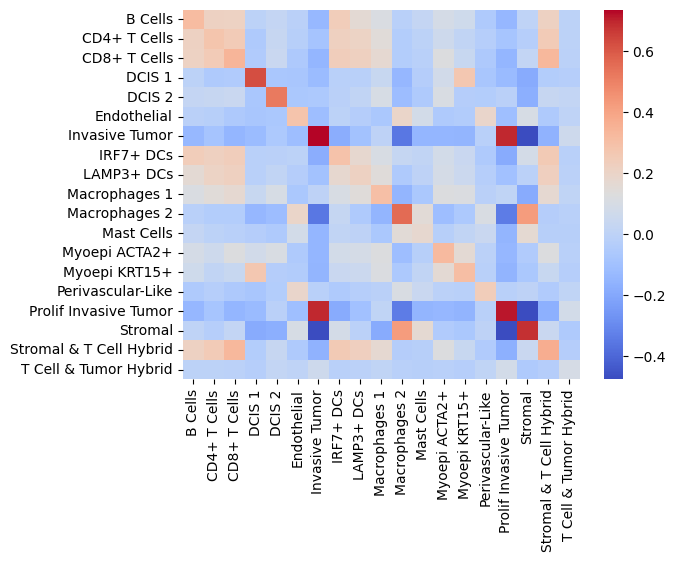

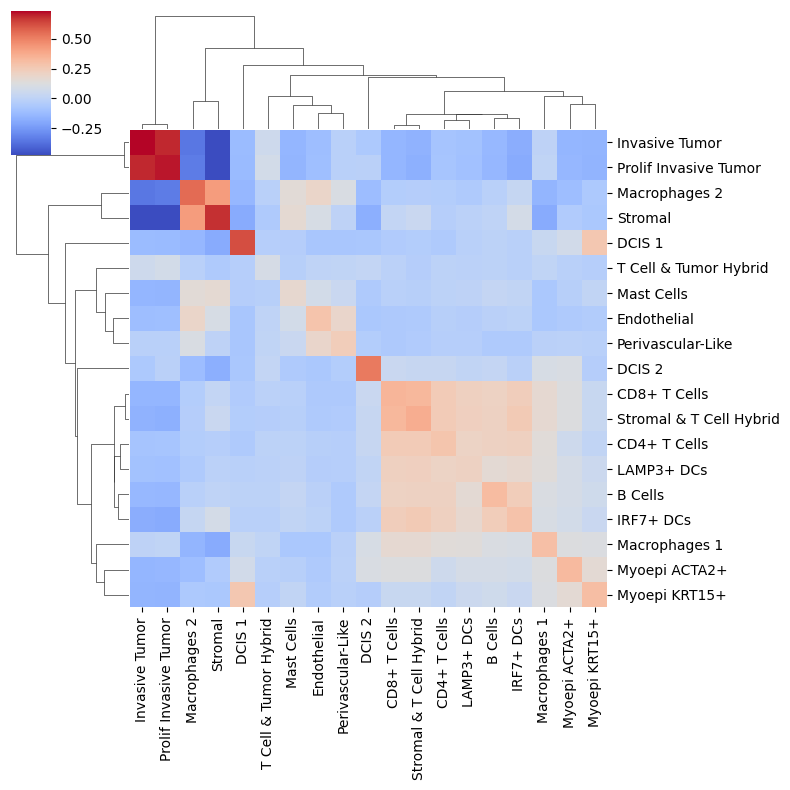

In [54]:
## heatmap
sns.heatmap(correlation_matrix0_paper, cmap="coolwarm")
plt.show()

## clustermap
sns.clustermap(correlation_matrix0_paper, cmap="coolwarm", figsize=(8,8))
plt.show()

In [115]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning, module="numpy.lib.function_base")

def plot_heatmaps_cutoff_cor(combined_corr, cutoff=None, output_file=None):
    fig, ax = plt.subplots(dpi=100)
    
    if cutoff is not None:
        corr1 = combined_corr.copy()
        corr1[corr1 < cutoff] = 0
        
        sns.heatmap(corr1, annot=False, cmap="Greens",
                    xticklabels=corr1.columns, 
                    yticklabels=corr1.columns, vmin=0, vmax=1,
                    linewidth=0.5, linecolor='grey', ax=ax)
        
    else:
        sns.heatmap(combined_corr, annot=False, cmap="coolwarm",
                    xticklabels=combined_corr.columns, 
                    yticklabels=combined_corr.columns, linewidth=.5, linecolor='grey', vmin=0, vmax=1, ax=ax)

    ax.set_title('Cell-cell colocalization')
    ax.tick_params(axis='both', labelsize=12)

    if output_file is not None:
        plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)  
    
    plt.show()

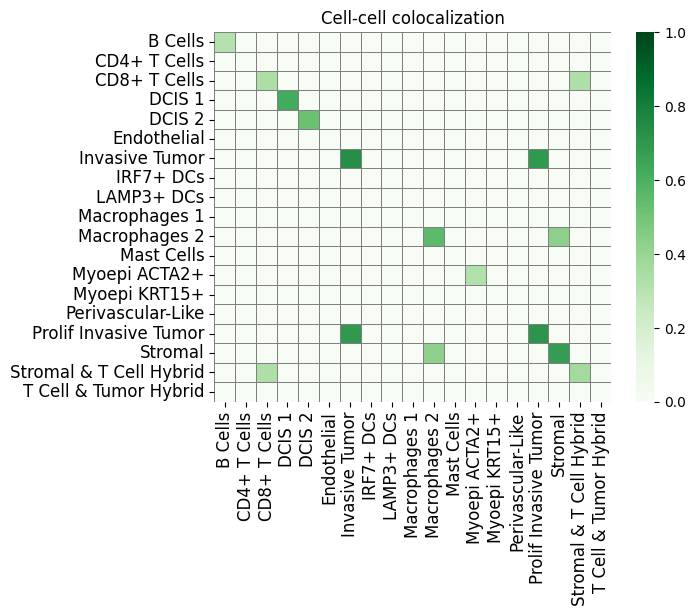

In [144]:
plot_heatmaps_cutoff_cor(correlation_matrix0_paper, cutoff=0.31)

# os.chdir(str(path)+"SpatialData/Data/resultsROIs/")
# plot_heatmaps_cutoff_cor(correlation_matrix0_paper, cutoff=0.31, output_file='clustermap_deconv_spot_green.pdf')

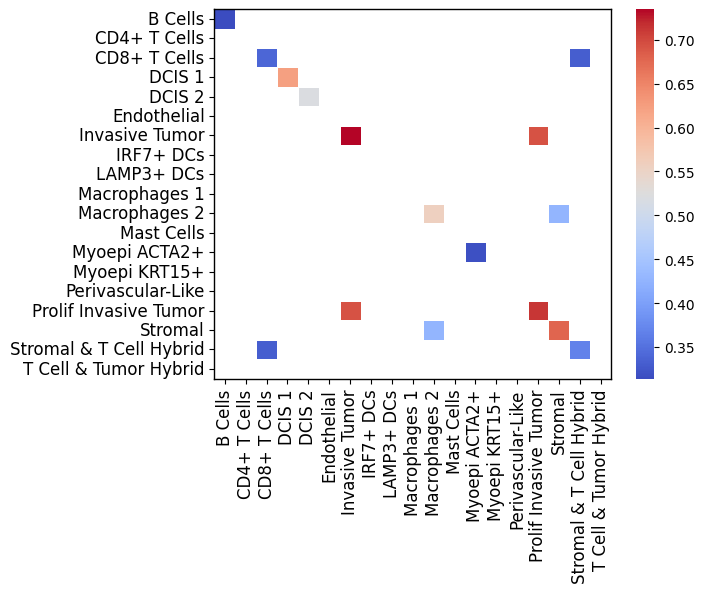

In [187]:
correlation_matrix1 = correlation_matrix0_paper.copy()
correlation_matrix1[correlation_matrix1 < 0.31] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), linewidth=0.5, linecolor='white', ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_deconv_spot_031.pdf", dpi=300)

plt.show()

### For each spot: cell2location reults

In [55]:
import os
os.chdir(str(path)+'SpatialData/Data/')

st_adata = sc.read_h5ad("visium_annotated_cell2l_scFFPE.h5ad")
st_adata

AnnData object with n_obs × n_vars = 4992 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [56]:
import os
import pandas as pd
import numpy as np
import anndata as ann

import spatialdm as sdm
from spatialdm.datasets import dataset
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

SpatailDM version: 0.2.0


In [57]:
st_adata.var_names_make_unique()
## Normalize and log transform the data
sc.pp.normalize_total(st_adata, target_sum=5e4)
sc.pp.log1p(st_adata)

/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


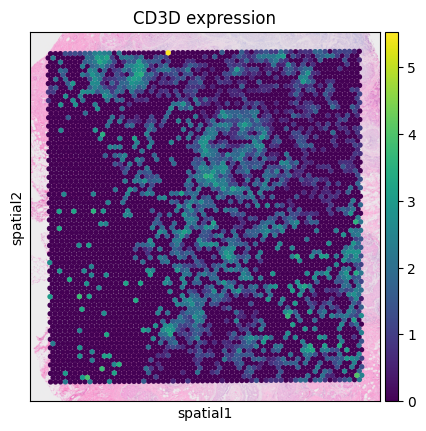

In [58]:
gene = 'CD3D'
sc.pl.spatial(st_adata, color=gene, title=f'{gene} expression', spot_size=200)

In [59]:
print((np.max(st_adata.obsm['spatial'][:,0]) - np.min(st_adata.obsm['spatial'][:,0])) / np.sqrt(st_adata.shape[0]))

165.42567468852542


In [60]:
sdm.weight_matrix(st_adata, l=500, cutoff=0.2, single_cell=False)

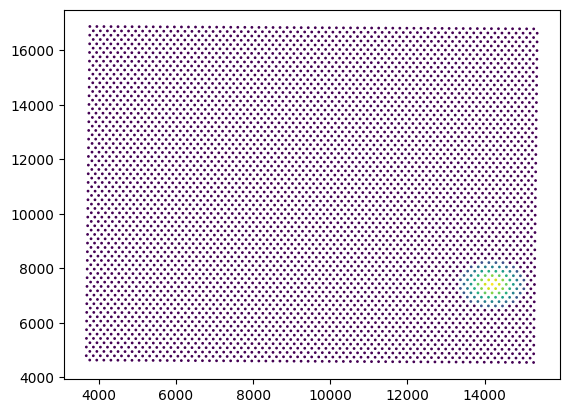

In [61]:
plt.scatter(st_adata.obsm['spatial'][:,0], st_adata.obsm['spatial'][:,1],
            c=st_adata.obsp['weight'].A[50], s=1.0)
plt.show()

In [62]:
print(st_adata.obsm['q05_cell_abundance_w_sf'].shape)

(4992, 19)


In [63]:
## the first 40 cell types vs the last 40 cell types
res = sdm.utils.Moran_R(
    st_adata.obsm['q05_cell_abundance_w_sf'].values[:, 0:9], 
    st_adata.obsm['q05_cell_abundance_w_sf'].values[:, 9:18], 
    st_adata.obsp['weight']
)

In [64]:
res

(array([ 0.05422916,  0.08176138,  0.07741841, -0.01185063, -0.01500228,
         0.16847238, -0.08949378, -0.27673686,  0.29364061]),
 array([  31.54707911,   47.56357729,   45.03711245,   -6.89394466,
          -8.72737343,   98.00653163,  -52.06179649, -160.98793149,
         170.82146029]),
 array([9.83171484e-219, 0.00000000e+000, 0.00000000e+000, 1.00000000e+000,
        1.00000000e+000, 0.00000000e+000, 1.00000000e+000, 1.00000000e+000,
        0.00000000e+000]))

In [65]:
## Any pair of genes
# X = st_adata[:, 'CCL21'].X.A
# Y = st_adata[:, 'CCR7'].X.A
# sdm.utils.Moran_R(X, Y, st_adata.obsp['weight'])

In [66]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

n_cell_types = st_adata.obsm['q05_cell_abundance_w_sf'].shape[1]
correlation_matrix = np.zeros((n_cell_types, n_cell_types))

for i in range(n_cell_types):
    for j in range(n_cell_types):
        correlation_matrix[i, j] = sdm.utils.Moran_R(
            st_adata.obsm['q05_cell_abundance_w_sf'].values[:, i:i+1], 
            st_adata.obsm['q05_cell_abundance_w_sf'].values[:, j:j+1], 
            st_adata.obsp['weight']
        )[0]

st_adata.obsm['q05_cell_abundance_w_sf'].columns

/tmp/ipykernel_3072124/1872950771.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  correlation_matrix[i, j] = sdm.utils.Moran_R(


Index(['q05cell_abundance_w_sf_B Cells', 'q05cell_abundance_w_sf_CD4+ T Cells',
       'q05cell_abundance_w_sf_CD8+ T Cells', 'q05cell_abundance_w_sf_DCIS 1',
       'q05cell_abundance_w_sf_DCIS 2', 'q05cell_abundance_w_sf_Endothelial',
       'q05cell_abundance_w_sf_IRF7+ DCs',
       'q05cell_abundance_w_sf_Invasive Tumor',
       'q05cell_abundance_w_sf_LAMP3+ DCs',
       'q05cell_abundance_w_sf_Macrophages 1',
       'q05cell_abundance_w_sf_Macrophages 2',
       'q05cell_abundance_w_sf_Mast Cells',
       'q05cell_abundance_w_sf_Myoepi ACTA2+',
       'q05cell_abundance_w_sf_Myoepi KRT15+',
       'q05cell_abundance_w_sf_Perivascular-Like',
       'q05cell_abundance_w_sf_Prolif Invasive Tumor',
       'q05cell_abundance_w_sf_Stromal',
       'q05cell_abundance_w_sf_Stromal & T Cell Hybrid',
       'q05cell_abundance_w_sf_T Cell & Tumor Hybrid'],
      dtype='object')

In [67]:
correlation_matrix0 = pd.DataFrame(correlation_matrix)
correlation_matrix0.index = st_adata.obsm['q05_cell_abundance_w_sf'].columns
correlation_matrix0.columns = st_adata.obsm['q05_cell_abundance_w_sf'].columns
correlation_matrix0

,q05cell_abundance_w_sf_B Cells,q05cell_abundance_w_sf_CD4+ T Cells,q05cell_abundance_w_sf_CD8+ T Cells,q05cell_abundance_w_sf_DCIS 1,q05cell_abundance_w_sf_DCIS 2,q05cell_abundance_w_sf_Endothelial,q05cell_abundance_w_sf_IRF7+ DCs,q05cell_abundance_w_sf_Invasive Tumor,q05cell_abundance_w_sf_LAMP3+ DCs,q05cell_abundance_w_sf_Macrophages 1,q05cell_abundance_w_sf_Macrophages 2,q05cell_abundance_w_sf_Mast Cells,q05cell_abundance_w_sf_Myoepi ACTA2+,q05cell_abundance_w_sf_Myoepi KRT15+,q05cell_abundance_w_sf_Perivascular-Like,q05cell_abundance_w_sf_Prolif Invasive Tumor,q05cell_abundance_w_sf_Stromal,q05cell_abundance_w_sf_Stromal & T Cell Hybrid,q05cell_abundance_w_sf_T Cell & Tumor Hybrid
q05cell_abundance_w_sf_B Cells,0.232266,0.199875,0.199919,-0.004690,0.061515,0.019621,0.207186,-0.058795,0.171469,0.054229,0.080583,0.083693,0.069483,0.033105,-0.017718,-0.053444,-0.019560,0.215839,0.004787
q05cell_abundance_w_sf_CD4+ T Cells,0.199875,0.289514,0.291995,-0.031026,0.052024,0.040601,0.257553,-0.040875,0.264623,0.087969,0.081761,0.094269,0.082365,0.033719,-0.002286,-0.029797,-0.038055,0.284144,0.036047
q05cell_abundance_w_sf_CD8+ T Cells,0.199919,0.291995,0.340775,-0.027702,0.082021,0.038193,0.254575,-0.024709,0.287374,0.114493,0.056630,0.077418,0.129390,0.052441,0.003525,-0.009973,-0.034583,0.316697,0.062598
q05cell_abundance_w_sf_DCIS 1,-0.004690,-0.031026,-0.027702,0.541508,-0.044873,-0.039010,-0.022700,-0.098877,-0.005963,0.076655,-0.112845,0.015340,-0.011851,0.221405,-0.045661,-0.085685,-0.122840,-0.034989,-0.072362
q05cell_abundance_w_sf_DCIS 2,0.061515,0.052024,0.082021,-0.044873,0.471748,-0.011401,0.034778,-0.013963,0.045122,0.092854,-0.071672,0.000029,0.117618,-0.015002,-0.017619,0.013062,-0.110647,0.032653,0.026405
q05cell_abundance_w_sf_Endothelial,0.019621,0.040601,0.038193,-0.039010,-0.011401,0.220173,0.013065,0.218635,0.032262,0.052487,-0.068431,0.012991,-0.009314,-0.038631,0.168472,0.205440,-0.135947,0.002679,0.182906
q05cell_abundance_w_sf_IRF7+ DCs,0.207186,0.257553,0.254575,-0.022700,0.034778,0.013065,0.295031,-0.095643,0.231248,0.051699,0.122713,0.089831,0.082782,0.041497,-0.034493,-0.089494,0.016405,0.305186,-0.038403
q05cell_abundance_w_sf_Invasive Tumor,-0.058795,-0.040875,-0.024709,-0.098877,-0.013963,0.218635,-0.095643,0.720354,-0.034899,0.143954,-0.273251,-0.054467,-0.080350,-0.114943,0.336935,0.687208,-0.276737,-0.176141,0.461489
q05cell_abundance_w_sf_LAMP3+ DCs,0.171469,0.264623,0.287374,-0.005963,0.045122,0.032262,0.231248,-0.034899,0.283340,0.106920,0.043895,0.084226,0.114601,0.069760,-0.003370,-0.025078,-0.023109,0.293641,0.037273
q05cell_abundance_w_sf_Macrophages 1,0.054229,0.087969,0.114493,0.076655,0.092854,0.052487,0.051699,0.143954,0.106920,0.253439,-0.095422,0.024433,0.050599,0.076538,0.078512,0.157441,-0.160701,0.048986,0.134357


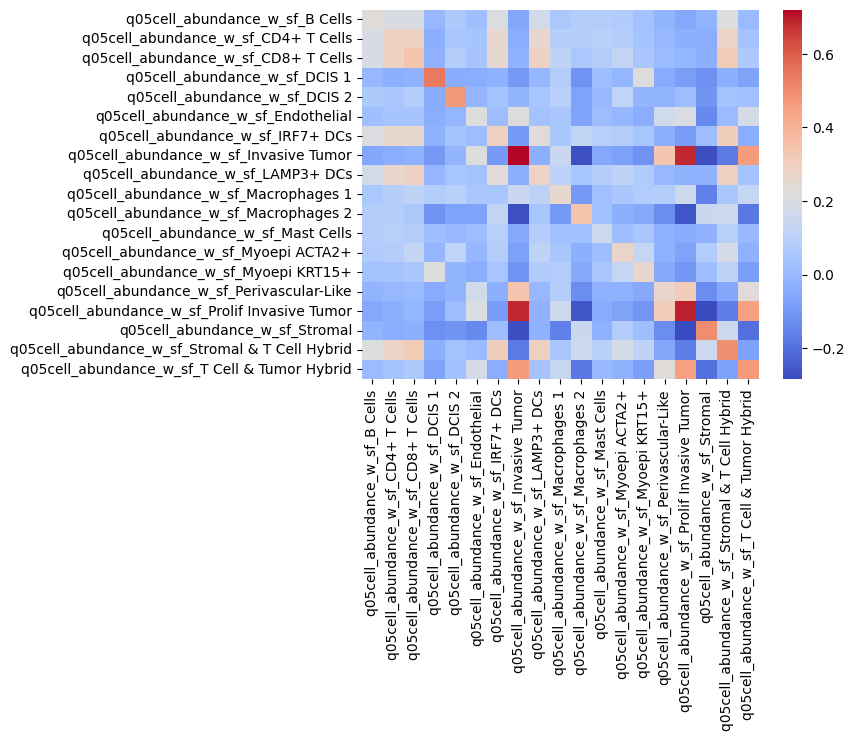

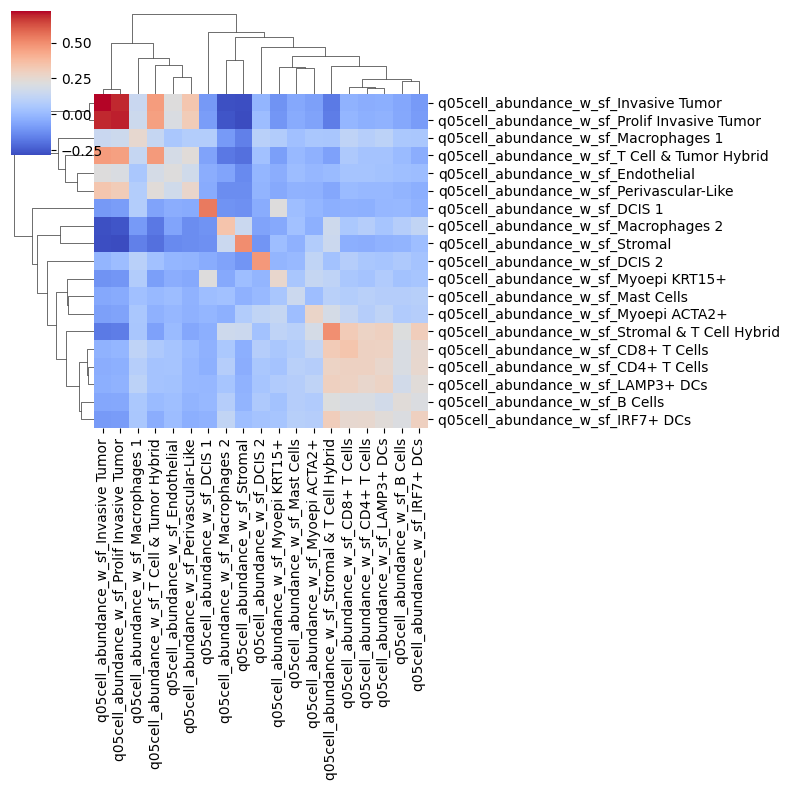

In [68]:
## heatmap
sns.heatmap(correlation_matrix0, cmap="coolwarm")
plt.show()

## clustermap
sns.clustermap(correlation_matrix0, cmap="coolwarm", figsize=(8,8))
plt.show()

### For each spot: Xenium ground truth reults
- make xenium to general visium annotaion data

In [34]:
xenium_gt_adata = sc.read_h5ad(str(path)+'Xenium/xenium-publication/xenium_spotbinned_adata.h5ad')
print(xenium_gt_adata)

AnnData object with n_obs × n_vars = 3958 × 541
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres'
    obsm: 'cell_type_gt', 'spatial'


In [35]:
import os
import pandas as pd
import numpy as np
import anndata as ann

import spatialdm as sdm
from spatialdm.datasets import dataset
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

SpatailDM version: 0.2.0


In [36]:
xenium_gt_adata.X.todense()

matrix([[  0.,   4.,   0., ...,   3.,   0.,  11.],
        [  2.,   1.,   2., ...,   2.,   0.,   4.],
        [ 18., 105.,   1., ...,   2.,   0.,   7.],
        ...,
        [  7.,  70.,   1., ...,  14.,   0.,  20.],
        [ 11.,  32.,  12., ...,   7.,   0.,  11.],
        [  6.,  23.,   0., ...,   2.,   0.,   8.]], dtype=float32)

In [37]:
xenium_gt_adata.var_names_make_unique()
## Normalize and log transform the data
sc.pp.normalize_total(xenium_gt_adata, target_sum=5e4)
sc.pp.log1p(xenium_gt_adata)

In [38]:
cell_type_gt_order = ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2',
       'Endothelial', 'Invasive Tumor', 'IRF7+ DCs', 'LAMP3+ DCs',
       'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+',
       'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor',
       'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid']
len(cell_type_gt_order)

19

In [39]:
xenium_gt_adata.obsm['cell_type_gt'] = xenium_gt_adata.obsm['cell_type_gt'][cell_type_gt_order]
xenium_gt_adata.obsm['cell_type_gt']

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
CGTGTTAACCTGAAGC-1,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.000000,0.000,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000
TGCGATGCAGGTGCGA-1,0.000000,0.111111,0.111111,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.000000,0.000,0.0,0.000000,0.0,0.000000,0.000000,0.666667,0.000000,0.000000
TAGGCTCCGGCATACA-1,0.000000,0.000000,0.000000,0.0,0.000000,0.063492,0.746032,0.000,0.0,0.031746,0.000,0.0,0.000000,0.0,0.015873,0.031746,0.063492,0.000000,0.031746
GCCTTGGCGAACAATC-1,0.062500,0.062500,0.000000,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.062500,0.125,0.0,0.000000,0.0,0.000000,0.000000,0.687500,0.000000,0.000000
AACTTGGTTAATACTA-1,0.000000,0.000000,0.000000,0.0,0.000000,0.050000,0.775000,0.025,0.0,0.050000,0.000,0.0,0.000000,0.0,0.000000,0.025000,0.075000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTTACGGTAAGCCGAA-1,0.000000,0.023256,0.046512,0.0,0.000000,0.000000,0.000000,0.000,0.0,0.162791,0.000,0.0,0.000000,0.0,0.000000,0.000000,0.744186,0.023256,0.000000
CTGTCACTATGTGCAT-1,0.017241,0.000000,0.000000,0.0,0.327586,0.034483,0.000000,0.000,0.0,0.034483,0.000,0.0,0.172414,0.0,0.000000,0.000000,0.396552,0.017241,0.000000
AACGACATTAAGATGG-1,0.031746,0.015873,0.015873,0.0,0.000000,0.158730,0.428571,0.000,0.0,0.079365,0.000,0.0,0.015873,0.0,0.000000,0.031746,0.158730,0.000000,0.015873
GATGCCACATTATCAC-1,0.000000,0.000000,0.048780,0.0,0.000000,0.195122,0.365854,0.000,0.0,0.097561,0.000,0.0,0.000000,0.0,0.000000,0.073171,0.195122,0.000000,0.000000


/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


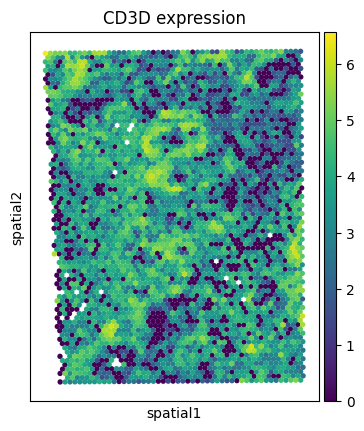

In [40]:
gene = 'CD3D'
sc.pl.spatial(xenium_gt_adata, color=gene, title=f'{gene} expression', spot_size=200)

In [41]:
print((np.max(xenium_gt_adata.obsm['spatial'][:,0]) - np.min(xenium_gt_adata.obsm['spatial'][:,0])) / np.sqrt(xenium_gt_adata.shape[0]))

152.4177069855358


In [42]:
sdm.weight_matrix(xenium_gt_adata, l=500, cutoff=0.2, single_cell=False)

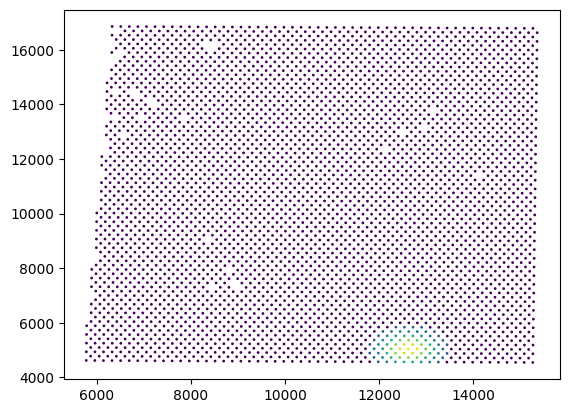

In [43]:
plt.scatter(xenium_gt_adata.obsm['spatial'][:,0], xenium_gt_adata.obsm['spatial'][:,1],
            c=xenium_gt_adata.obsp['weight'].A[50], s=1.0)
plt.show()

In [44]:
print(xenium_gt_adata.obsm['cell_type_gt'].shape)

(3958, 19)


In [45]:
## the first 40 cell types vs the last 40 cell types
res = sdm.utils.Moran_R(
    xenium_gt_adata.obsm['cell_type_gt'].values[:, 0:9], 
    xenium_gt_adata.obsm['cell_type_gt'].values[:, 9:18], 
    xenium_gt_adata.obsp['weight']
)

In [46]:
res

(array([ 0.05493531, -0.02879934,  0.00618837,  0.10744293,  0.01160492,
         0.02903898,  0.58868482,  0.0233783 ,  0.01613598]),
 array([ 28.30334   , -14.83776742,   3.18832467,  55.35589958,
          5.97899501,  14.96123579, 303.29755506,  12.04478429,
          8.31345143]),
 array([1.57190131e-176, 1.00000000e+000, 7.15498822e-004, 0.00000000e+000,
        1.12259220e-009, 6.57800717e-051, 0.00000000e+000, 1.03308093e-033,
        4.64790373e-017]))

In [47]:
res = sdm.utils.Moran_R(
    xenium_gt_adata.obsm['cell_type_gt'].values[:, 0:19], 
    xenium_gt_adata.obsm['cell_type_gt'].values[:, 0:19], 
    xenium_gt_adata.obsp['weight']
)

In [48]:
res

(array([0.12779852, 0.18116127, 0.18020214, 0.53995841, 0.3776068 ,
        0.09645619, 0.73405999, 0.05410047, 0.03823718, 0.15028689,
        0.10275339, 0.03899148, 0.23887058, 0.19538224, 0.08370161,
        0.50716747, 0.58611362, 0.06732392, 0.1067651 ]),
 array([ 65.84334422,  93.33648245,  92.84232602, 278.193117  ,
        194.54759961,  49.69539996, 378.19660509,  27.87321529,
         19.70025972,  77.42962711,  52.93979169,  20.08888494,
        123.0690177 , 100.66329642,  43.12408446, 261.29882675,
        301.97284288,  34.68609952,  55.00667146]),
 array([0.00000000e+000, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
        0.00000000e+000, 0.00000000e+000, 0.00000000e+000, 2.81819846e-171,
        1.07258411e-086, 0.00000000e+000, 0.00000000e+000, 4.61559717e-090,
        0.00000000e+000, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
        0.00000000e+000, 6.38280354e-264, 0.00000000e+000]))

In [49]:
## Any pair of genes
# X = xenium_gt_adata[:, 'CCL21'].X.A
# Y = xenium_gt_adata[:, 'CCR7'].X.A
# sdm.utils.Moran_R(X, Y, xenium_gt_adata.obsp['weight'])

In [50]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

n_cell_types = xenium_gt_adata.obsm['cell_type_gt'].shape[1]
correlation_matrix_xenium = np.zeros((n_cell_types, n_cell_types))

for i in range(n_cell_types):
    for j in range(n_cell_types):
        correlation_matrix_xenium[i, j] = sdm.utils.Moran_R(
            xenium_gt_adata.obsm['cell_type_gt'].values[:, i:i+1], 
            xenium_gt_adata.obsm['cell_type_gt'].values[:, j:j+1], 
            xenium_gt_adata.obsp['weight']
        )[0]

/tmp/ipykernel_70005/1079304528.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  correlation_matrix_xenium[i, j] = sdm.utils.Moran_R(


In [51]:
correlation_matrix0_gt = pd.DataFrame(correlation_matrix_xenium)
correlation_matrix0_gt.index = xenium_gt_adata.obsm['cell_type_gt'].columns
correlation_matrix0_gt.columns = xenium_gt_adata.obsm['cell_type_gt'].columns
correlation_matrix0_gt

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
B Cells,0.127799,0.094979,0.092501,-0.010195,0.024468,-0.018452,-0.125440,0.051983,0.031154,0.054935,0.009699,0.010563,0.064921,0.028338,0.009301,-0.098170,0.016557,0.034533,-0.031139
CD4+ T Cells,0.094979,0.181161,0.147247,-0.040319,0.032321,-0.007260,-0.025166,0.051793,0.052074,0.086343,-0.028799,0.007224,0.048822,0.012968,0.019671,-0.011766,-0.081101,0.037056,0.008409
CD8+ T Cells,0.092501,0.147247,0.180202,-0.022031,0.047236,-0.019419,-0.028984,0.037838,0.044836,0.105473,-0.032474,0.006188,0.092601,0.023183,0.007435,-0.010189,-0.099846,0.050185,0.004759
DCIS 1,-0.010195,-0.040319,-0.022031,0.539958,-0.002092,-0.012082,-0.133619,-0.018061,-0.013485,0.040544,-0.033994,-0.008893,0.107443,0.213274,0.008695,-0.113740,-0.152068,-0.023670,-0.041035
DCIS 2,0.024468,0.032321,0.047236,-0.002092,0.377607,-0.025092,-0.066807,-0.001521,0.001913,0.046909,-0.040234,0.001717,0.160926,0.011605,-0.005960,-0.074055,-0.136852,0.001045,-0.007892
Endothelial,-0.018452,-0.007260,-0.019419,-0.012082,-0.025092,0.096456,-0.000902,-0.003064,-0.010051,-0.011985,0.007180,0.001241,-0.026878,-0.021951,0.029039,-0.000975,0.007341,-0.012639,-0.008242
Invasive Tumor,-0.125440,-0.025166,-0.028984,-0.133619,-0.066807,-0.000902,0.734060,-0.061139,-0.022334,0.040294,-0.128170,-0.042674,-0.146338,-0.094969,0.012058,0.588685,-0.459327,-0.038708,0.162549
IRF7+ DCs,0.051983,0.051793,0.037838,-0.018061,-0.001521,-0.003064,-0.061139,0.054100,0.018860,0.020294,0.011145,0.001613,0.012676,0.005616,0.010703,-0.048710,0.023378,0.014857,-0.017419
LAMP3+ DCs,0.031154,0.052074,0.044836,-0.013485,0.001913,-0.010051,-0.022334,0.018860,0.038237,0.021560,-0.003027,0.004956,0.012646,0.009950,0.002642,-0.014361,-0.006278,0.016136,-0.005408
Macrophages 1,0.054935,0.086343,0.105473,0.040544,0.046909,-0.011985,0.040294,0.020294,0.021560,0.150287,-0.049444,0.002424,0.081423,0.060358,0.012288,0.036685,-0.168089,0.029366,0.022575


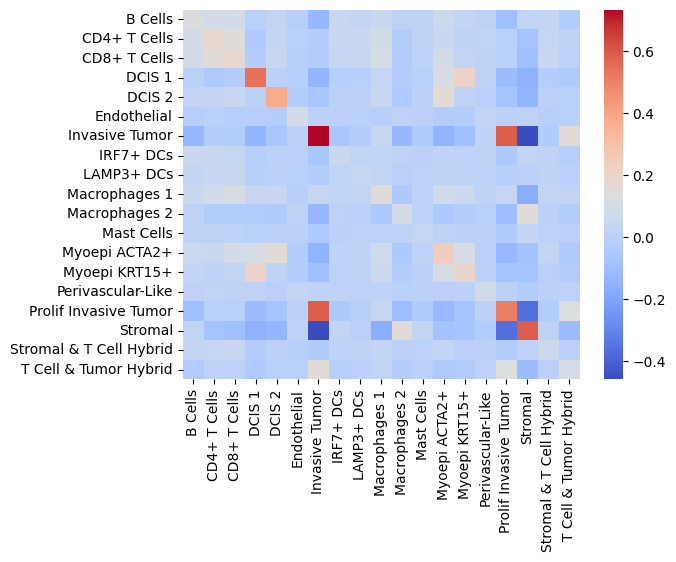

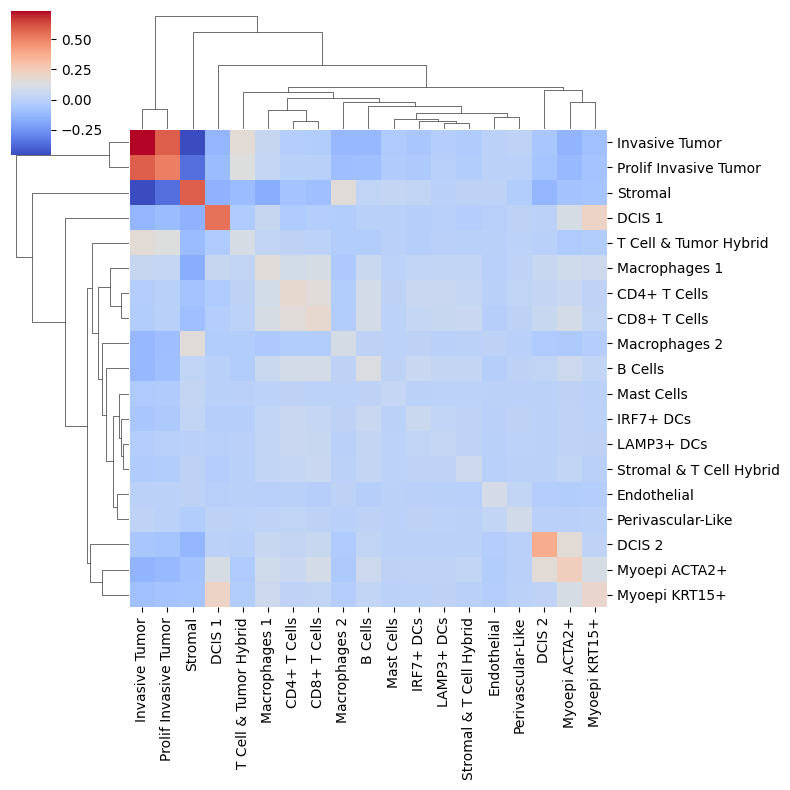

In [47]:
# heatmap
sns.heatmap(correlation_matrix0_gt, cmap="coolwarm")
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/heatmap_xenium.pdf", dpi=300)
plt.show()

sns.clustermap(correlation_matrix0_gt, cmap="coolwarm", figsize=(8,8))
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_xenium.pdf", dpi=300)
plt.show()

In [96]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning, module="numpy.lib.function_base")

def plot_heatmaps_cutoff_cor(combined_corr, cutoff=None, output_file=None):
    fig, ax = plt.subplots(dpi=100)
    
    if cutoff is not None:
        corr1 = combined_corr.copy()
        corr1[corr1 < cutoff] = 0
        
        sns.heatmap(corr1, annot=False, cmap="Greens",
                    xticklabels=corr1.columns, 
                    yticklabels=corr1.columns, vmin=0, vmax=1,
                    linewidth=0.5, linecolor='grey', ax=ax)
        
    else:
        sns.heatmap(combined_corr, annot=False, cmap="coolwarm",
                    xticklabels=combined_corr.columns, 
                    yticklabels=combined_corr.columns, linewidth=.5, linecolor='grey', vmin=0, vmax=1, ax=ax)

    ax.set_title('Cell-cell colocalization')
    ax.tick_params(axis='both', labelsize=12)

    if output_file is not None:
        plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)  
    
    plt.show()

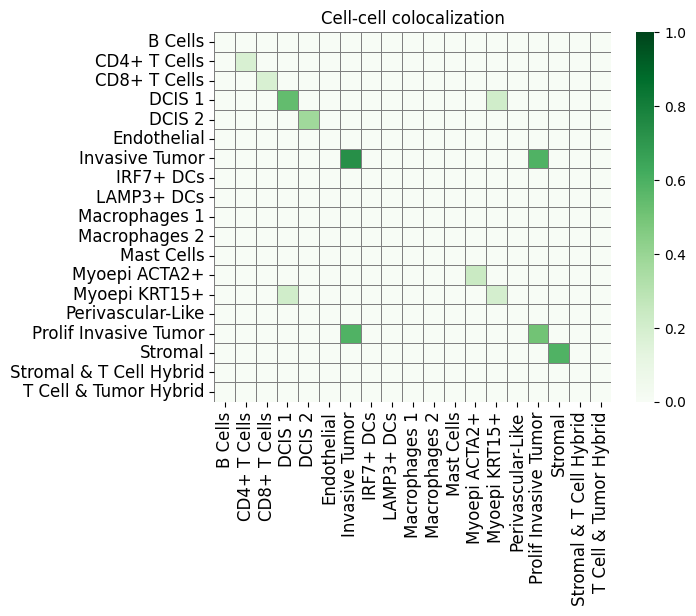

In [143]:
plot_heatmaps_cutoff_cor(correlation_matrix0_gt, cutoff=0.165)

# os.chdir(str(path)+"SpatialData/Data/resultsROIs/")
# plot_heatmaps_cutoff_cor(correlation_matrix0_gt, cutoff=0.165, output_file='clustermap_xenium_green.pdf')

In [48]:
correlation_matrix1 = correlation_matrix0.clip(lower=0.15)

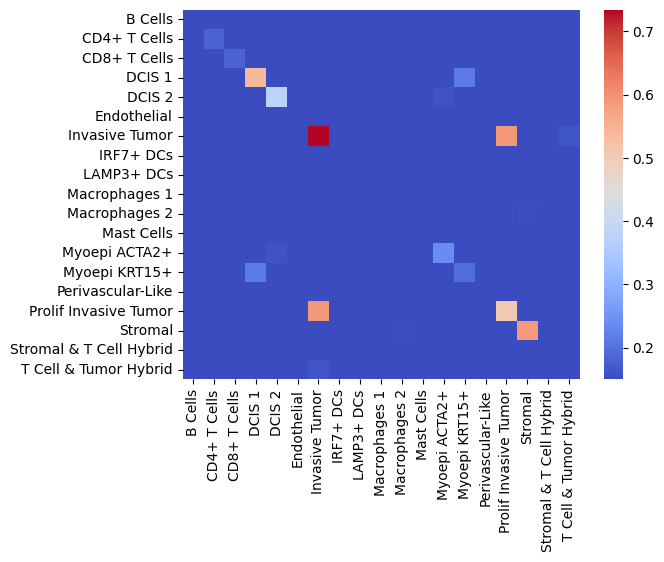

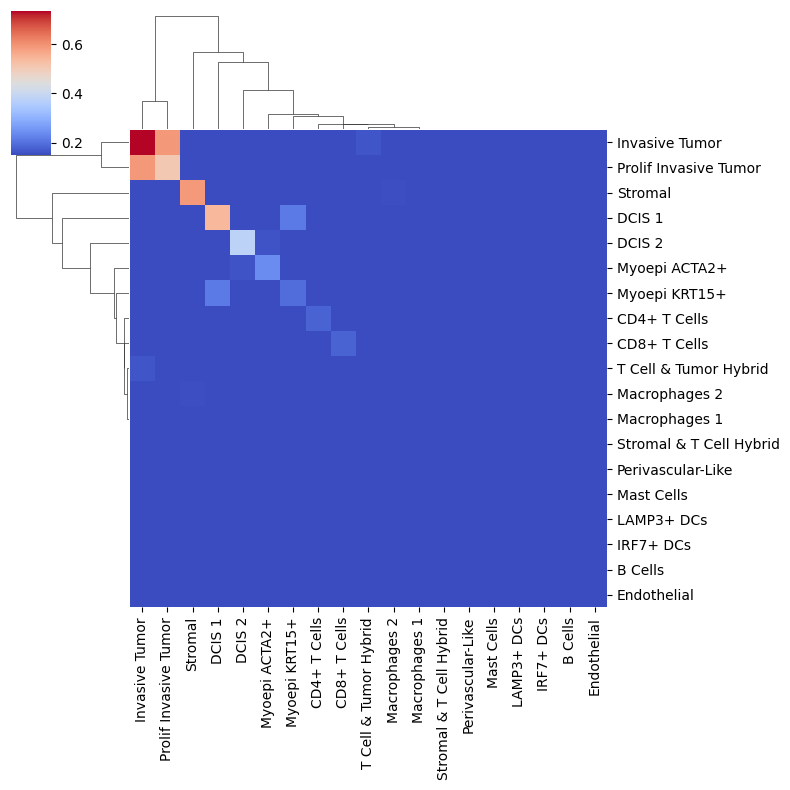

In [229]:
# heatmap
sns.heatmap(correlation_matrix1, cmap="coolwarm")
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/heatmap_xenium_0.pdf", dpi=300)
plt.show()

sns.clustermap(correlation_matrix1, cmap="coolwarm", figsize=(8,8))
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_xenium_0.pdf", dpi=300)
plt.show()

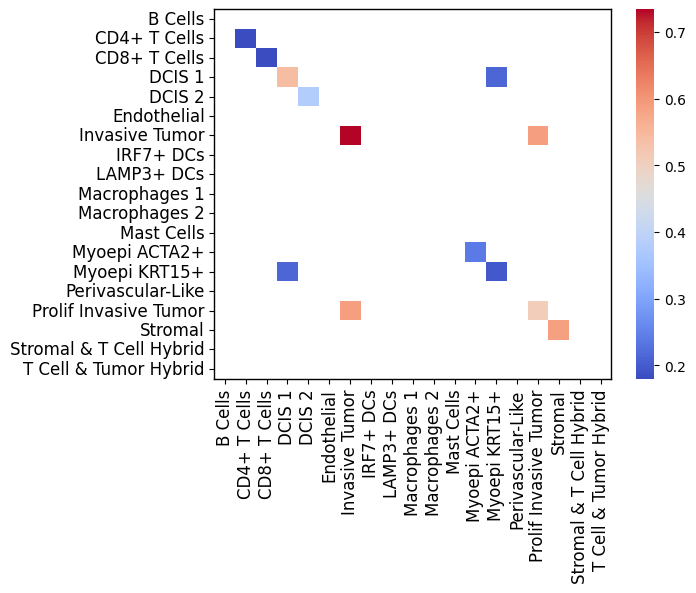

In [340]:
correlation_matrix1 = correlation_matrix0.copy()
correlation_matrix1[correlation_matrix1 < 0.165] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
sns.heatmap(correlation_matrix1, cmap="coolwarm", mask=np.isnan(correlation_matrix1), ax=ax)

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
plt.savefig("heatmap_nature_communications_style.png", dpi=300, bbox_inches='tight')

plt.show()

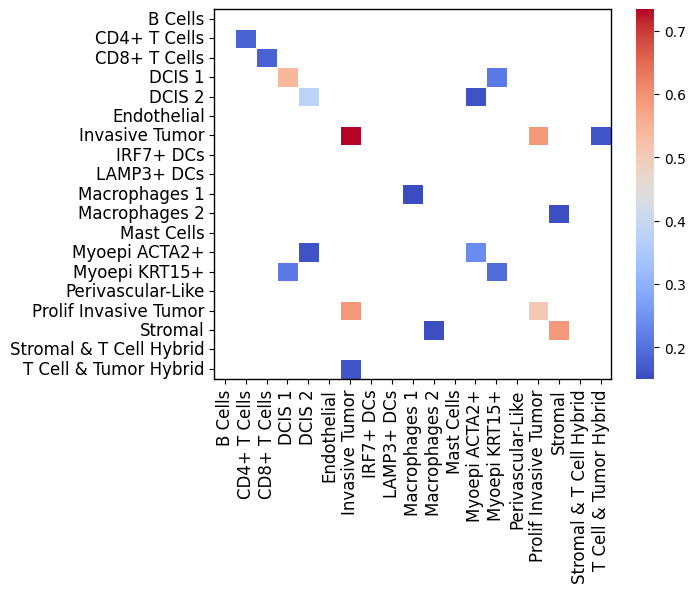

In [136]:
correlation_matrix1 = correlation_matrix0.copy()
correlation_matrix1[correlation_matrix1 < 0.15] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), linewidth=0.5, linecolor='white', ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_xenium_spot_015.pdf", dpi=300)

plt.show()

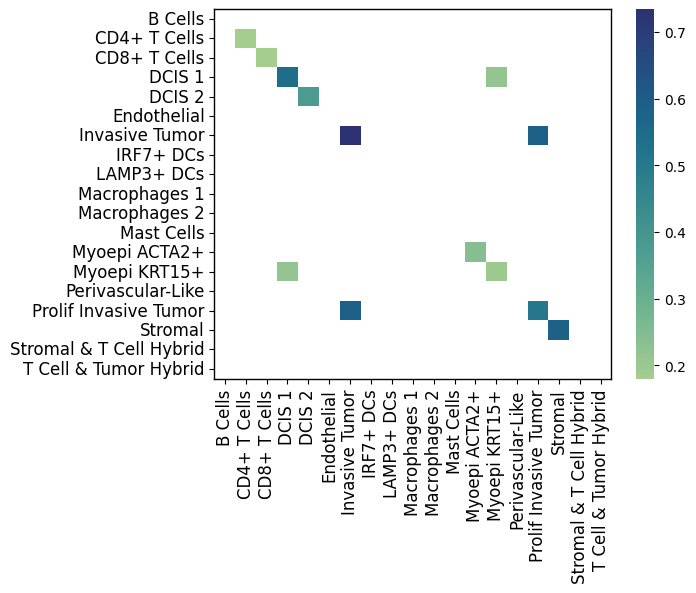

In [138]:
correlation_matrix1 = correlation_matrix0.copy()
correlation_matrix1[correlation_matrix1 < 0.165] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='crest', mask=np.isnan(correlation_matrix1), ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
plt.savefig("heatmap_nature_communications_style.png", dpi=300, bbox_inches='tight')

plt.show()

### For each cell: TransImp reults

In [59]:
os.chdir(str(path)+'SpatialData/Data/')
TransImp_st_adata =  sc.read_h5ad("visium_nuclei_annotated_TransImp_scFFPE.h5ad")
print(TransImp_st_adata)

AnnData object with n_obs × n_vars = 56794 × 863
    obs: 'x', 'y', 'CD70', 'cell_type'
    uns: 'cell_type_colors', 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


In [60]:
TransImp_st_adata.var_names

Index(['TGFB1', 'TGFBR1', 'TGFBR2', 'TGFB2', 'TGFB3', 'ACVR1B', 'ACVR1C',
       'ACVR1', 'BMP2', 'BMPR1A',
       ...
       'TREM2', 'SEMA6A', 'SEMA6B', 'SEMA7A', 'PLXNC1', 'SIGLEC1', 'THY1',
       'VCAM1', 'VSIR', 'IGSF11'],
      dtype='object', length=863)

In [61]:
import os
import pandas as pd
import numpy as np
import anndata as ann

import spatialdm as sdm
from spatialdm.datasets import dataset
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

SpatailDM version: 0.2.0


In [62]:
TransImp_st_adata.X

array([[0.40425495, 1.16219016, 2.33451363, ..., 1.05244276, 0.4736191 ,
        0.02810612],
       [0.59128899, 1.50181989, 2.34426489, ..., 0.97263287, 0.56866008,
        0.06845463],
       [0.51562773, 1.00670426, 3.02505341, ..., 1.26748066, 0.58169874,
        0.01718222],
       ...,
       [0.45760022, 1.25346181, 2.76228758, ..., 1.23356005, 0.57207215,
        0.03220873],
       [0.40667675, 1.1378531 , 2.29932282, ..., 0.98193927, 0.41145122,
        0.02727244],
       [0.8143672 , 1.36094417, 2.10147336, ..., 0.75836002, 0.68074726,
        0.07975226]])

In [63]:
TransImp_st_adata.var_names_make_unique()
## Normalize and log transform the data
sc.pp.normalize_total(TransImp_st_adata, target_sum=5e4)
sc.pp.log1p(TransImp_st_adata)

In [64]:
len(set(TransImp_st_adata.obs['cell_type']))

19

In [65]:
cell_type_gt_order = ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2',
       'Endothelial', 'Invasive Tumor', 'IRF7+ DCs', 'LAMP3+ DCs',
       'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+',
       'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor',
       'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid']
len(cell_type_gt_order)

19

In [66]:
TransImp_st_adata.obsm['cell_type_gt'] = TransImp_st_adata.obsm['TransImp_ct_pred'][cell_type_gt_order]
TransImp_st_adata.obsm['cell_type_gt']

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
0,0.020999,0.009664,0.000032,0.057794,0.092440,0.034351,0.056338,2.193886e-02,1.811731e-32,0.039945,5.894199e-02,1.358790e-02,0.031640,2.147609e-04,0.008993,8.860889e-02,0.072580,3.846592e-38,3.919322e-01
1,0.026572,0.033057,0.055618,0.068899,0.050312,0.061285,0.104642,1.485761e-02,1.727045e-01,0.040627,3.689192e-35,3.092788e-25,0.057588,2.676899e-02,0.017823,2.197253e-01,0.044339,2.956557e-03,2.225852e-03
2,0.029271,0.055263,0.040893,0.041762,0.003128,0.065479,0.133937,0.000000e+00,0.000000e+00,0.071605,8.864376e-02,1.889648e-02,0.018944,1.517219e-04,0.105487,1.985221e-01,0.127995,2.692574e-32,2.254398e-05
3,0.030966,0.000139,0.027104,0.024763,0.055751,0.039874,0.064198,2.252682e-02,0.000000e+00,0.053287,3.190877e-02,3.581614e-02,0.041357,3.777746e-02,0.009754,2.382339e-39,0.043968,4.764877e-01,4.321317e-03
4,0.027450,0.017094,0.000040,0.026154,0.034391,0.050077,0.052452,4.900072e-03,2.742902e-41,0.070099,2.186429e-02,1.728059e-02,0.019275,7.268857e-40,0.106917,1.192356e-01,0.086199,8.602553e-11,3.465714e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56789,0.016021,0.059350,0.064454,0.084373,0.056322,0.050004,0.090629,1.330796e-02,9.713288e-35,0.058251,4.269344e-02,6.374297e-02,0.051521,9.687363e-02,0.056374,1.156075e-01,0.080476,6.861241e-28,1.899608e-09
56790,0.031568,0.062917,0.042134,0.034147,0.078602,0.075035,0.113676,1.696153e-32,3.230007e-08,0.085280,7.856265e-02,1.802295e-02,0.008954,2.148622e-16,0.133612,1.044050e-01,0.133082,2.644922e-06,1.195204e-18
56791,0.025382,0.044666,0.049324,0.018347,0.078749,0.069519,0.103785,1.620940e-02,1.553305e-25,0.059470,4.266877e-02,6.652525e-03,0.055512,5.063962e-30,0.040124,2.940997e-01,0.095492,7.064975e-25,8.392832e-19
56792,0.022762,0.048667,0.045403,0.062971,0.095125,0.053738,0.116320,3.824403e-03,0.000000e+00,0.043863,6.491655e-02,6.378558e-03,0.053707,1.265070e-06,0.003097,2.902030e-01,0.089022,5.613986e-35,1.546929e-06


/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


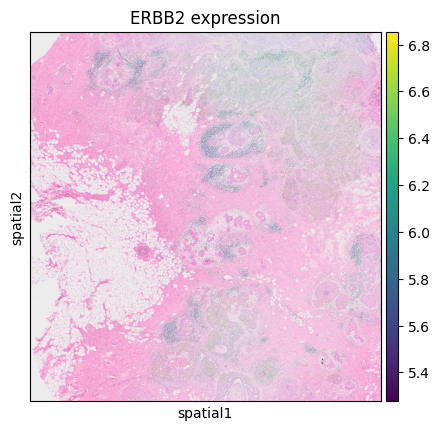

In [67]:
gene = 'ERBB2'
sc.pl.spatial(TransImp_st_adata, color=gene, title=f'{gene} expression', spot_size=10)

In [68]:
print((np.max(TransImp_st_adata.obsm['spatial'][:,0]) - np.min(TransImp_st_adata.obsm['spatial'][:,0])) / np.sqrt(TransImp_st_adata.shape[0]))

49.531099914981695


In [69]:
sdm.weight_matrix(TransImp_st_adata, l=500, cutoff=0.2, single_cell=False)

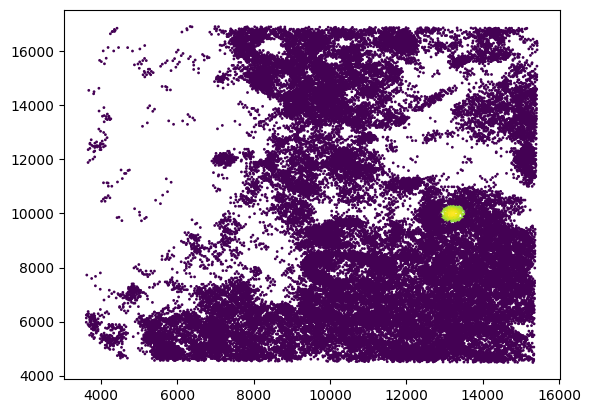

In [70]:
plt.scatter(TransImp_st_adata.obsm['spatial'][:,0], TransImp_st_adata.obsm['spatial'][:,1],
            c=TransImp_st_adata.obsp['weight'].A[50], s=1.0)
plt.show()

In [71]:
print(TransImp_st_adata.obsm['TransImp_ct_pred'].shape)

(56794, 19)


In [72]:
## the first 40 cell types vs the last 40 cell types
res = sdm.utils.Moran_R(
    TransImp_st_adata.obsm['TransImp_ct_pred'].values[:, 0:9], 
    TransImp_st_adata.obsm['TransImp_ct_pred'].values[:, 9:18], 
    TransImp_st_adata.obsp['weight']
)

In [73]:
res

(array([ 0.22353589,  0.07097354,  0.11873781,  0.14884978,  0.01381907,
         0.28173808, -0.16320299,  0.16161518,  0.01536833]),
 array([ 767.62814949,  243.72499779,  407.74877227,  511.15405326,
          47.45503463,  967.49598044, -560.4433868 ,  554.99079123,
          52.77525384]),
 array([0., 0., 0., 0., 0., 0., 1., 0., 0.]))

In [74]:
## Any pair of genes
# X = TransImp_st_adata[:, 'CCL21'].X.A
# Y = TransImp_st_adata[:, 'CCR7'].X.A
# sdm.utils.Moran_R(X, Y, TransImp_st_adata.obsp['weight'])

In [75]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

n_cell_types = TransImp_st_adata.obsm['cell_type_gt'].shape[1]
correlation_matrix_TransImp_cell = np.zeros((n_cell_types, n_cell_types))

for i in range(n_cell_types):
    for j in range(n_cell_types):
        correlation_matrix_TransImp_cell[i, j] = sdm.utils.Moran_R(
            TransImp_st_adata.obsm['TransImp_ct_pred'].values[:, i:i+1], 
            TransImp_st_adata.obsm['TransImp_ct_pred'].values[:, j:j+1], 
            TransImp_st_adata.obsp['weight']
        )[0]

/tmp/ipykernel_1276055/3846978406.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  correlation_matrix_TransImp_cell[i, j] = sdm.utils.Moran_R(


In [139]:
correlation_matrix0 = pd.DataFrame(correlation_matrix_TransImp_cell)
correlation_matrix0.index = TransImp_st_adata.obsm['TransImp_ct_pred'].columns
correlation_matrix0.columns = TransImp_st_adata.obsm['TransImp_ct_pred'].columns
correlation_matrix0

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,IRF7+ DCs,Invasive Tumor,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
B Cells,0.865351,0.514961,0.347910,-0.301958,-0.097143,-0.179145,0.391038,-0.376379,0.135539,0.223536,-0.027997,0.213069,-0.008007,-0.038162,-0.090504,-0.270746,0.034756,-0.073189,-0.025507
CD4+ T Cells,0.516981,0.653195,0.338645,-0.332697,-0.123986,0.016136,0.320205,-0.245515,0.177304,0.267688,0.070974,0.174427,-0.125023,-0.131025,0.016898,-0.241588,0.156382,-0.150517,-0.027340
CD8+ T Cells,0.350092,0.339820,0.573244,-0.201411,-0.061032,-0.130742,0.216413,-0.269484,0.122530,0.281062,-0.051324,0.118738,0.068071,-0.049227,-0.075374,-0.230805,0.064985,-0.033737,-0.035208
DCIS 1,-0.296376,-0.323987,-0.193275,0.910412,0.046562,-0.254537,-0.189711,-0.130567,-0.086058,-0.260688,-0.138994,-0.105904,0.148850,0.549199,-0.236339,-0.143946,-0.273673,0.034121,-0.089743
DCIS 2,-0.105191,-0.137237,-0.073164,0.060717,0.659669,-0.157061,-0.124678,-0.188582,-0.085926,-0.064164,-0.054956,-0.025879,0.223565,0.013819,-0.164420,-0.057501,-0.081047,0.012724,-0.016094
Endothelial,-0.168513,0.022554,-0.122103,-0.260328,-0.158147,0.631520,-0.178087,0.445706,-0.200071,0.092887,0.220331,-0.036400,-0.225635,-0.326504,0.281738,0.168422,0.281159,-0.062492,0.013888
IRF7+ DCs,0.396488,0.320897,0.211697,-0.193012,-0.119229,-0.184354,0.670796,-0.246305,0.141399,0.071287,-0.036066,0.078867,-0.052633,-0.039145,-0.048864,-0.163203,-0.035072,-0.046706,-0.009532
Invasive Tumor,-0.365240,-0.235647,-0.261478,-0.125502,-0.195013,0.447397,-0.237718,0.718015,-0.179479,-0.074494,0.162687,-0.190114,-0.262484,-0.279620,0.253656,0.322789,0.161615,0.045965,-0.042665
LAMP3+ DCs,0.154353,0.197322,0.141463,-0.095865,-0.088421,-0.214368,0.157667,-0.196540,0.617968,-0.038476,-0.184408,-0.010169,-0.007594,-0.016227,-0.104945,-0.065881,-0.203893,0.015368,-0.044199
Macrophages 1,0.208234,0.258879,0.274070,-0.259643,-0.045636,0.095640,0.062626,-0.073672,-0.055977,0.483668,-0.002361,0.090649,0.015837,-0.168611,0.073430,-0.163592,0.200650,-0.046650,0.028185


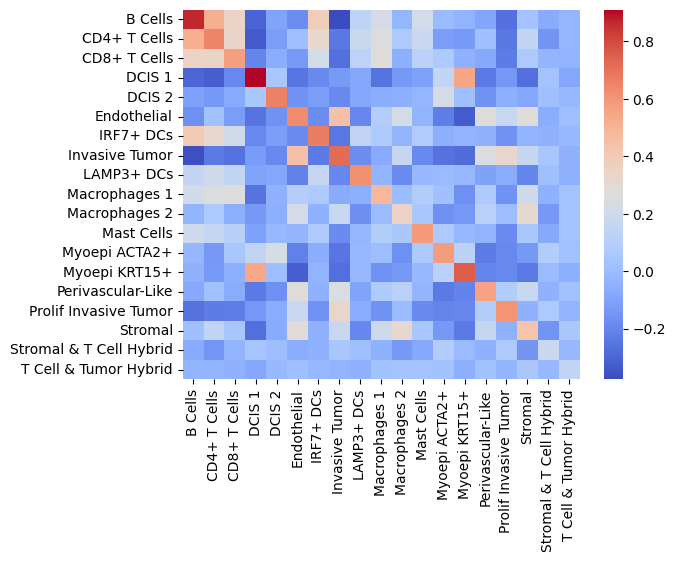

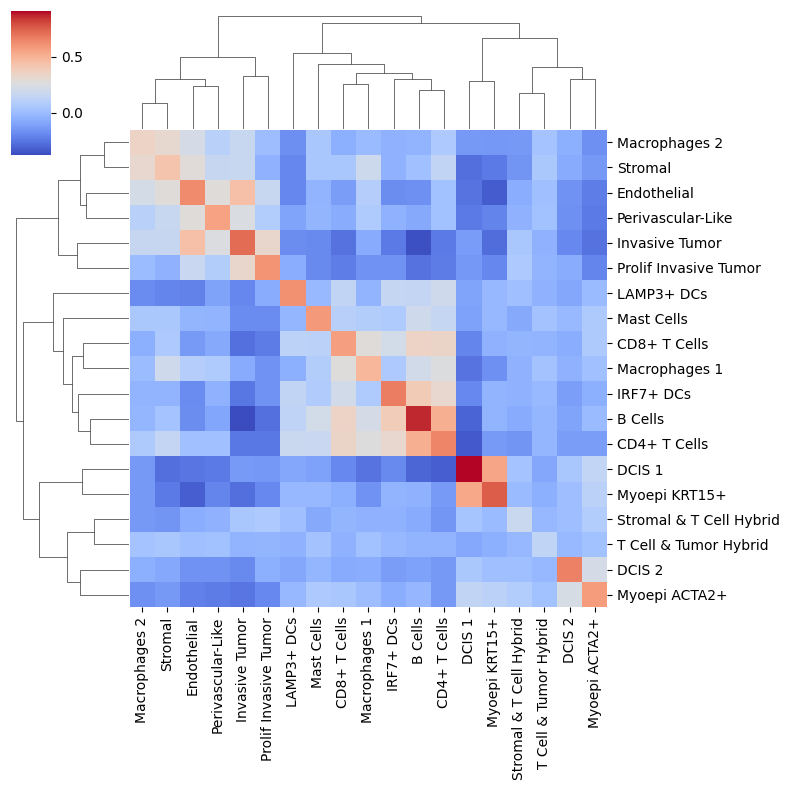

In [237]:
# heatmap
sns.heatmap(correlation_matrix0, cmap="coolwarm")
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/heatmap_TransImp_nuclei.pdf", dpi=300)
plt.show()

sns.clustermap(correlation_matrix0, cmap="coolwarm", figsize=(8,8))
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_nuclei.pdf", dpi=300)
plt.show()

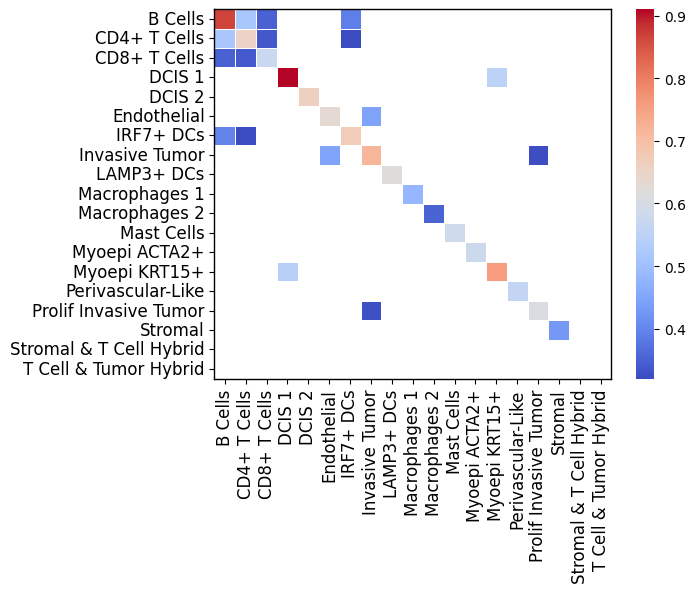

In [141]:
correlation_matrix1 = correlation_matrix0.copy()
correlation_matrix1[correlation_matrix1 < 0.32] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), linewidth=0.5, linecolor='white', ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_cell_010.pdf", dpi=300)

plt.show()

### For each spot: TransImp reults

In [118]:
## input original adata 
import os
import scanpy as sc
os.chdir(str(path)+'SpatialData/Data/')

st_adata = sc.read_h5ad("nuclei_spotbinned_adata_TransImp.h5ad")
st_adata

AnnData object with n_obs × n_vars = 3493 × 14148
    obs: 'in_tissue', 'array_row', 'array_col', '_indices', '_scvi_batch', '_scvi_labels', 'B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2', 'Endothelial', 'IRF7+ DCs', 'Invasive Tumor', 'LAMP3+ DCs', 'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+', 'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor', 'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'cell_type_TransImp', 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [119]:
st_adata.obsm['cell_type_TransImp']

,Macrophages 1,Mast Cells,T Cell & Tumor Hybrid,Invasive Tumor,Stromal & T Cell Hybrid,Myoepi KRT15+,DCIS 2,Myoepi ACTA2+,Prolif Invasive Tumor,IRF7+ DCs,Macrophages 2,LAMP3+ DCs,Stromal,CD8+ T Cells,CD4+ T Cells,Perivascular-Like,DCIS 1,B Cells,Endothelial
GGTTAGCACGCCTATG-1,0.0,0.000000,0.000000,0.428571,0.000000,0.0,0.0,0.0,0.476190,0.0,0.000000,0.000000,0.095238,0.000000,0.000000,0.0,0.0,0.000000,0.0
TCCGAATACCGAATAG-1,0.0,0.000000,0.103448,0.517241,0.068966,0.0,0.0,0.0,0.275862,0.0,0.000000,0.000000,0.034483,0.000000,0.000000,0.0,0.0,0.000000,0.0
ATAACGCCTGTAGGCA-1,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.000000,0.0
ACATCGCCACAAGAGG-1,0.0,0.000000,0.025316,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.037975,0.000000,0.000000,0.000000,0.0,0.0,0.936709,0.0
CGGTCAACGGCGGATT-1,0.0,0.000000,0.000000,0.187500,0.687500,0.0,0.0,0.0,0.125000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTGCTCATTAGAGTGC-1,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
CCTATGTCTTACCGGC-1,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.000000,0.0
AAGCACTCAGGAATGT-1,0.0,0.000000,0.250000,0.083333,0.333333,0.0,0.0,0.0,0.333333,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
GAACGCCAGTGCATAC-1,0.0,0.181818,0.545455,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.272727,0.000000,0.000000,0.0,0.0,0.000000,0.0


In [120]:
cell_type_gt_order = ['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2',
       'Endothelial', 'Invasive Tumor', 'IRF7+ DCs', 'LAMP3+ DCs',
       'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+',
       'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor',
       'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid']
len(cell_type_gt_order)

19

In [121]:
import os
import pandas as pd
import numpy as np
import anndata as ann

import spatialdm as sdm
from spatialdm.datasets import dataset
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

SpatailDM version: 0.2.0


In [122]:
st_adata.obsm['cell_type_TransImp'] = st_adata.obsm['cell_type_TransImp'][cell_type_gt_order]
st_adata.obsm['cell_type_TransImp']

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
GGTTAGCACGCCTATG-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.428571,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.476190,0.095238,0.000000,0.000000
TCCGAATACCGAATAG-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.517241,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.275862,0.034483,0.068966,0.103448
ATAACGCCTGTAGGCA-1,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
ACATCGCCACAAGAGG-1,0.936709,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.037975,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.025316
CGGTCAACGGCGGATT-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.187500,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.125000,0.000000,0.687500,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTGCTCATTAGAGTGC-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.000000,0.000000
CCTATGTCTTACCGGC-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000
AAGCACTCAGGAATGT-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.083333,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.333333,0.000000,0.333333,0.250000
GAACGCCAGTGCATAC-1,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.181818,0.0,0.0,0.0,0.000000,0.272727,0.000000,0.545455


In [123]:
st_adata.X.todense()

matrix([[ 6,  0,  0, ...,  1,  4,  1],
        [39,  0,  0, ...,  1,  8,  4],
        [19,  0,  0, ...,  1,  3,  0],
        ...,
        [41,  0,  2, ...,  2, 17,  3],
        [13,  0,  0, ...,  0,  4,  0],
        [13,  0,  3, ...,  1, 11,  1]])

In [124]:
st_adata.obsm['spatial']

array([[ 8699,  4919],
       [12083,  5687],
       [13167, 16006],
       ...,
       [15300,  8363],
       [11046, 13321],
       [ 8047, 15092]])

In [125]:
print((np.max(st_adata.obsm['spatial'][:,0]) - np.min(st_adata.obsm['spatial'][:,0])) / np.sqrt(st_adata.shape[0]))

197.6257585749723


In [126]:
sdm.weight_matrix(st_adata, l=500, cutoff=0.2, single_cell=False)

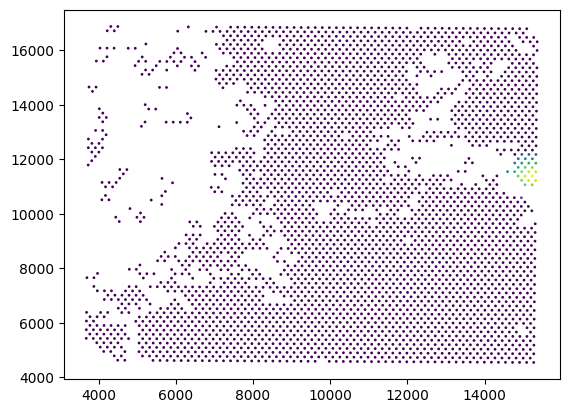

In [127]:
plt.scatter(st_adata.obsm['spatial'][:,0], st_adata.obsm['spatial'][:,1],
            c=st_adata.obsp['weight'].A[50], s=1.0)
plt.show()

In [128]:
st_adata.var_names_make_unique()
## Normalize and log transform the data
sc.pp.normalize_total(st_adata, target_sum=5e4)
sc.pp.log1p(st_adata)

/mnt/lingyu/nfs_share2/env/envs/xenium-publication-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


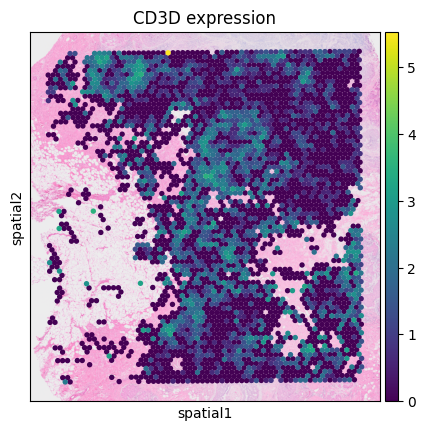

In [129]:
gene = 'CD3D'
sc.pl.spatial(st_adata, color=gene, title=f'{gene} expression', spot_size=200)

In [130]:
## the first 40 cell types vs the last 40 cell types
res = sdm.utils.Moran_R(
    st_adata.obsm['q05_cell_abundance_w_sf'].values[:, 0:19], 
    st_adata.obsm['q05_cell_abundance_w_sf'].values[:, 0:19], 
    st_adata.obsp['weight']
)

In [131]:
res

(array([0.21732991, 0.28887852, 0.3299978 , 0.59687851, 0.52164696,
        0.20457256, 0.28939294, 0.76597837, 0.27397442, 0.21107719,
        0.36734229, 0.16898516, 0.29045959, 0.27828647, 0.26552146,
        0.73137468, 0.46879019, 0.48164322, 0.49158611]),
 array([ 98.57412009, 131.02635243, 149.67678653, 270.72561685,
        236.6029134 ,  92.78778105, 131.25967737, 347.42407983,
        124.26631525,  95.73808158, 166.61509068,  76.64643905,
        131.74347777, 126.22213053, 120.43231706, 331.72891403,
        212.6287184 , 218.45845319, 222.96824346]),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.]))

In [132]:
## Any pair of genes
# X = st_adata[:, 'CCL21'].X.A
# Y = st_adata[:, 'CCR7'].X.A
# sdm.utils.Moran_R(X, Y, st_adata.obsp['weight'])

In [133]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

n_cell_types = st_adata.obsm['cell_type_TransImp'].shape[1]
correlation_matrix_TransImp = np.zeros((n_cell_types, n_cell_types))

for i in range(n_cell_types):
    for j in range(n_cell_types):
        correlation_matrix_TransImp[i, j] = sdm.utils.Moran_R(
            st_adata.obsm['cell_type_TransImp'].values[:, i:i+1], 
            st_adata.obsm['cell_type_TransImp'].values[:, j:j+1], 
            st_adata.obsp['weight']
        )[0]

/tmp/ipykernel_70005/141824960.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  correlation_matrix_TransImp[i, j] = sdm.utils.Moran_R(


In [134]:
len(st_adata.obsm['cell_type_TransImp'].columns)
st_adata.obsm['cell_type_TransImp'].columns

Index(['B Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'DCIS 1', 'DCIS 2',
       'Endothelial', 'Invasive Tumor', 'IRF7+ DCs', 'LAMP3+ DCs',
       'Macrophages 1', 'Macrophages 2', 'Mast Cells', 'Myoepi ACTA2+',
       'Myoepi KRT15+', 'Perivascular-Like', 'Prolif Invasive Tumor',
       'Stromal', 'Stromal & T Cell Hybrid', 'T Cell & Tumor Hybrid'],
      dtype='object')

In [135]:
correlation_matrix0 = pd.DataFrame(correlation_matrix_TransImp)
correlation_matrix0.index = st_adata.obsm['cell_type_TransImp'].columns
correlation_matrix0.columns = st_adata.obsm['cell_type_TransImp'].columns
correlation_matrix0

,B Cells,CD4+ T Cells,CD8+ T Cells,DCIS 1,DCIS 2,Endothelial,Invasive Tumor,IRF7+ DCs,LAMP3+ DCs,Macrophages 1,Macrophages 2,Mast Cells,Myoepi ACTA2+,Myoepi KRT15+,Perivascular-Like,Prolif Invasive Tumor,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid
B Cells,0.286562,0.041703,0.013636,-0.055889,-0.002583,0.004774,-0.067529,0.047452,0.025573,0.007127,-0.010784,0.007474,0.024418,0.016416,-0.015825,-0.058282,0.010269,-0.025434,-0.002279
CD4+ T Cells,0.041703,0.129434,0.049805,-0.055977,0.027717,0.001423,-0.029510,0.037929,0.048462,-0.003414,-0.012792,0.000006,-0.014627,-0.025425,0.006580,-0.032868,0.024690,-0.033851,0.007775
CD8+ T Cells,0.013636,0.049805,0.181348,-0.050509,0.028705,-0.003207,-0.075043,0.022380,0.021879,0.018347,-0.009370,0.009243,0.050456,-0.012153,-0.003062,-0.061772,0.052999,-0.002797,0.017818
DCIS 1,-0.055889,-0.055977,-0.050509,0.659876,-0.113186,0.000867,-0.183657,-0.008115,0.016706,-0.007599,-0.014204,-0.003286,-0.042611,0.167642,-0.021696,-0.151527,-0.105480,-0.010949,-0.096718
DCIS 2,-0.002583,0.027717,0.028705,-0.113186,0.506300,-0.005856,-0.123974,-0.004614,-0.010108,-0.007353,-0.032002,-0.014290,0.026508,-0.049162,-0.009842,-0.113826,-0.036658,-0.033074,0.001887
Endothelial,0.004774,0.001423,-0.003207,0.000867,-0.005856,0.027671,-0.006530,0.001142,0.008403,0.005187,-0.003222,-0.001124,0.002637,-0.004037,0.007791,-0.002388,0.005075,0.005942,-0.006029
Invasive Tumor,-0.067529,-0.029510,-0.075043,-0.183657,-0.123974,-0.006530,0.496409,-0.057533,-0.067620,-0.052350,-0.051284,-0.028043,-0.085323,-0.091490,-0.018921,0.232126,-0.133114,-0.019746,-0.070604
IRF7+ DCs,0.047452,0.037929,0.022380,-0.008115,-0.004614,0.001142,-0.057533,0.098144,0.054962,0.021847,-0.001538,0.000441,-0.000757,0.005989,0.003332,-0.050360,0.012078,-0.003970,0.011497
LAMP3+ DCs,0.025573,0.048462,0.021879,0.016706,-0.010108,0.008403,-0.067620,0.054962,0.166521,0.028786,-0.015214,0.023305,0.008956,-0.001245,-0.005265,-0.052004,-0.014975,0.015240,-0.014999
Macrophages 1,0.007127,-0.003414,0.018347,-0.007599,-0.007353,0.005187,-0.052350,0.021847,0.028786,0.095346,-0.009113,0.006226,0.033563,0.012805,0.015799,-0.028616,0.017817,0.024594,-0.003331


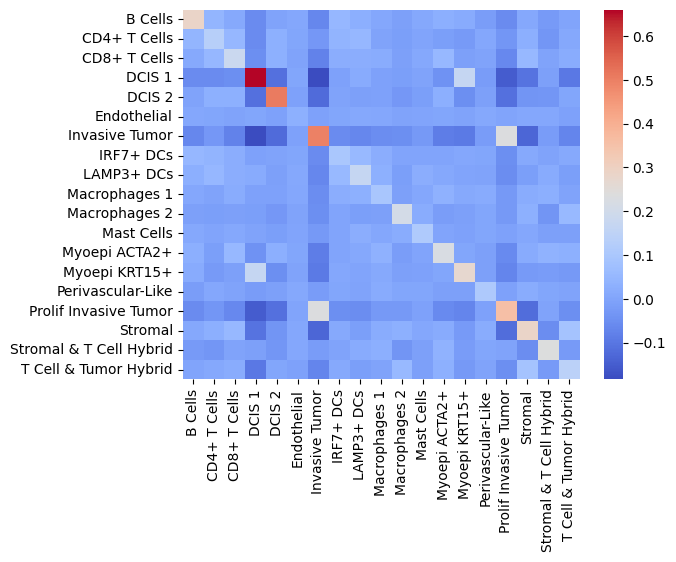

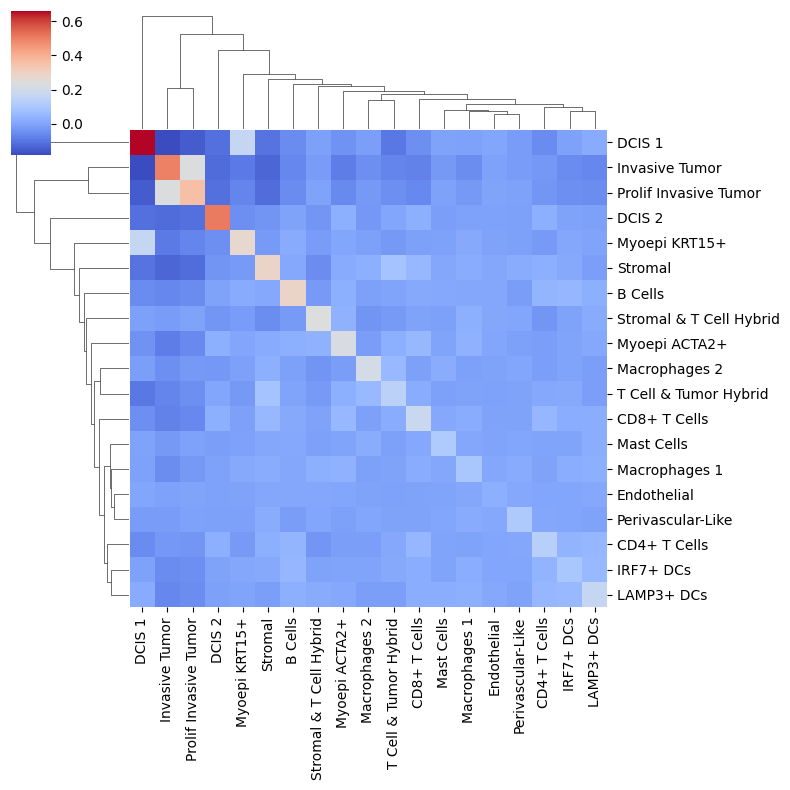

In [23]:
# heatmap
sns.heatmap(correlation_matrix0, cmap="coolwarm")
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/heatmap_TransImp_spot.pdf", dpi=300)
plt.show()

sns.clustermap(correlation_matrix0, cmap="coolwarm", figsize=(8,8))
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_spot.pdf", dpi=300)
plt.show()

In [14]:
!pwd

/mnt/lingyu/nfs_share2/Python/SpatialData/Data


In [136]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning, module="numpy.lib.function_base")

def plot_heatmaps_cutoff_cor(combined_corr, cutoff=None, output_file=None):
    fig, ax = plt.subplots(dpi=100)
    
    if cutoff is not None:
        corr1 = combined_corr.copy()
        corr1[corr1 < cutoff] = 0
        
        sns.heatmap(corr1, annot=False, cmap="Greens",
                    xticklabels=corr1.columns, 
                    yticklabels=corr1.columns, vmin=0, vmax=1,
                    linewidth=0.5, linecolor='grey', ax=ax)
        
    else:
        sns.heatmap(combined_corr, annot=False, cmap="coolwarm",
                    xticklabels=combined_corr.columns, 
                    yticklabels=combined_corr.columns, linewidth=.5, linecolor='grey', vmin=0, vmax=1, ax=ax)

    ax.set_title('Cell-cell colocalization')
    ax.tick_params(axis='both', labelsize=12)

    if output_file is not None:
        plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)  
    
    plt.show()

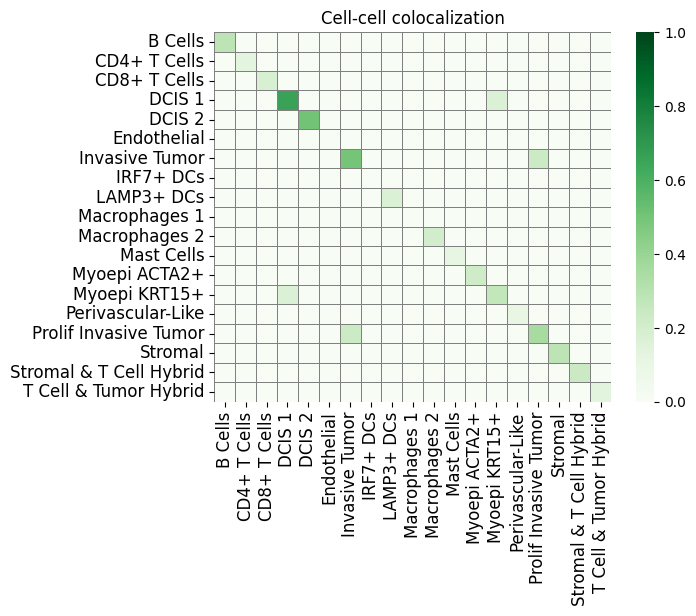

In [142]:
plot_heatmaps_cutoff_cor(correlation_matrix0, cutoff=0.10)

# os.chdir(str(path)+"SpatialData/Data/resultsROIs/")
# plot_heatmaps_cutoff_cor(correlation_matrix0, cutoff=0.10, output_file='clustermap_TransImp_spot_green.pdf')

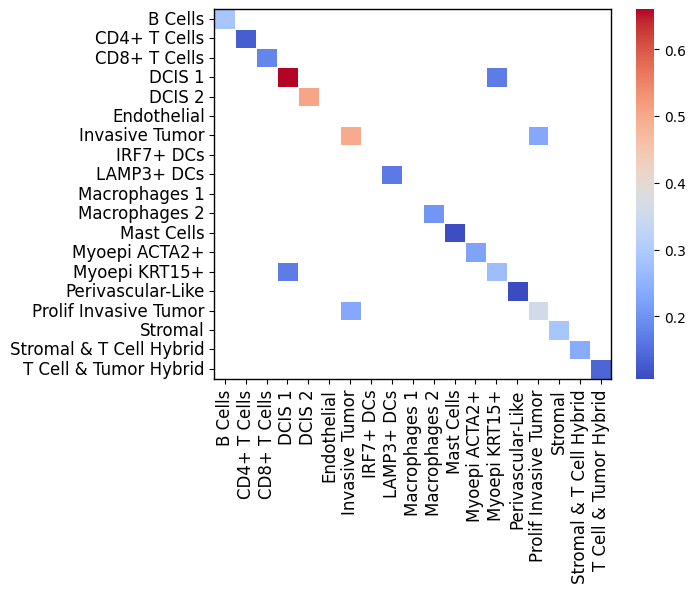

In [23]:
correlation_matrix1 = correlation_matrix0.copy()
correlation_matrix1[correlation_matrix1 < 0.10] = 0
correlation_matrix1[correlation_matrix1 == 0] = np.nan

fig, ax = plt.subplots()
## sns.cubehelix_palette(as_cmap=True), 'crest', 'Reds'
sns.heatmap(correlation_matrix1, cmap='coolwarm', mask=np.isnan(correlation_matrix1), linewidth=0.5, linecolor='white', ax=ax)   # annot=True,

for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

ax.tick_params(axis='both', labelsize=12)
cbar = ax.collections[0].colorbar
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_spot_010.pdf", dpi=300)

plt.show()

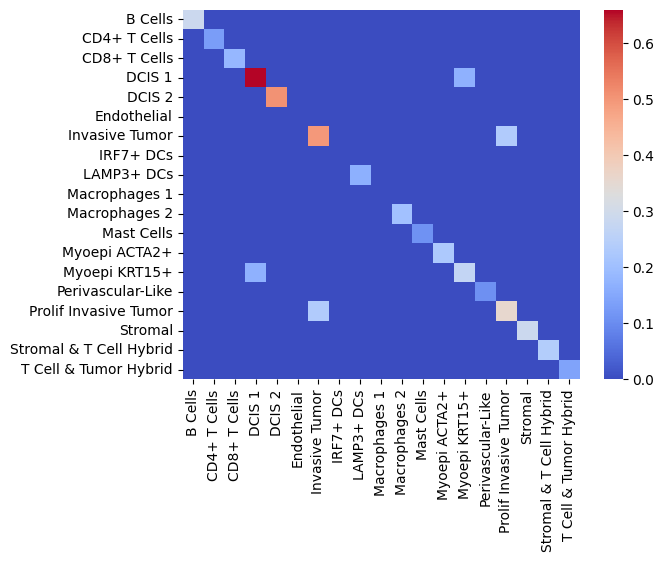

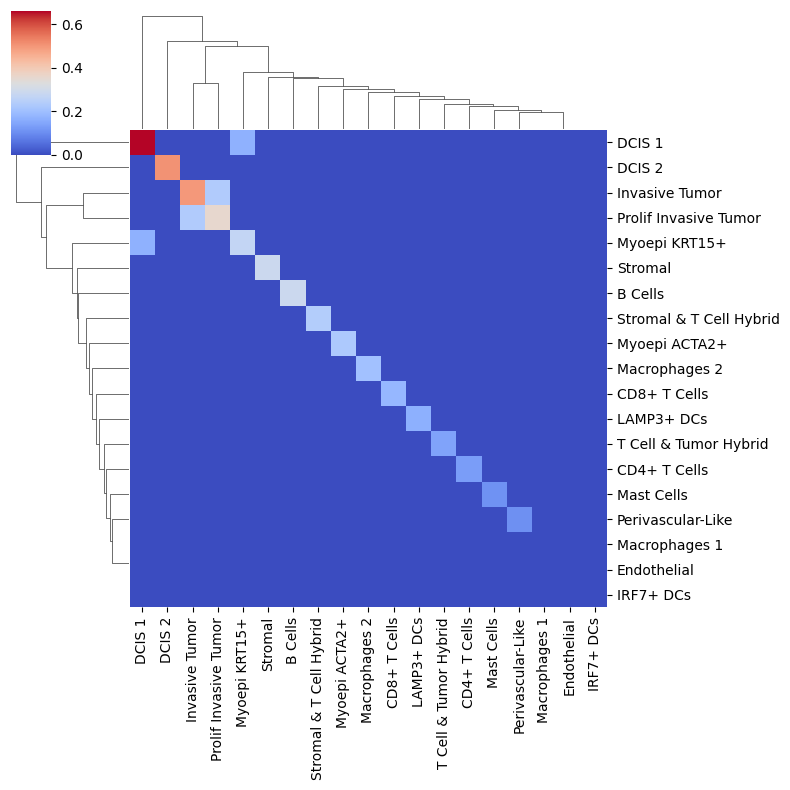

In [327]:
# heatmap
sns.heatmap(correlation_matrix1, cmap="coolwarm")
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/heatmap_TransImp_spot_0.pdf", dpi=300)
plt.show()

sns.clustermap(correlation_matrix1, cmap="coolwarm", figsize=(8,8))
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/clustermap_TransImp_spot_0.pdf", dpi=300)
plt.show()

## Compare ROI prop

In [1]:
import os
# path = '/Users/lilingyu/E/PhD/Python/'
# path = '/storage3/yhhuang/users/lingyu/'
# path = '/data/users/lingyu/'
# path = '/home/lly/Python/'
path = '/mnt/lingyu/nfs_share2/Python/'

In [2]:
## Load data
import os
import numpy as np
import pandas as pd
os.chdir(str(path)+'SpatialData/Data/resultsROIs/')

In [3]:
# celltype_xeniumgt_ROI1 = pd.read_csv('celltype_xeniumgt_ROI1.csv', index_col=0)*14146
celltype_xeniumgt_ROI1 = pd.read_csv('celltype_xeniumgt_ROI1.csv', index_col=0)
celltype_xeniumgt_ROI2 = pd.read_csv('celltype_xeniumgt_ROI2.csv', index_col=0)
celltype_xeniumgt_ROI3 = pd.read_csv('celltype_xeniumgt_ROI3.csv', index_col=0)
celltype_xeniumgt_ROI4 = pd.read_csv('celltype_xeniumgt_ROI4.csv', index_col=0)

# celltype_TransImpsc_ROI1 = pd.read_csv('celltype_TransImpsc_ROI1.csv', index_col=0)*5617
celltype_TransImpsc_ROI1 = pd.read_csv('celltype_TransImpsc_ROI1.csv', index_col=0)
celltype_TransImpsc_ROI2 = pd.read_csv('celltype_TransImpsc_ROI2.csv', index_col=0)
celltype_TransImpsc_ROI3 = pd.read_csv('celltype_TransImpsc_ROI3.csv', index_col=0)
celltype_TransImpsc_ROI4 = pd.read_csv('celltype_TransImpsc_ROI4.csv', index_col=0)

celltype_Visiumspot_ROI1 = pd.read_csv('celltype_Visiumspot_ROI1.csv', index_col=0)
celltype_Visiumspot_ROI2 = pd.read_csv('celltype_Visiumspot_ROI2.csv', index_col=0)
celltype_Visiumspot_ROI3 = pd.read_csv('celltype_Visiumspot_ROI3.csv', index_col=0)
celltype_Visiumspot_ROI4 = pd.read_csv('celltype_Visiumspot_ROI4.csv', index_col=0)

In [254]:
# xenium_mat_ROI1.obs['cell_type'].value_counts().sum()    # 14146

In [4]:
celltype_xeniumgt_ROI1

,DCIS 1,Stromal,Myoepi KRT15+,Macrophages 1,Myoepi ACTA2+,Endothelial,B Cells,DCIS 2,CD8+ T Cells,CD4+ T Cells,Unlabeled,Invasive Tumor,Macrophages 2,Perivascular-Like,IRF7+ DCs,Stromal & T Cell Hybrid,Mast Cells,T Cell & Tumor Hybrid,LAMP3+ DCs,Prolif Invasive Tumor
Xenium_ROI1,0.363919,0.216669,0.081719,0.059381,0.054291,0.049696,0.030892,0.030256,0.027216,0.026863,0.020571,0.014209,0.013714,0.004383,0.002474,0.001272,0.000919,0.000778,0.000566,0.000212


In [7]:
celltype_xeniumgt_ROI1*xenium_mat_ROI1.obs['cell_type'].value_counts().sum()

NameError: name 'xenium_mat_ROI1' is not defined

In [5]:
celltype_TransImpsc_ROI1

,DCIS 1,Myoepi KRT15+,LAMP3+ DCs,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid,B Cells,Prolif Invasive Tumor,Mast Cells,Macrophages 2,Perivascular-Like,Myoepi ACTA2+,Invasive Tumor,CD4+ T Cells,CD8+ T Cells,Macrophages 1,DCIS 2
TransImp_neclei,0.564714,0.103258,0.069076,0.067652,0.061243,0.056436,0.017091,0.014955,0.012818,0.010148,0.005519,0.004807,0.003205,0.003027,0.003027,0.002492,0.000534


In [63]:
# total_length = len(celltype_TransImpsc_ROI1)

# for i, col in enumerate(celltype_TransImpsc_ROI1.columns.tolist(), 1):
#     celltype_TransImpsc_ROI1[col] = celltype_TransImpsc_ROI1[col] * i / total_length

# celltype_TransImpsc_ROI1

,DCIS 1,Myoepi KRT15+,LAMP3+ DCs,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid,B Cells,Prolif Invasive Tumor,Mast Cells,Macrophages 2,Perivascular-Like,Myoepi ACTA2+,Invasive Tumor,CD4+ T Cells,CD8+ T Cells,Macrophages 1,DCIS 2
TransImp_neclei,0.564714,0.206516,0.207228,0.270607,0.306213,0.338615,0.119637,0.119637,0.115364,0.101478,0.060709,0.057682,0.041659,0.042371,0.045398,0.039879,0.00908


In [6]:
celltype_TransImpsc_ROI1*5617

,DCIS 1,Myoepi KRT15+,LAMP3+ DCs,Stromal,Stromal & T Cell Hybrid,T Cell & Tumor Hybrid,B Cells,Prolif Invasive Tumor,Mast Cells,Macrophages 2,Perivascular-Like,Myoepi ACTA2+,Invasive Tumor,CD4+ T Cells,CD8+ T Cells,Macrophages 1,DCIS 2
TransImp_neclei,3172.0,580.0,388.0,380.0,344.0,317.0,96.0,84.0,72.0,57.0,31.0,27.0,18.0,17.0,17.0,14.0,3.0


In [7]:
celltype_Visiumspot_ROI1

,DCIS 1,Stromal,Macrophages 2,CD4+ T Cells,Macrophages 1,Stromal & T Cell Hybrid,Endothelial,B Cells,Myoepi KRT15+
Visium_spot,0.536667,0.17,0.083333,0.056667,0.056667,0.05,0.033333,0.006667,0.006667


In [64]:
from scipy.stats import entropy
from numpy.linalg import norm
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def calculate_abs_error(vec1, vec2):
    return np.sum(np.abs(vec1 - vec2))

def JSD(P, Q):
    _P = P / norm(P, ord=1)
    _Q = Q / norm(Q, ord=1)
    _M = 0.5 * (_P + _Q)
    return 0.5 * (entropy(_P, _M) + entropy(_Q, _M))

def update_data(df):
    total_length = len(df.columns)
    for i, col in enumerate(df.columns, 1):
        df[col] = df[col] * i / total_length
    return df

def calculate_corr_and_jsd(data1, data2, data3):
    # 删除data1的"Unlabeled"列
    data1 = data1.drop(columns=["Unlabeled"])
    # # 对data1进行归一化处理，使得所有列的和为1
    # data1 = data1.div(data1.sum(axis=1), axis=0)
    cols_data1 = data1.columns
    
    # 为data2和data3数据重排列，并填充缺失值
    data2 = data2.reindex(columns=cols_data1, fill_value=0)
    data3 = data3.reindex(columns=cols_data1, fill_value=0)

    # correct
    data1 = update_data(data1)
    data2 = update_data(data2)
    data3 = update_data(data3)

    # 计算相关性
    corr_data1_data2 = np.corrcoef(data1.values, data2.values)[0, 1]
    corr_data1_data3 = np.corrcoef(data1.values, data3.values)[0, 1]
    
    # 计算JSD
    jsd_data1_data2 = JSD(data1.values.flatten(), data2.values.flatten())
    jsd_data1_data3 = JSD(data1.values.flatten(), data3.values.flatten())

    # 计算余弦相似度
    cosine_data1_data2 = cosine_similarity(data1.values.reshape(1, -1), data2.values.reshape(1, -1))[0, 0]
    cosine_data1_data3 = cosine_similarity(data1.values.reshape(1, -1), data3.values.reshape(1, -1))[0, 0]
    
    # 计算绝对误差之和
    abs_error_data1_data2 = calculate_abs_error(data1.values.flatten(), data2.values.flatten())
    abs_error_data1_data3 = calculate_abs_error(data1.values.flatten(), data3.values.flatten())

    return data1, data2, data3, corr_data1_data2, corr_data1_data3, abs_error_data1_data2, abs_error_data1_data3, jsd_data1_data2, jsd_data1_data3, cosine_data1_data2, cosine_data1_data3

In [66]:
(xeniumgt_ROI1, TransImpsc_ROI1, Visiumspot_ROI1,
 corr_TransImpsc_ROI1, corr_Visiumspot_ROI1, 
 abs_error_TransImpsc_ROI1, abs_error_Visiumspot_ROI1,
 jsd_TransImpsc_ROI1, jsd_Visiumspot_ROI1, 
 cosine_TransImpsc_ROI1, cosine_Visiumspot_ROI1) = calculate_corr_and_jsd(celltype_xeniumgt_ROI1, celltype_TransImpsc_ROI1, celltype_Visiumspot_ROI1)

print("Correlation between xeniumgt and TransImpsc: ", corr_TransImpsc_ROI1)
print("Correlation between xeniumgt and Visiumspot: ", corr_Visiumspot_ROI1)
print("Error between xeniumgt and TransImpsc: ", abs_error_TransImpsc_ROI1)
print("Error between xeniumgt and Visiumspot: ", abs_error_Visiumspot_ROI1)
print("JSD between xeniumgt and TransImpsc: ", jsd_TransImpsc_ROI1)
print("JSD between xeniumgt and Visiumspot: ", jsd_Visiumspot_ROI1)
print("cosine between xeniumgt and TransImpsc: ", cosine_TransImpsc_ROI1)
print("cosine between xeniumgt and Visiumspot: ", cosine_Visiumspot_ROI1)

Correlation between xeniumgt and TransImpsc:  -0.4530460043329355
Correlation between xeniumgt and Visiumspot:  0.22226980307366165
Error between xeniumgt and TransImpsc:  0.3099856594495752
Error between xeniumgt and Visiumspot:  0.19382797443205022
JSD between xeniumgt and TransImpsc:  0.38527982102456965
JSD between xeniumgt and Visiumspot:  0.25010559758993073
cosine between xeniumgt and TransImpsc:  0.25020358079587485
cosine between xeniumgt and Visiumspot:  0.5499252695101874


In [28]:
(xeniumgt_ROI1, TransImpsc_ROI1, Visiumspot_ROI1,
 corr_TransImpsc_ROI1, corr_Visiumspot_ROI1, 
 abs_error_TransImpsc_ROI1, abs_error_Visiumspot_ROI1,
 jsd_TransImpsc_ROI1, jsd_Visiumspot_ROI1, 
 cosine_TransImpsc_ROI1, cosine_Visiumspot_ROI1) = calculate_corr_and_jsd(celltype_xeniumgt_ROI1, celltype_TransImpsc_ROI1, celltype_Visiumspot_ROI1)

print("Correlation between xeniumgt and TransImpsc: ", corr_TransImpsc_ROI1)
print("Correlation between xeniumgt and Visiumspot: ", corr_Visiumspot_ROI1)
print("Error between xeniumgt and TransImpsc: ", abs_error_TransImpsc_ROI1)
print("Error between xeniumgt and Visiumspot: ", abs_error_Visiumspot_ROI1)
print("JSD between xeniumgt and TransImpsc: ", jsd_TransImpsc_ROI1)
print("JSD between xeniumgt and Visiumspot: ", jsd_Visiumspot_ROI1)
print("cosine between xeniumgt and TransImpsc: ", cosine_TransImpsc_ROI1)
print("cosine between xeniumgt and Visiumspot: ", cosine_Visiumspot_ROI1)

Correlation between xeniumgt and TransImpsc:  0.8551099582696999
Correlation between xeniumgt and Visiumspot:  0.925815744810564
Error between xeniumgt and TransImpsc:  0.8479301451046853
Error between xeniumgt and Visiumspot:  0.6212253169329368
JSD between xeniumgt and TransImpsc:  0.170233827533038
JSD between xeniumgt and Visiumspot:  0.1128169183696612
cosine between xeniumgt and TransImpsc:  0.8765639263594848
cosine between xeniumgt and Visiumspot:  0.933999144302209


In [67]:
xeniumgt_ROI1

,DCIS 1,Stromal,Myoepi KRT15+,Macrophages 1,Myoepi ACTA2+,Endothelial,B Cells,DCIS 2,CD8+ T Cells,CD4+ T Cells,Invasive Tumor,Macrophages 2,Perivascular-Like,IRF7+ DCs,Stromal & T Cell Hybrid,Mast Cells,T Cell & Tumor Hybrid,LAMP3+ DCs,Prolif Invasive Tumor
Xenium_ROI1,0.019154,0.022807,0.012903,0.012501,0.014287,0.015693,0.011381,0.012739,0.012892,0.014138,0.008226,0.008662,0.002999,0.001823,0.001005,0.000774,0.000696,0.000536,0.000212


In [68]:
Visiumspot_ROI1

,DCIS 1,Stromal,Myoepi KRT15+,Macrophages 1,Myoepi ACTA2+,Endothelial,B Cells,DCIS 2,CD8+ T Cells,CD4+ T Cells,Invasive Tumor,Macrophages 2,Perivascular-Like,IRF7+ DCs,Stromal & T Cell Hybrid,Mast Cells,T Cell & Tumor Hybrid,LAMP3+ DCs,Prolif Invasive Tumor
Visium_spot,0.028246,0.017895,0.001053,0.01193,0.0,0.010526,0.002456,0.0,0.0,0.029825,0.0,0.052632,0.0,0.0,0.039474,0.0,0.0,0.0,0.0


In [35]:
# xeniumgt_ROI1.to_csv('xeniumgt_ROI1_test.csv')
# TransImpsc_ROI1.to_csv('TransImpsc_ROI1_test.csv')
# Visiumspot_ROI1.to_csv('Visiumspot_ROI1_test.csv')

In [36]:
from scipy.spatial.distance import euclidean
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

data = {
    'Xenium_ROI1': np.array([0.363919129, 0.216669023, 0.081719214, 0.059380744, 0.054290966]),
    'TransImp_neclei': np.array([0.56471426, 0.067651771, 0.103257967, 0.002492434, 0.004806836]),
    'Visium_spot': np.array([0.536666667, 0.17, 0.006666667, 0.056666667, 0])
}

euclidean_Xenium_ROI1_TransImp_neclei = euclidean(data['Xenium_ROI1'], data['TransImp_neclei'])
euclidean_Xenium_ROI1_Visium_spot = euclidean(data['Xenium_ROI1'], data['Visium_spot'])

cosine_Xenium_ROI1_TransImp_neclei = cosine_similarity([data['Xenium_ROI1']], [data['TransImp_neclei']])[0][0]
cosine_Xenium_ROI1_Visium_spot = cosine_similarity([data['Xenium_ROI1']], [data['Visium_spot']])[0][0]

print("Euclidean distance between Xenium_ROI1 and TransImp_neclei: ", euclidean_Xenium_ROI1_TransImp_neclei)
print("Euclidean distance between Xenium_ROI1 and Visium_spot: ", euclidean_Xenium_ROI1_Visium_spot)

print("Cosine similarity between Xenium_ROI1 and TransImp_neclei: ", cosine_Xenium_ROI1_TransImp_neclei)
print("Cosine similarity between Xenium_ROI1 and Visium_spot: ", cosine_Xenium_ROI1_Visium_spot)

Euclidean distance between Xenium_ROI1 and TransImp_neclei:  0.26205667868659
Euclidean distance between Xenium_ROI1 and Visium_spot:  0.20151295146267462
Cosine similarity between Xenium_ROI1 and TransImp_neclei:  0.9028734260180397
Cosine similarity between Xenium_ROI1 and Visium_spot:  0.9507272216663119


In [44]:
from scipy.stats import ttest_ind
t_stat, p_val = ttest_ind(xeniumgt_ROI1, TransImpsc_ROI1)
print("t statistic: ", t_stat)
print("p value: ", p_val)

t_stat, p_val = ttest_ind(xeniumgt_ROI1, Visiumspot_ROI1)
print("t statistic: ", t_stat)
print("p value: ", p_val)

t statistic:  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan]
p value:  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan]
t statistic:  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan]
p value:  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan]


In [42]:
np.array([])

array([[3.63919129e-01, 2.16669023e-01, 8.17192139e-02, 5.93807437e-02,
        5.42909656e-02, 4.96960271e-02, 3.08921250e-02, 3.02559027e-02,
        2.72161742e-02, 2.68627174e-02, 1.42089637e-02, 1.37141241e-02,
        4.38286441e-03, 2.47419765e-03, 1.27244451e-03, 9.18987700e-04,
        7.77604977e-04, 5.65530892e-04, 2.12074085e-04]])

In [46]:
np.array([0.363919129, 0.216669023, 0.081719214, 0.059380744, 0.054290966])

array([0.36391913, 0.21666902, 0.08171921, 0.05938074, 0.05429097])

In [135]:
(corr_TransImpsc_ROI1, corr_Visiumspot_ROI1, 
 jsd_TransImpsc_ROI1, jsd_Visiumspot_ROI1, 
 cosine_TransImpsc_ROI1, cosine_Visiumspot_ROI1) = calculate_corr_and_jsd(celltype_xeniumgt_ROI1, celltype_TransImpsc_ROI1, celltype_Visiumspot_ROI1)

print("Correlation between xeniumgt and TransImpsc: ", corr_TransImpsc_ROI1)
print("Correlation between xeniumgt and Visiumspot: ", corr_Visiumspot_ROI1)
print("JSD between xeniumgt and TransImpsc: ", jsd_TransImpsc_ROI1)
print("JSD between xeniumgt and Visiumspot: ", jsd_Visiumspot_ROI1)
print("cosine between xeniumgt and TransImpsc: ", cosine_TransImpsc_ROI1)
print("cosine between xeniumgt and Visiumspot: ", cosine_Visiumspot_ROI1)

Correlation between xeniumgt and TransImpsc:  0.8551099582696999
Correlation between xeniumgt and Visiumspot:  0.925815744810564
JSD between xeniumgt and TransImpsc:  0.170233827533038
JSD between xeniumgt and Visiumspot:  0.1128169183696612
cosine between xeniumgt and TransImpsc:  0.8765639263594848
cosine between xeniumgt and Visiumspot:  0.933999144302209


In [18]:
(corr_TransImpsc_ROI2, corr_Visiumspot_ROI2, 
 abs_error_TransImpsc_ROI2, abs_error_Visiumspot_ROI2,
 jsd_TransImpsc_ROI2, jsd_Visiumspot_ROI2, 
 cosine_TransImpsc_ROI2, cosine_Visiumspot_ROI2) = calculate_corr_and_jsd(celltype_xeniumgt_ROI2, celltype_TransImpsc_ROI2, celltype_Visiumspot_ROI2)

print("Correlation between xeniumgt and TransImpsc: ", corr_TransImpsc_ROI2)
print("Correlation between xeniumgt and Visiumspot: ", corr_Visiumspot_ROI2)
print("Error between xeniumgt and TransImpsc: ", abs_error_TransImpsc_ROI2)
print("Error between xeniumgt and Visiumspot: ", abs_error_Visiumspot_ROI2)
print("JSD between xeniumgt and TransImpsc: ", jsd_TransImpsc_ROI2)
print("JSD between xeniumgt and Visiumspot: ", jsd_Visiumspot_ROI2)
print("cosine between xeniumgt and TransImpsc: ", cosine_TransImpsc_ROI2)
print("cosine between xeniumgt and Visiumspot: ", cosine_Visiumspot_ROI2)

Correlation between xeniumgt and TransImpsc:  0.8937905437854956
Correlation between xeniumgt and Visiumspot:  0.9086209730516652
Error between xeniumgt and TransImpsc:  0.5860363862009677
Error between xeniumgt and Visiumspot:  0.527007570807831
JSD between xeniumgt and TransImpsc:  0.1144980629431049
JSD between xeniumgt and Visiumspot:  0.05374978331664075
cosine between xeniumgt and TransImpsc:  0.9203472242855706
cosine between xeniumgt and Visiumspot:  0.92284001227524


In [19]:
(corr_TransImpsc_ROI3, corr_Visiumspot_ROI3, 
 abs_error_TransImpsc_ROI3, abs_error_Visiumspot_ROI3,
 jsd_TransImpsc_ROI3, jsd_Visiumspot_ROI3, 
 cosine_TransImpsc_ROI3, cosine_Visiumspot_ROI3) = calculate_corr_and_jsd(celltype_xeniumgt_ROI3, celltype_TransImpsc_ROI3, celltype_Visiumspot_ROI3)

print("Correlation between xeniumgt and TransImpsc: ", corr_TransImpsc_ROI3)
print("Correlation between xeniumgt and Visiumspot: ", corr_Visiumspot_ROI3)
print("Error between xeniumgt and TransImpsc: ", abs_error_TransImpsc_ROI3)
print("Error between xeniumgt and Visiumspot: ", abs_error_Visiumspot_ROI3)
print("JSD between xeniumgt and TransImpsc: ", jsd_TransImpsc_ROI3)
print("JSD between xeniumgt and Visiumspot: ", jsd_Visiumspot_ROI3)
print("cosine between xeniumgt and TransImpsc: ", cosine_TransImpsc_ROI3)
print("cosine between xeniumgt and Visiumspot: ", cosine_Visiumspot_ROI3)

Correlation between xeniumgt and TransImpsc:  0.6401678191845425
Correlation between xeniumgt and Visiumspot:  0.9750581800972488
Error between xeniumgt and TransImpsc:  0.9234180515653415
Error between xeniumgt and Visiumspot:  0.4961173738592848
JSD between xeniumgt and TransImpsc:  0.1740570524810768
JSD between xeniumgt and Visiumspot:  0.06426322163963313
cosine between xeniumgt and TransImpsc:  0.7090913407654156
cosine between xeniumgt and Visiumspot:  0.9740817796909659


In [20]:
(corr_TransImpsc_ROI4, corr_Visiumspot_ROI4, 
 abs_error_TransImpsc_ROI4, abs_error_Visiumspot_ROI4,
 jsd_TransImpsc_ROI4, jsd_Visiumspot_ROI4, 
 cosine_TransImpsc_ROI4, cosine_Visiumspot_ROI4) = calculate_corr_and_jsd(celltype_xeniumgt_ROI4, celltype_TransImpsc_ROI4, celltype_Visiumspot_ROI4)

print("Correlation between xeniumgt and TransImpsc: ", corr_TransImpsc_ROI4)
print("Correlation between xeniumgt and Visiumspot: ", corr_Visiumspot_ROI4)
print("Error between xeniumgt and TransImpsc: ", abs_error_TransImpsc_ROI4)
print("Error between xeniumgt and Visiumspot: ", abs_error_Visiumspot_ROI4)
print("JSD between xeniumgt and TransImpsc: ", jsd_TransImpsc_ROI4)
print("JSD between xeniumgt and Visiumspot: ", jsd_Visiumspot_ROI4)
print("cosine between xeniumgt and TransImpsc: ", cosine_TransImpsc_ROI4)
print("cosine between xeniumgt and Visiumspot: ", cosine_Visiumspot_ROI4)

Correlation between xeniumgt and TransImpsc:  0.8589510653401243
Correlation between xeniumgt and Visiumspot:  0.8403710309934241
Error between xeniumgt and TransImpsc:  0.7724269170861644
Error between xeniumgt and Visiumspot:  0.6918824352694192
JSD between xeniumgt and TransImpsc:  0.12776301779098542
JSD between xeniumgt and Visiumspot:  0.1651035936640336
cosine between xeniumgt and TransImpsc:  0.8691608536226803
cosine between xeniumgt and Visiumspot:  0.8627511489458468


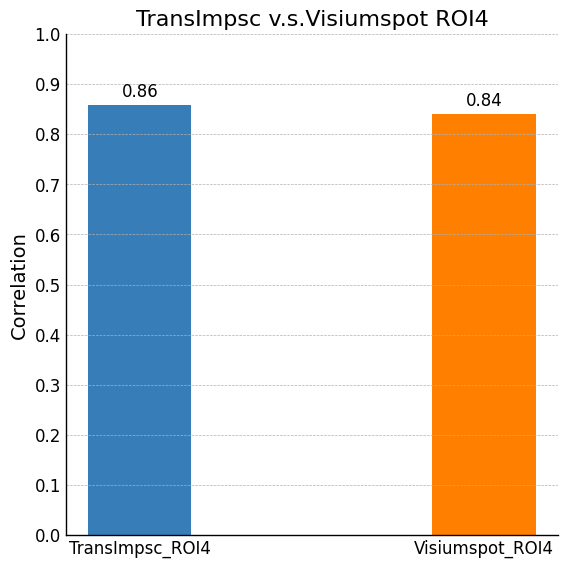

In [139]:
import matplotlib.pyplot as plt
import numpy as np

# 准备数据和标签
data = [corr_TransImpsc_ROI4, corr_Visiumspot_ROI4]
labels = ["TransImpsc_ROI4", "Visiumspot_ROI4"]

# 设定条形图的位置和宽度
x_pos = np.arange(len(labels))
width = 0.3

# 创建自定义图形大小
fig, ax = plt.subplots(figsize=(6, 6))

# 绘制条形图
rects = ax.bar(x_pos, data, width, color=["#377eb8", "#ff7f00"])

# 设置x轴标签
ax.set_xticks(x_pos)
ax.set_xticklabels(labels, fontsize=12)

# 设置y轴标签
ax.set_ylabel("Correlation", fontsize=14)

# 设置标题
ax.set_title("TransImpsc v.s.Visiumspot ROI4", fontsize=16)

# 添加数据标签
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(
            f"{height:.2f}",
            xy=(rect.get_x() + rect.get_width() / 2, height),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=12,
        )

autolabel(rects)

# 设置图形边框样式
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(1)
ax.spines["bottom"].set_linewidth(1)

# 设置刻度样式
ax.tick_params(axis="both", which="both", length=0, labelsize=12)

# 调整y轴刻度和网格线
ax.set_yticks(np.arange(0, 1.1, 0.1))
ax.yaxis.grid(True, linestyle="--", linewidth=0.5)

# 显示图形
plt.tight_layout()
plt.show()

In [140]:
# 您已经计算了这些值，将这里的值替换为实际值
corr_TransImpsc = [corr_TransImpsc_ROI1, corr_TransImpsc_ROI2, corr_TransImpsc_ROI3, corr_TransImpsc_ROI4]  
corr_Visiumspot = [corr_Visiumspot_ROI1, corr_Visiumspot_ROI2, corr_Visiumspot_ROI3, corr_Visiumspot_ROI4]  

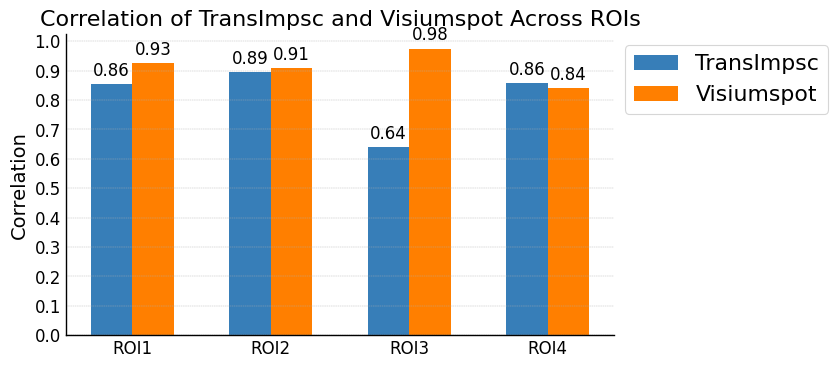

In [146]:
import matplotlib.pyplot as plt
import numpy as np

# 创建自定义图形大小
fig, ax = plt.subplots(figsize=(8.7, 4))

# 绘制条形图
x_pos = np.arange(len(corr_TransImpsc))
width = 0.3

rects1 = ax.bar(x_pos - width/2, corr_TransImpsc, width, color="#377eb8", label="TransImpsc")
rects2 = ax.bar(x_pos + width/2, corr_Visiumspot, width, color="#ff7f00", label="Visiumspot")

# 设置x轴标签
ax.set_xticks(x_pos)
ax.set_xticklabels(["ROI1", "ROI2", "ROI3", "ROI4"], fontsize=12)

# 设置y轴标签
ax.set_ylabel("Correlation", fontsize=14)

# 设置标题
ax.set_title("Correlation of TransImpsc and Visiumspot Across ROIs", fontsize=16)

# 添加数据标签
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(
            f"{height:.2f}",
            xy=(rect.get_x() + rect.get_width() / 2, height),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=12,
        )

autolabel(rects1)
autolabel(rects2)

# 设置图形边框样式
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(1)
ax.spines["bottom"].set_linewidth(1)

# 设置刻度样式
ax.tick_params(axis="both", which="both", length=0, labelsize=12)

# 调整y轴刻度和网格线
ax.set_yticks(np.arange(0, 1.1, 0.1))
ax.yaxis.grid(True, linestyle="--", linewidth=0.3)

# 添加图例
ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

# 显示图形
plt.tight_layout()
# plt.savefig(str(path)+"SpatialData/Data/resultsROIs/cor_celltype_ROI.pdf", dpi=300)
plt.show()